<a href="https://colab.research.google.com/github/MathieuGrosso/projet-dima-/blob/main/Anomaly_detection_MVTEC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importation 

In [1]:
pip install pymicro

In [2]:
import sys
import os
import functools
import pathlib
import pickle
from google.colab import drive
import functools
import pathlib as path
import pickle
import cv2
import seaborn as sns

import numpy as np
import pymicro
from pymicro.file import file_utils
import IPython
from IPython.display import clear_output, Image, display
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.cm as cm

import PIL
from PIL import Image, ImageEnhance
from array import *
from random import shuffle
import numpy as np
import matplotlib
from matplotlib import pyplot as plt, cm

from sklearn.manifold import TSNE, Isomap, MDS
from sklearn.decomposition import PCA
from sklearn.metrics import roc_curve,auc,roc_auc_score
from sklearn.covariance import EmpiricalCovariance

#deep learning import:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import activations
import keras
import tensorflow_datasets as tfds
from keras import layers
from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Dense, Lambda, Flatten, Reshape
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization
from tensorflow.keras.models import Model, load_model
from tensorflow.keras import backend as K
from tensorflow.keras import metrics
from tensorflow.keras.datasets import mnist, fashion_mnist
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras import Sequential
from tensorflow.keras.applications import EfficientNetB0, EfficientNetB1, EfficientNetB2, EfficientNetB3, EfficientNetB4, EfficientNetB5, EfficientNetB6, EfficientNetB7
from tensorflow.keras.applications import EfficientNetB4
from tensorflow.keras.applications import ResNet50, ResNet152, ResNet50V2, ResNet101V2, ResNet152V2
from tensorflow.keras.activations import relu

%matplotlib inline


#Save Data, Load them, and crops them





In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Obtenir les images normales: 
#Mathieu :
# %cd /content/drive/MyDrive/DIMA/Datasets

#Thomas :
%cd /content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets


/content/drive/.shortcut-targets-by-id/141YHvNysE5Oy0N8VzRuv06VEoGfhdqWg/DIMA/Datasets


In [ ]:
#Mathieu :
# data_dir = pathlib.Path('/content/drive/MyDrive/DIMA/Datasets/Data_big_raw') #changer la data_dir #grosse images
#data_dir=pathlib.Path('/content/drive/MyDrive/DIMA/Datasets/Data_reduced_raw/Data_reduced') #petites images

#Thomas :
data_dir = pathlib.Path('/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw') #changer la data_dir #grosse images
#data_dir=pathlib.Path('/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_reduced_raw') #petites images



data_filepath = data_dir / "pa66.raw" #big
labels_filepath = data_dir / "pa66.ground_truth.raw" #big

#data_filepath=data_dir / "data.reduced.raw" #small
#labels_filepath = data_dir / "labels.reduced.raw" #small

In [ ]:
# #ouvrir les fichiers raw: 

# from google.colab import files

# src = list(files.upload().values())[0] #à quoi sert cette ligne ?
# open('read_raw.py','wb').write(src) 





In [ ]:
from read_raw import HST_read

In [ ]:
# this is just a trick to give names to these values
# and put them together
class label:
    matrix = 0
    fiber = 1
    porosity = 2

labels_list = [0, 1, 2]

# dimensions = (512, 512, 64) #reduced
dimensions=(1300,1040,1900) #big
dtype = "uint8"

# prefill the function `HST_read`
hst_read = functools.partial(
    file_utils.HST_read,
    autoparse_filename=False,  # the file names are not properly formatted
    data_type=dtype,
    dims=dimensions,
    verbose=True,)

In [ ]:
data = hst_read(data_filepath)
labels = hst_read(labels_filepath)

data type is uint8
volume size is 1300 x 1040 x 1900
reading volume... from byte 0


In [ ]:
assert data.shape == labels.shape

In [ ]:
random_state = np.random.RandomState(3)

In [ ]:
crop_size = 128  # 128 x 128 pixels square
n_crops = 1000
volume_shape = data.shape
axes_limits = (
    # x and y are smaller because i will get a random
    # coordinate of the left most and upper most pixel of the crop
    (0, volume_shape[0] - crop_size),  # x-axis
    (0, volume_shape[1] - crop_size),  # y-axis
    (0, volume_shape[2]),  # z-axis
)


### crops of data without porosity : 


In [ ]:
def does_not_have_porosity(label_crop_: np.ndarray) -> bool:
    return np.all(label_crop_ != label.porosity)

In [ ]:
condition = does_not_have_porosity

In [ ]:
print(f"found: 0")
crops = []

while len(crops) < n_crops:
    z = random_state.randint(*axes_limits[2])  # min / max in z
    x0 = random_state.randint(*axes_limits[0])
    y0 = random_state.randint(*axes_limits[1])
    x1, y1 = x0 + crop_size, y0 + crop_size
    
    labels_crop = labels[x0:x1, y0:y1, z]
    data_crop = data[x0:x1, y0:y1, z]
    
    if condition(labels_crop):
        crops.append({
            "data": data_crop.copy(),
            "labels": labels_crop.copy(),
        })
        clear_output()
        print(f"found: {len(crops)}")

In [ ]:
without_porosity = crops

###crops of data with porosity: 

In [ ]:
def has_porosity(label_crop_: np.ndarray) -> bool:
    return np.any(label_crop_ == label.porosity)

In [ ]:
condition = has_porosity

In [ ]:
print(f"found: 0")
crops = []

while len(crops) < n_crops:
    z = random_state.randint(*axes_limits[2])  # min / max in z
    x0 = random_state.randint(*axes_limits[0])
    y0 = random_state.randint(*axes_limits[1])
    x1, y1 = x0 + crop_size, y0 + crop_size
    
    labels_crop = labels[x0:x1, y0:y1, z]
    data_crop = data[x0:x1, y0:y1, z]
    
    if condition(labels_crop):
        crops.append({
            "data": data_crop.copy(),
            "labels": labels_crop.copy(),
        })
        clear_output()
        print(f"found: {len(crops)}")


found: 1000


In [ ]:
with_porosity = crops

### Save in drive and load them : 


In [ ]:
len(without_porosity), len(with_porosity)

(1000, 1000)

In [ ]:
without_porosity_folder = (data_dir / f"{crop_size}px-images-WITHOUT-porosity").resolve()
with_porosity_folder = (data_dir / f"{crop_size}px-images-WITH-porosity").resolve()

In [ ]:
without_porosity_folder.mkdir(exist_ok=True)
with_porosity_folder.mkdir(exist_ok=True)

In [ ]:
list_crops = without_porosity
folder = without_porosity_folder

In [ ]:
for idx, crop in enumerate(list_crops):
    data_png_filepath = (folder / f"{idx:06d}-data.png")
    labels_png_filepath = (folder / f"{idx:06d}-labels.png")
    crop_data = crop["data"]
    crop_labels = crop["labels"]
    matplotlib.image.imsave(data_png_filepath, crop_data, cmap=cm.gray, vmin=0, vmax=255)    
    matplotlib.image.imsave(labels_png_filepath, crop_labels, cmap=cm.gray, vmin=0, vmax=2)

In [ ]:
list_crops = with_porosity
folder = with_porosity_folder

In [ ]:
for idx, crop in enumerate(list_crops):
    data_png_filepath = (folder / f"{idx:06d}-data.png")
    labels_png_filepath = (folder / f"{idx:06d}-labels.png")
    crop_data = crop["data"]
    crop_labels = crop["labels"]
    matplotlib.image.imsave(data_png_filepath, crop_data, cmap=cm.gray, vmin=0, vmax=255)    
    matplotlib.image.imsave(labels_png_filepath, crop_labels, cmap=cm.gray, vmin=0, vmax=2)    

##Création de train et test pour DifferNet

In [ ]:
train_folder = data_dir / 'DifferNet' / 'material_class' / 'train' / 'good'
test_good_folder = data_dir / 'DifferNet' / 'material_class' / 'test' / 'good'
test_anomaly_folder = data_dir / 'DifferNet' / 'material_class' / 'test' / 'anomaly'

In [ ]:
train_folder.mkdir(exist_ok=True)
test_good_folder.mkdir(exist_ok=True)
test_anomaly_folder.mkdir(exist_ok=True)

In [ ]:
list_crops = without_porosity

In [ ]:
for idx, crop in enumerate(list_crops):
  if idx<700:
    data_png_filepath = (train_folder / f"{idx:06d}-data.png")
    crop_data = crop["data"]
    matplotlib.image.imsave(data_png_filepath, crop_data, cmap=cm.gray, vmin=0, vmax=255)
  else:
    data_png_filepath = (test_good_folder / f"{idx:06d}-data.png")
    crop_data = crop["data"]
    matplotlib.image.imsave(data_png_filepath, crop_data, cmap=cm.gray, vmin=0, vmax=255)

In [ ]:
list_crops = with_porosity

In [ ]:
for idx, crop in enumerate(list_crops):
  if idx<70:
    data_png_filepath = (test_anomaly_folder / f"{idx:06d}-data.png")
    crop_data = crop["data"]
    matplotlib.image.imsave(data_png_filepath, crop_data, cmap=cm.gray, vmin=0, vmax=255)

# Loading  data of pierre shi instead of ours: 



In [ ]:
# Load google drive and the file
drive.mount('/content/drive')

os.chdir("/content/drive/MyDrive/DIMA/Travaux_de_Shi/anomaly/material_data/")
%cd /content/drive/MyDrive/DIMA/Travaux_de_Shi/anomaly/material_data/


#os.chdir("/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Travaux_de_Shi/anomaly/material_data/")
#%cd /content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Travaux_de_Shi/anomaly/material_data/
!ls

Mounted at /content/drive


FileNotFoundError: ignored

In [ ]:
# Load google drive and the file
drive.mount('/content/drive')

os.chdir("/content/drive/MyDrive/DIMA/Travaux_de_Shi/anomaly/material_data/")
%cd /content/drive/MyDrive/DIMA/Travaux_de_Shi/anomaly/material_data/


#os.chdir("/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Travaux_de_Shi/anomaly/material_data/")
#%cd /content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Travaux_de_Shi/anomaly/material_data/
!ls

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content
'128*128'				  dataset_normal_rotated_test_32_x.npy
 128px-images-WITHOUT-porosity		  dataset_normal_rotated_test_32_y.npy
 128px-images-WITH-porosity		  dataset_normal_rotated_train_32_x.npy
 data_raw				  dataset_normal_rotated_train_32_y.npy
 dataset_anormal_origin_test_32_x.npy	  model_CAE
 dataset_anormal_origin_test_32_y.npy	  model_CAE_1105
 dataset_anormal_rotated_test_32_x.npy	  model_CAE_64
 dataset_anormal_rotated_test_32_y.npy	  model_CAE_newdata
 dataset_normal_deformed_train_32_x.npy   model_VAE
 dataset_normal_deformed_train_32_y.npy   model_VAE_1105
 dataset_normal_origin_test_32_x.npy	  old_material_data
 dataset_normal_origin_test_32_y.npy	  test_gif_ae.gif
 dataset_normal_origin_train_32_x.npy	  test_gif.gif
 dataset_normal_origin_train_32_y.npy	  test_gif_vae.gif


In [ ]:
def create_data_set():
  
  data_dir = pathlib.Path(".").resolve()
  file_list = os.listdir(data_dir)
  file_list_train = {'x' : [], 'y' : []}
  file_list_test = {'x' : [], 'y' : []}

  for file_name in file_list:
      if file_name[-4:] == '.npy':
        key = file_name[-5]
        if 'train' in file_name:
          file_list_train[key].append(file_name)
        elif 'test' in file_name:
          file_list_test[key].append(file_name)
  
  train = {}
  test = {}

  for key in ['x', 'y']:
    train_path = (data_dir / file_list_train[key][0]).resolve()
    test_path = (data_dir / file_list_test[key][0]).resolve()
    train_data = np.load(train_path)
    test_data = np.load(test_path)
    train[key] = train_data
    test[key] = test_data

  if len(file_list_train) > 1:
    for key in ['x', 'y']:
      for i in range(len(file_list_train[key]) - 1):
        path = (data_dir / file_list_train[key][i+1]).resolve()
        data = np.load(path)
        train[key] = np.append(train[key], data, axis=0)

  if len(file_list_test) > 1:
    for key in ['x', 'y']:
      for i in range(len(file_list_test[key]) - 1):
        path = (data_dir / file_list_test[key][i+1]).resolve()
        data = np.load(path)
        test[key] = np.append(test[key], data, axis=0)

  randnum1 = np.random.randint(0,100)
  np.random.seed(randnum1)
  np.random.shuffle(train['x'])
  np.random.seed(randnum1)
  np.random.shuffle(train['y'])
  randnum2 = np.random.randint(0,100)
  np.random.seed(randnum2)
  np.random.shuffle(test['x'])
  np.random.seed(randnum2)
  np.random.shuffle(test['y'])

  train['x'] = train['x'].astype('float32') / 255
  test['x'] = test['x'].astype('float32') / 255
  train['x'] = np.expand_dims(train['x'], axis=3)
  test['x'] = np.expand_dims(test['x'], axis=3)

  return (train['x'],train['y']),(test['x'],test['y'])


In [ ]:
# Get the the training and the test dataset
(x_train, y_train), (x_test, y_test) = create_data_set()

print(type(x_train))
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

x_test_anormal = x_test[y_test==0]
# Display some NORMAL images
n = 10  # how many images we will display
plt.figure(figsize=(20, 20))
for i in range(n):
    # display original
    ax = plt.subplot(5, n, i + 1)
    plt.imshow(x_train[i].reshape(32, 32))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

plt.figure(figsize=(20, 20))
for i in range(n):
    # display original
    ax = plt.subplot(5, n, i + 1)
    plt.imshow(x_test_anormal[i].reshape(32, 32))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()


KeyboardInterrupt: ignored

In [ ]:
#change to RGB :
x_train, x_test = np.squeeze(x_train,axis=3), np.squeeze(x_test,axis=3)
x_train, x_test = np.repeat(x_train[..., np.newaxis], 3, -1), np.repeat(x_test[..., np.newaxis], 3, -1)


In [ ]:
print(x_train.shape)
print(x_test.shape)
print(y_test.shape)
print(y_train.shape)


(16800, 32, 32, 3)
(9600, 32, 32, 3)
(9600,)
(16800,)


In [ ]:
#upscale the data
#num_train = 10000
#IMG_SIZE = 128
#num_train=y_train.shape[0]
#x_train128 = np.zeros((num_train,IMG_SIZE,IMG_SIZE,3))
#for i in range(num_train):
#   new_image = cv2.resize(x_train[i], dsize=(IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_CUBIC)
#   mini = new_image.min()
#   maxi = new_image.max()
#   for j in range(new_image.shape[2]):
#     new_image[:,:,j] = (new_image[:,:,j]-mini)*(1/(maxi-mini))
#   x_train128[i,:new_image.shape[0],:new_image.shape[1],:]=new_image
#print('x_train128.shape: ', x_train128.shape)

In [ ]:
# # num_test = y_test.shape[0]
#num_test = 4000
#x_test128 = np.zeros((num_test,IMG_SIZE,IMG_SIZE,3))
#for i in range(num_test):
   #new_image = cv2.resize(x_test[i], dsize=(IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_CUBIC)
   #mini = new_image.min()
   #maxi = new_image.max()
   #for j in range(new_image.shape[2]):
     #new_image[:,:,j] = (new_image[:,:,j]-mini)*(1/(maxi-mini))
  #x_test128[i,:new_image.shape[0],:new_image.shape[1],:]=new_image
#print('x_test128.shape: ', x_test128.shape)

In [ ]:
# n=5
# plt.figure(figsize=(20, 20))
# for i in range(n):
#     # display original
#     ax = plt.subplot(5, n, i + 1)
#     plt.imshow(x_train128[i])
#     plt.gray()
#     ax.get_xaxis().set_visible(False)
#     ax.get_yaxis().set_visible(False)
# plt.show()

# plt.figure(figsize=(20, 20))
# for i in range(n):
#     # display original
#     ax = plt.subplot(5, n, i + 1)
#     plt.imshow(x_test128[i])
#     plt.gray()
#     ax.get_xaxis().set_visible(False)
#     ax.get_yaxis().set_visible(False)
# plt.show()

#Loading our on data RANDOM

In [19]:
#load google drive and the file
drive.mount('/content/drive')

#Mathieu big data:
#os.chdir("/content/drive/MyDrive/DIMA/Datasets/Data_big_raw")
# %cd /content/drive/MyDrive/DIMA/Datasets/Data_big_raw

#Thomas :
os.chdir("/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw")
%cd /content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw

%ls


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


FileNotFoundError: ignored

In [ ]:
#Mathieu :
# data_dir_normal= '/content/drive/MyDrive/DIMA/Datasets/Data_big_raw/128px-images-WITHOUT-porosity'
# data_dir_anormal= '/content/drive/MyDrive/DIMA/Datasets/Data_big_raw/128px-images-WITH-porosity'

#Thomas :
data_dir_normal= '/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw/128px-images-WITHOUT-porosity'
data_dir_anormal= '/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw/128px-images-WITH-porosity'

In [ ]:
#load des normal images

num_normal = 1000
data_normal=np.zeros((num_normal,128,128,4))
for i in range(num_normal):
  if i<10:
    filename='00000'+str(i)+'-data.png'
  elif 10<=i<100:
    filename='0000'+str(i)+'-data.png'
  elif 100<=i<1000:
    filename='000'+str(i)+'-data.png'
  img=Image.open(os.path.join(data_dir_normal, filename))
  data = np.array(img, dtype='uint8')
  data_normal[i,:,:,:]=data
  if i%200==0:
    print(i)
data_normal = np.delete(data_normal,3,3) #Remove the #255 indication (last column)
data_normal = data_normal.astype('float32') / 255. #Normalization

print(data_normal.shape)


0
200
400
600
800
(1000, 128, 128, 3)


In [ ]:
#load des anormal images

num_anormal = 1000
data_anormal=np.zeros((num_anormal,128,128,4))
for i in range(num_anormal):
  if i<10:
    filename='00000'+str(i)+'-data.png'
  elif 10<=i<100:
    filename='0000'+str(i)+'-data.png'
  elif 100<=i<1000:
    filename='000'+str(i)+'-data.png'
  img=Image.open(os.path.join(data_dir_anormal, filename))
  data = np.array(img, dtype='uint8')
  data_anormal[i,:,:,:]=data
  if i%200==0:
    print(i)
data_anormal = np.delete(data_anormal,3,3) #Remove the #255 indication (last column)
data_anormal = data_anormal.astype('float32') / 255. #Normalization

print(data_anormal.shape)


0
200
400
600
800
(1000, 128, 128, 3)


In [ ]:
#création de x_train et x_test

num_train = 700
num_test = num_normal-num_train
num_test_anormal = 70
num_test_normal = num_test-num_test_anormal
id=0
x_train = np.zeros((num_train,data_normal.shape[1],data_normal.shape[2],data_normal.shape[3]))
x_test_normal = np.zeros((num_test_normal,data_normal.shape[1],data_normal.shape[2],data_normal.shape[3]))
x_test_anormal = np.zeros((num_test_anormal,data_normal.shape[1],data_normal.shape[2],data_normal.shape[3]))

data_normal = np.random.RandomState(seed=3).permutation(data_normal)
data_anormal = np.random.RandomState(seed=3).permutation(data_anormal)

for i in range(num_train):
  x_train[i,:,:,:] = data_normal[i,:,:,:]
y_train = np.zeros((x_train.shape[0],1))
for i in range(num_normal-1,num_train+num_test_anormal,-1):
  x_test_normal[id,:,:,:] = data_normal[i,:,:,:]
  id += 1
y_test_normal = np.zeros((x_test_normal.shape[0],1), dtype='int8')
for i in range(num_test_anormal):
  x_test_anormal[i,:,:,:] = data_anormal[i,:,:,:]
y_test_anormal = np.ones((x_test_anormal.shape[0],1), dtype='int8')

x_test = np.append(x_test_normal,x_test_anormal,axis=0)
y_test = np.append(y_test_normal,y_test_anormal,axis=0)
x_test = np.random.RandomState(seed=3).permutation(x_test)
y_test = np.random.RandomState(seed=3).permutation(y_test)

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)


(700, 128, 128, 3)
(700, 1)
(300, 128, 128, 3)
(300, 1)


# Loading our own data

##build the data for the training and testing set: 

In [21]:
#load google drive and the file
drive.mount('/content/drive')

#Mathieu big data:
os.chdir("/content/drive/MyDrive/DIMA/Datasets/Data_big_raw")
%cd /content/drive/MyDrive/DIMA/Datasets/Data_big_raw

#mathieu: small pictures
#os.chdir("/content/drive/MyDrive/DIMA/Datasets/Data_reduced_raw/Data_reduced")
#%cd /content/drive/MyDrive/DIMA/Datasets/Data_reduced_raw/Data_reduced

#Thomas :
#os.chdir("/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw")
#%cd /content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw

%ls


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content
128px-images-WITHOUT-porosity/          dataset_normal_rotated_train_32_y.npy
128px-images-WITH-porosity/             DifferNet/
dataset_anormal_origin_test_32_x.npy    gradient_maps/
dataset_anormal_origin_test_32_y.npy    models/
dataset_anormal_rotated_test_32_x.npy   pa66.ground_truth.raw
dataset_anormal_rotated_test_32_y.npy   pa66.ground_truth.raw.info
dataset_normal_deformed_train_32_x.npy  pa66.raw
dataset_normal_deformed_train_32_y.npy  pa66.raw.info
dataset_normal_origin_test_32_x.npy     pa66.test.error_volume.raw
dataset_normal_origin_test_32_y.npy     pa66.test.error_volume.raw.info
dataset_normal_origin_train_32_x.npy    pa66.test.prediction.raw
dataset_normal_origin_train_32_y.npy    pa66.test.prediction.raw.info
dataset_normal_rotated_test_32_x.npy    __pycache__/
dataset_normal_rotated_test_32_y.npy    weights/
dataset_normal_rotated

## Create dataset thanks to our data: 

In [ ]:
#load de x_train
# on a des fichiers png, on va essayer de les load: 
#128px-images-WITHOUT-porosity: normal image
#128px-images-WITH-porosity: anormal image

#Mathieu  big pictures:
data_dir_normal= '/content/drive/MyDrive/DIMA/Datasets/Data_big_raw/128px-images-WITHOUT-porosity'


#mathieu : small pictures: 
#data_dir_normal='/content/drive/MyDrive/DIMA/Datasets/Data_reduced_raw/Data_reduced/128px-images-WITHOUT-porosity'

#Thomas :
#data_dir_normal= '/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw/128px-images-WITHOUT-porosity'

num_train = 500
x_train=np.zeros((num_train,128,128,4))
for i in range(num_train):
  if i<10:
    filename='00000'+str(i)+'-data.png'
  elif 10<=i<100:
    filename='0000'+str(i)+'-data.png'
  elif 100<=i<1000:
    filename='000'+str(i)+'-data.png'
  img=Image.open(os.path.join(data_dir_normal, filename))
  data = np.array(img, dtype='uint8')
  x_train[i,:,:,:]=data
  if i%200==0:
    print(i)
x_train = np.delete(x_train,3,3) #Remove the #255 indication (last column)
x_train = x_train.astype('float32') / 255. #Normalization

y_train = np.zeros((num_train,1),dtype='int8')
print(x_train.shape)
print(y_train.shape)




0
200
400
(500, 128, 128, 3)
(500, 1)


In [ ]:
#print label for train: 
num_train = 500
y_train_label=np.zeros((num_train,128,128,4))
for i in range(num_train):
  if i<10:
    filename='00000'+str(i)+'-labels.png'
  elif 10<=i<100:
    filename='0000'+str(i)+'-labels.png'
  elif 100<=i<1000:
    filename='000'+str(i)+'-labels.png'
  img=Image.open(os.path.join(data_dir_normal, filename))
  data = np.array(img, dtype='uint8')
  y_train_label[i,:,:,:]=data
  if i%200==0:
    print(i)
y_train_label = np.delete(y_train_label,3,3) #Remove the #255 indication (last column)
y_train_label = y_train_label.astype('float32') / 255. #Normalization


print(y_train_label.shape)

0
200
400
(500, 128, 128, 3)


In [ ]:
#load de x_test

#Mathieu big pictures:
# data_dir_anormal= '/content/drive/MyDrive/DIMA/Datasets/Data_big_raw/128px-images-WITH-porosity'

#mathieu: small pictures
#data_dir_anormal='/content/drive/MyDrive/DIMA/Datasets/Data_reduced_raw/Data_reduced/128px-images-WITH-porosity'


#Thomas :
data_dir_anormal= '/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw/128px-images-WITH-porosity'

num_test = 150
num_anormal = 50
num_normal = num_test-num_anormal
x_test_normal = np.zeros((num_normal,128,128,4))
id=0
for i in range(1000,1000-num_normal+1,-1) :
  if i<10:
    filename='00000'+str(i)+'-data.png'
  elif 10<=i<100:
    filename='0000'+str(i)+'-data.png'
  elif 100<=i<1000:
    filename='000'+str(i)+'-data.png'
  img=Image.open(os.path.join(data_dir_normal, filename))
  data = np.array(img, dtype='uint8')
  x_test_normal[id,:,:,:]=data
  id+=1
x_test_normal = np.delete(x_test_normal,3,3) #Remove the #255 indication (last column)
x_test_normal = x_test_normal.astype('float32') / 255. #Normalization

y_test_normal = np.zeros((num_normal,1),dtype='int8')


x_test_anormal=np.zeros((num_anormal,128,128,4))
for i in range(num_anormal):
  if i<10:
    filename='00000'+str(i)+'-data.png'
  elif 10<=i<100:
    filename='0000'+str(i)+'-data.png'
  elif 100<=i<1000:
    filename='000'+str(i)+'-data.png'
  img=Image.open(os.path.join(data_dir_anormal, filename))
  data = np.array(img, dtype='uint8')
  x_test_anormal[i,:,:,:]=data
x_test_anormal = np.delete(x_test_anormal,3,3) #Remove the #255 indication (last column)
x_test_anormal = x_test_anormal.astype('float32') / 255. #Normalization

y_test_anormal = np.ones((num_anormal,1),dtype='int8')

x_test = np.append(x_test_normal[:(num_normal)],x_test_anormal,axis=0) #add some normal examples
y_test = np.append(y_test_normal[:(num_normal)],y_test_anormal,axis=0)
x_test = np.random.RandomState(seed=3).permutation(x_test)
y_test = np.random.RandomState(seed=3).permutation(y_test)


In [ ]:
#print label : 
num_test = 150

num_anormal = 50
num_normal = num_test-num_anormal
y_test_normal_label = np.zeros((num_normal,128,128,4))
id=0
for i in range(1000,1000-num_normal+1,-1):
  if i<10:
    filename='00000'+str(i)+'-labels.png'
  elif 10<=i<100:
    filename='0000'+str(i)+'-labels.png'
  elif 100<=i<1000:
    filename='000'+str(i)+'-labels.png'
  img=Image.open(os.path.join(data_dir_normal, filename))
  data = np.array(img, dtype='uint8')
  y_test_normal_label[id,:,:,:]=data
  id+=1
y_test_normal_label = np.delete(y_test_normal_label,3,3) #Remove the #255 indication (last column)
y_test_normal_label = y_test_normal_label.astype('float32') / 255. #Normalization




y_test_anormal_label=np.zeros((num_anormal,128,128,4))
for i in range(num_anormal):
  if i<10:
    filename='00000'+str(i)+'-labels.png'
  elif 10<=i<100:
    filename='0000'+str(i)+'-labels.png'
  elif 100<=i<1000:
    filename='000'+str(i)+'-labels.png'
  img=Image.open(os.path.join(data_dir_anormal, filename))
  data = np.array(img, dtype='uint8')
  y_test_anormal_label[i,:,:,:]=data
y_test_anormal_label = np.delete(y_test_anormal_label,3,3) #Remove the #255 indication (last column)
y_test_anormal_label = y_test_anormal_label.astype('float32') / 255. #Normalization

y_test_label = np.append(y_test_normal_label[:(num_normal)],y_test_anormal_label,axis=0) #add some normal examples

y_test_label = np.random.RandomState(seed=3).permutation(y_test_label)


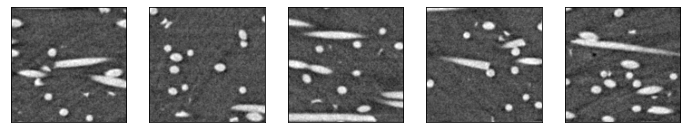

In [ ]:
#plot some test examples
plt.figure(figsize=(12, 4))
m=5
for i in range(m):
    # display original
    ax = plt.subplot(1, m, i + 1)
    plt.imshow(x_test[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

##Processing the data:  (mostly sanity check)

In [ ]:
# check if there is common data in  both datasets:
def checking(list,num_train,num_test,x_train,x_test):
  for j in range(num_train):
    for i in range(num_test):
      liste_data.append((np.array_equal(x_train[j],x_test[i])))

# faire un compteur pour savoir quel combinason il fait ! 

def count_occurrences(list,value): 
	cnt = 0 
	for elem in list: 
		if elem is value: 
			cnt += 1 
	return cnt 

def iterated_index(liste, value):
    
    for i in range(len(liste)):
        if liste[i] == value:
            iterated_index_list.append(i)
    return iterated_index_list




In [ ]:
# check if there is common data in  both datasets: 
liste_data=[]
iterated_index_list = []
checking(liste_data,num_train,num_test,x_train,x_test)

print(len(liste_data))  

print(count_occurrences(liste_data,True))

iterated_index(liste_data,True)
print('Indexes of all occurrences of a True in the list are : ', iterated_index_list)

75000
1
Indexes of all occurrences of a True in the list are :  [147]


In [ ]:
def find_identical_array(num_train,num_test,x_train,x_test):
  for j in range(num_train):
    for i in range(num_test):
      if (np.array_equal(x_train[j],x_test[i]))==True:
        print(j,i)

      

In [ ]:
find_identical_array(num_train,num_test,x_train,x_test)


0 147


In [ ]:
#mettre la valeur de droite dans le delete, on peut en mettre plusieurs dans la liste
x_test=np.delete(x_test,[147],0)
y_test=np.delete(y_test,[147],0)
y_test_label=np.delete(y_test_label,[147],0)

In [ ]:
#sanity check:  how many identical data and shape : 

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)



liste_data=[]
iterated_index_list = []
checking(liste_data,num_train-4,num_test-4,x_train,x_test)

print(len(liste_data))  

print(count_occurrences(liste_data,True))

iterated_index(liste_data,True)
print('Indexes of all occurrences of a True in the list are : ', iterated_index_list)

(500, 128, 128, 3)
(500, 1)
(149, 128, 128, 3)
(149, 1)
72416
0
Indexes of all occurrences of a True in the list are :  []


##Preprocessing avec un seuil :

In [ ]:
seuils = [0.05, 0.08, 0.1, 0.12, 0.15, 0.17, 0.2, 0.22, 0.25, 0.27, 0.3, 0.35, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
base_model= EfficientNetB4(weights='imagenet',include_top=False)

for seuil in seuils:
  #Création de x_train_seuil
  x_train_seuil = np.ones(x_train.shape)
  for i in range(x_train.shape[0]):
    x_train_seuil[i] = x_train[i]

  for l in range(x_train_seuil.shape[0]):
    for i in range(x_train_seuil[l].shape[0]):
      for j in range(x_train_seuil[l].shape[1]):
        for k in range(x_train_seuil[l].shape[2]):
          if x_train_seuil[l][i][j][k]>seuil:
            x_train_seuil[l][i][j][k] = 1

  #Création de x_test_seuil
  x_test_seuil = np.ones(x_test.shape)
  for i in range(x_test.shape[0]):
    x_test_seuil[i] = x_test[i]

  for l in range(x_test_seuil.shape[0]):
    for i in range(x_test_seuil[l].shape[0]):
      for j in range(x_test_seuil[l].shape[1]):
        for k in range(x_test_seuil[l].shape[2]):
          if x_test_seuil[l][i][j][k]>seuil:
            x_test_seuil[l][i][j][k] = 1

  #utilisation de la méthode fonctionnelle pour créer les différents modèles: 
  listeB4=['block1b_project_conv','block2d_project_conv','block3d_project_conv','block4f_project_conv','block5e_project_conv','block6h_project_conv','block7a_activation','block7a_project_conv','block7b_project_conv','top_bn','top_activation']

  block_train_features=[]
  block_test_features=[]

  for block in listeB4:
    # print(block)
    prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
    input=base_model.input
    prev_model = prev_model(input)
    #x=layers.GlobalMaxPooling2D(data_format=None)(prev_model)
    x=layers.GlobalAveragePooling2D(data_format=None)(prev_model)
    x=layers.Dropout(0.1)(x)
    #output=layers.Dense(32)(x)
    output=layers.Flatten()(x)
    model=keras.Model(input,output,name=(block))
    # model.summary()
    # model.save(block)
    block_train_features.append(model.predict(x_train_seuil))
    block_test_features.append(model.predict(x_test_seuil))

  #dans block train features les 7premiers niveaux correspondent à efficient net b1, puis les 7 suivant à b4, puis à B6. 
  class_num = 1

  res_maha=[]

  for k in range(len(listeB4)+1):
      errs = []
      level = k
      z_train = block_train_features[k-1]
      z_test = block_test_features[k-1]
      emp_cov = EmpiricalCovariance().fit(z_train)
      # print(z_test.shape)
      
      errs = emp_cov.mahalanobis(np.nan_to_num(z_test))
      res_maha.append(roc_auc_score(y_test==1, errs))
  best_res = max(res_maha)
  best_level = res_maha.index(best_res)+1
  print('The best AUC score for seuil %.2f is %.2f for level %d' % (seuil, best_res, best_level))

The best AUC score for seuil 0.02 is 0.79 for level 6
The best AUC score for seuil 0.05 is 0.86 for level 5
The best AUC score for seuil 0.08 is 0.91 for level 7
The best AUC score for seuil 0.10 is 0.92 for level 11
The best AUC score for seuil 0.12 is 0.90 for level 6
The best AUC score for seuil 0.15 is 0.90 for level 11
The best AUC score for seuil 0.17 is 0.91 for level 9
The best AUC score for seuil 0.20 is 0.89 for level 6
The best AUC score for seuil 0.25 is 0.81 for level 7
The best AUC score for seuil 0.30 is 0.78 for level 8
The best AUC score for seuil 0.40 is 0.81 for level 4
The best AUC score for seuil 0.50 is 0.81 for level 1
The best AUC score for seuil 0.60 is 0.81 for level 10
The best AUC score for seuil 0.70 is 0.81 for level 4
The best AUC score for seuil 0.80 is 0.80 for level 4
The best AUC score for seuil 0.90 is 0.81 for level 8


In [ ]:
seuil = 0.15
#Création de x_train_seuil
x_train_seuil = np.ones(x_train.shape)
for i in range(x_train.shape[0]):
  x_train_seuil[i] = x_train[i]

for l in range(x_train_seuil.shape[0]):
  for i in range(x_train_seuil[l].shape[0]):
    for j in range(x_train_seuil[l].shape[1]):
      for k in range(x_train_seuil[l].shape[2]):
        if x_train_seuil[l][i][j][k]>seuil:
          x_train_seuil[l][i][j][k] = 1

In [ ]:
#Création de x_test_seuil
x_test_seuil = np.ones(x_test.shape)
for i in range(x_test.shape[0]):
  x_test_seuil[i] = x_test[i]

for l in range(x_test_seuil.shape[0]):
  for i in range(x_test_seuil[l].shape[0]):
    for j in range(x_test_seuil[l].shape[1]):
      for k in range(x_test_seuil[l].shape[2]):
        if x_test_seuil[l][i][j][k]>seuil:
          x_test_seuil[l][i][j][k] = 1

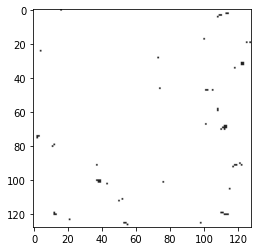

In [ ]:
plt.imshow(x_test_seuil[0])

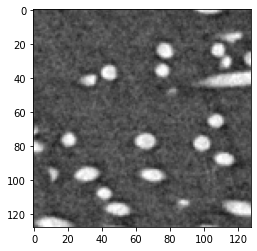

In [ ]:
plt.imshow(x_test[0])

In [ ]:
#utilisation de la méthode fonctionnelle pour créer les différents modèles: 
listeB4=['block1b_project_conv','block2d_project_conv','block3d_project_conv','block4f_project_conv','block5e_project_conv','block6h_project_conv','block7a_activation','block7a_project_conv','block7b_project_conv','top_bn','top_activation']
listeB5=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5g_project_conv','block6i_project_conv','block7b_project_conv']
listeB6=['block1c_project_conv','block2f_project_conv','block3f_project_conv','block4h_project_conv','block5h_project_conv','block6k_project_conv','block7c_project_conv']
listeB1=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5c_project_conv','block6c_project_conv','block7b_project_conv']
listeRS50=['conv1_conv','conv2_block3_3_conv','conv3_block4_3_conv','conv4_block6_3_conv','conv5_block3_3_conv']
listeRS152=['conv1_conv','conv2_block3_3_conv','conv3_block3_3_conv','conv4_block36_3_conv','conv5_block3_3_conv']
listeRS50V2=['pool1_pool', 'conv2_block3_3_conv','conv3_block4_3_conv','max_pooling2d_2','conv4_block6_3_conv','conv5_block3_3_conv']

block_train_features=[]
block_test_features=[]

for block in listeB4:
  print(block)
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  prev_model = prev_model(input)
  #x=layers.GlobalMaxPooling2D(data_format=None)(prev_model)
  x=layers.GlobalAveragePooling2D(data_format=None)(prev_model)
  x=layers.Dropout(0.1)(x)
  #output=layers.Dense(32)(x)
  
  output=layers.Flatten()(x)
  model=keras.Model(input,output,name=(block))
  # model.summary()
  # model.save(block)
  block_train_features.append(model.predict(x_train_seuil))
  block_test_features.append(model.predict(x_test_seuil))


block1b_project_conv
block2d_project_conv
block3d_project_conv
block4f_project_conv
block5e_project_conv
block6h_project_conv
block7a_activation
block7a_project_conv
block7b_project_conv
top_bn
top_activation


In [ ]:
#dans block train features les 7premiers niveaux correspondent à efficient net b1, puis les 7 suivant à b4, puis à B6. 
class_num = 1

res_maha=[]

for k in range(len(listeB4)+1):
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    print(z_test.shape)
    
    errs = emp_cov.mahalanobis(np.nan_to_num(z_test))
    res_maha.append(roc_auc_score(y_test==1, errs))
    print('The AUC score for level %d is %.2f' % (k, res_maha[-1]))

(150, 1792)
The AUC score for level 0 is 0.85
(150, 24)
The AUC score for level 1 is 0.48
(150, 32)
The AUC score for level 2 is 0.85
(150, 56)
The AUC score for level 3 is 0.81
(150, 112)
The AUC score for level 4 is 0.85
(150, 160)
The AUC score for level 5 is 0.85
(150, 272)
The AUC score for level 6 is 0.83
(150, 1632)
The AUC score for level 7 is 0.85
(150, 448)
The AUC score for level 8 is 0.83
(150, 448)
The AUC score for level 9 is 0.84
(150, 1792)
The AUC score for level 10 is 0.83
(150, 1792)
The AUC score for level 11 is 0.85


##Preprocessing en augmentant contraste

In [ ]:
#load google drive and the file
drive.mount('/content/drive')

#Mathieu big data:
# os.chdir("/content/drive/MyDrive/DIMA/Datasets/Data_big_raw")
# %cd /content/drive/MyDrive/DIMA/Datasets/Data_big_raw

#mathieu: small pictures
#os.chdir("/content/drive/MyDrive/DIMA/Datasets/Data_reduced_raw/Data_reduced")
#%cd /content/drive/MyDrive/DIMA/Datasets/Data_reduced_raw/Data_reduced

#Thomas :
os.chdir("/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw")
%cd /content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw

%ls

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content
 128px-images-WITHOUT-porosity/           keras-grad-cam.zip
 128px-images-WITH-porosity/              model0/
 block1b_project_conv/                    model1/
 block2d_project_conv/                    model2/
 block3d_project_conv/                    model3/
 block4f_project_conv/                    model4/
 block5f_project_conv/                    model5/
 block6h_project_conv/                    model6/
 block7b_project_conv/                    model_CAE_1105/
 cam.jpg                                  more-contrast-image.png
 dataset_anormal_origin_test_32_x.npy     pa66.ground_truth.raw
 dataset_anormal_origin_test_32_y.npy     pa66.ground_truth.raw.info
 dataset_anormal_rotated_test_32_x.npy    pa66.raw
 dataset_anormal_rotated_test_32_y.npy    pa66.raw.info
 dataset_normal_deformed_train_32_x.npy   pa66.test.error_volume.raw
 dataset_normal_de

In [ ]:
#Définition du facteur pour le contraste. 1 = image d'origine.
factors = [1.3, 1.5, 1.8, 2, 2.2, 2.5, 2.7, 3, 4]

#Mathieu  big pictures:
# data_dir_normal= '/content/drive/MyDrive/DIMA/Datasets/Data_big_raw/128px-images-WITHOUT-porosity'
#mathieu : small pictures: 
#data_dir_normal='/content/drive/MyDrive/DIMA/Datasets/Data_reduced_raw/Data_reduced/128px-images-WITHOUT-porosity'

#Thomas :
data_dir_normal= '/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw/128px-images-WITHOUT-porosity'

#Mathieu big pictures:
# data_dir_anormal= '/content/drive/MyDrive/DIMA/Datasets/Data_big_raw/128px-images-WITH-porosity'
#mathieu: small pictures
#data_dir_anormal='/content/drive/MyDrive/DIMA/Datasets/Data_reduced_raw/Data_reduced/128px-images-WITH-porosity'

#Thomas :
data_dir_anormal= '/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw/128px-images-WITH-porosity'

base_model= EfficientNetB4(weights='imagenet',include_top=False)

num_train = 500
num_test = 150
num_anormal = 50
num_normal = num_test-num_anormal
for factor in factors:
  #load de x_train
  x_train=np.zeros((num_train,128,128,4))
  for i in range(num_train):
    if i<10:
      filename='00000'+str(i)+'-data.png'
    elif 10<=i<100:
      filename='0000'+str(i)+'-data.png'
    elif 100<=i<1000:
      filename='000'+str(i)+'-data.png'
    img=Image.open(os.path.join(data_dir_normal, filename))
    enhancer = ImageEnhance.Contrast(img)
    img = enhancer.enhance(factor)
    data = np.array(img, dtype='uint8')
    x_train[i,:,:,:]=data
    # if i%200==0:
    #   print(i)
  x_train = np.delete(x_train,3,3) #Remove the #255 indication (last column)
  x_train = x_train.astype('float32') / 255. #Normalization
  y_train = np.zeros((num_train,1),dtype='int8')
  # print(x_train.shape)

  #load de x_test
  x_test_normal = np.zeros((num_normal,128,128,4))
  id=0
  for i in range(1000,1000-num_normal+1,-1) :
    if i<10:
      filename='00000'+str(i)+'-data.png'
    elif 10<=i<100:
      filename='0000'+str(i)+'-data.png'
    elif 100<=i<1000:
      filename='000'+str(i)+'-data.png'
    img=Image.open(os.path.join(data_dir_normal, filename))
    enhancer = ImageEnhance.Contrast(img)
    img = enhancer.enhance(factor)
    data = np.array(img, dtype='uint8')
    x_test_normal[id,:,:,:]=data
    id+=1
  x_test_normal = np.delete(x_test_normal,3,3) #Remove the #255 indication (last column)
  x_test_normal = x_test_normal.astype('float32') / 255. #Normalization
  y_test_normal = np.zeros((num_normal,1),dtype='int8')
  x_test_anormal=np.zeros((num_anormal,128,128,4))
  for i in range(num_anormal):
    if i<10:
      filename='00000'+str(i)+'-data.png'
    elif 10<=i<100:
      filename='0000'+str(i)+'-data.png'
    elif 100<=i<1000:
      filename='000'+str(i)+'-data.png'
    img=Image.open(os.path.join(data_dir_anormal, filename))
    data = np.array(img, dtype='uint8')
    x_test_anormal[i,:,:,:]=data
  x_test_anormal = np.delete(x_test_anormal,3,3) #Remove the #255 indication (last column)
  x_test_anormal = x_test_anormal.astype('float32') / 255. #Normalization
  y_test_anormal = np.ones((num_anormal,1),dtype='int8')
  x_test = np.append(x_test_normal[:(num_normal)],x_test_anormal,axis=0) #add some normal examples
  y_test = np.append(y_test_normal[:(num_normal)],y_test_anormal,axis=0)
  x_test = np.random.RandomState(seed=3).permutation(x_test)
  y_test = np.random.RandomState(seed=3).permutation(y_test)

  #utilisation de la méthode fonctionnelle pour créer les différents modèles: 
  listeB4=['block1b_project_conv','block2d_project_conv','block3d_project_conv','block4f_project_conv','block5e_project_conv','block6h_project_conv','block7a_activation','block7a_project_conv','block7b_project_conv','top_bn','top_activation']
  block_train_features=[]
  block_test_features=[]
  for block in listeB4:
    # print(block)
    prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
    input=base_model.input
    prev_model = prev_model(input)
    #x=layers.GlobalMaxPooling2D(data_format=None)(prev_model)
    x=layers.GlobalAveragePooling2D(data_format=None)(prev_model)
    x=layers.Dropout(0.1)(x)
    #output=layers.Dense(32)(x)
    output=layers.Flatten()(x)
    model=keras.Model(input,output,name=(block))
    # model.summary()
    # model.save(block)
    block_train_features.append(model.predict(x_train))
    block_test_features.append(model.predict(x_test))

  #Calcul de l'AUC score 
  class_num = 1
  res_maha=[]
  for k in range(len(listeB4)+1):
      errs = []
      level = k
      z_train = block_train_features[k-1]
      z_test = block_test_features[k-1]
      emp_cov = EmpiricalCovariance().fit(z_train)
      # print(z_test.shape)
      errs = emp_cov.mahalanobis(np.nan_to_num(z_test))
      res_maha.append(roc_auc_score(y_test==1, errs))
  best_res = max(res_maha)
  best_level = res_maha.index(best_res)+1
  print('The AUC score for factor %.2f and level %d is %.2f' % (factor, best_level, best_res))



The AUC score for factor 1.30 and level 3 is 0.53
The AUC score for factor 1.50 and level 3 is 0.61
The AUC score for factor 1.80 and level 3 is 0.77
The AUC score for factor 2.00 and level 3 is 0.85
The AUC score for factor 2.20 and level 2 is 0.97
The AUC score for factor 2.50 and level 3 is 0.98
The AUC score for factor 2.70 and level 3 is 0.99
The AUC score for factor 3.00 and level 3 is 0.99


In [ ]:
factor = 2
img=Image.open(os.path.join(data_dir_anormal, '000101-data.png'))
enhancer = ImageEnhance.Contrast(img)
img_contrast = enhancer.enhance(factor)
data = np.array(img_contrast, dtype='uint8')
plt.figure()
plt.imshow(img)
plt.figure()
plt.imshow(img_contrast)

##Preprocessing en combinant seuil et contraste:

In [ ]:
#Définition du facteur pour le contraste. 1 = image d'origine.
factors = [1, 1.3, 1.5, 1.8, 2, 2.2, 2.5, 2.7, 3, 3.4]
seuils = [0.05, 0.08, 0.1, 0.12, 0.15, 0.17, 0.2, 0.22, 0.25, 0.27, 0.3, 0.35, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
listeB4=['block1b_project_conv','block2d_project_conv','block3d_project_conv','block4f_project_conv','block5e_project_conv','block6h_project_conv','block7a_activation','block7a_project_conv','block7b_project_conv','top_bn','top_activation']

#Mathieu  big pictures:
# data_dir_normal= '/content/drive/MyDrive/DIMA/Datasets/Data_big_raw/128px-images-WITHOUT-porosity'
#mathieu : small pictures: 
#data_dir_normal='/content/drive/MyDrive/DIMA/Datasets/Data_reduced_raw/Data_reduced/128px-images-WITHOUT-porosity'

#Thomas :
data_dir_normal= '/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw/128px-images-WITHOUT-porosity'

#Mathieu big pictures:
# data_dir_anormal= '/content/drive/MyDrive/DIMA/Datasets/Data_big_raw/128px-images-WITH-porosity'
#mathieu: small pictures
#data_dir_anormal='/content/drive/MyDrive/DIMA/Datasets/Data_reduced_raw/Data_reduced/128px-images-WITH-porosity'

#Thomas :
data_dir_anormal= '/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw/128px-images-WITH-porosity'

base_model= EfficientNetB4(weights='imagenet',include_top=False)

num_train = 500
num_test = 150
num_anormal = 50
num_normal = num_test-num_anormal
for factor in factors:
  print('For factor %.2f :' % (factor))
  #load de x_train
  x_train=np.zeros((num_train,128,128,4))
  for i in range(num_train):
    if i<10:
      filename='00000'+str(i)+'-data.png'
    elif 10<=i<100:
      filename='0000'+str(i)+'-data.png'
    elif 100<=i<1000:
      filename='000'+str(i)+'-data.png'
    img=Image.open(os.path.join(data_dir_normal, filename))
    enhancer = ImageEnhance.Contrast(img)
    img = enhancer.enhance(factor)
    data = np.array(img, dtype='uint8')
    x_train[i,:,:,:]=data
    # if i%200==0:
    #   print(i)
  x_train = np.delete(x_train,3,3) #Remove the #255 indication (last column)
  x_train = x_train.astype('float32') / 255. #Normalization
  y_train = np.zeros((num_train,1),dtype='int8')
  # print(x_train.shape)

  #load de x_test
  x_test_normal = np.zeros((num_normal,128,128,4))
  id=0
  for i in range(1000,1000-num_normal+1,-1) :
    if i<10:
      filename='00000'+str(i)+'-data.png'
    elif 10<=i<100:
      filename='0000'+str(i)+'-data.png'
    elif 100<=i<1000:
      filename='000'+str(i)+'-data.png'
    img=Image.open(os.path.join(data_dir_normal, filename))
    enhancer = ImageEnhance.Contrast(img)
    img = enhancer.enhance(factor)
    data = np.array(img, dtype='uint8')
    x_test_normal[id,:,:,:]=data
    id+=1
  x_test_normal = np.delete(x_test_normal,3,3) #Remove the #255 indication (last column)
  x_test_normal = x_test_normal.astype('float32') / 255. #Normalization
  y_test_normal = np.zeros((num_normal,1),dtype='int8')
  x_test_anormal=np.zeros((num_anormal,128,128,4))
  for i in range(num_anormal):
    if i<10:
      filename='00000'+str(i)+'-data.png'
    elif 10<=i<100:
      filename='0000'+str(i)+'-data.png'
    elif 100<=i<1000:
      filename='000'+str(i)+'-data.png'
    img=Image.open(os.path.join(data_dir_anormal, filename))
    data = np.array(img, dtype='uint8')
    x_test_anormal[i,:,:,:]=data
  x_test_anormal = np.delete(x_test_anormal,3,3) #Remove the #255 indication (last column)
  x_test_anormal = x_test_anormal.astype('float32') / 255. #Normalization
  y_test_anormal = np.ones((num_anormal,1),dtype='int8')
  x_test = np.append(x_test_normal[:(num_normal)],x_test_anormal,axis=0) #add some normal examples
  y_test = np.append(y_test_normal[:(num_normal)],y_test_anormal,axis=0)
  x_test = np.random.RandomState(seed=3).permutation(x_test)
  y_test = np.random.RandomState(seed=3).permutation(y_test)

  for seuil in seuils:
    #Création de x_train_seuil
    x_train_seuil = np.ones(x_train.shape)
    for i in range(x_train.shape[0]):
      x_train_seuil[i] = x_train[i]
    for l in range(x_train_seuil.shape[0]):
      for i in range(x_train_seuil[l].shape[0]):
        for j in range(x_train_seuil[l].shape[1]):
          for k in range(x_train_seuil[l].shape[2]):
            if x_train_seuil[l][i][j][k]>seuil:
              x_train_seuil[l][i][j][k] = 1

    #Création de x_test_seuil
    x_test_seuil = np.ones(x_test.shape)
    for i in range(x_test.shape[0]):
      x_test_seuil[i] = x_test[i]
    for l in range(x_test_seuil.shape[0]):
      for i in range(x_test_seuil[l].shape[0]):
        for j in range(x_test_seuil[l].shape[1]):
          for k in range(x_test_seuil[l].shape[2]):
            if x_test_seuil[l][i][j][k]>seuil:
              x_test_seuil[l][i][j][k] = 1
    
    #utilisation de la méthode fonctionnelle pour créer les différents modèles: 
    block_train_features=[]
    block_test_features=[]
    for block in listeB4:
      # print(block)
      prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
      input=base_model.input
      prev_model = prev_model(input)
      #x=layers.GlobalMaxPooling2D(data_format=None)(prev_model)
      x=layers.GlobalAveragePooling2D(data_format=None)(prev_model)
      x=layers.Dropout(0.1)(x)
      #output=layers.Dense(32)(x)
      output=layers.Flatten()(x)
      model=keras.Model(input,output,name=(block))
      # model.summary()
      # model.save(block)
      block_train_features.append(model.predict(x_train_seuil))
      block_test_features.append(model.predict(x_test_seuil))

    #Calcul de l'AUC score
    class_num = 1
    res_maha=[]
    for k in range(len(listeB4)+1):
        errs = []
        level = k
        z_train = block_train_features[k-1]
        z_test = block_test_features[k-1]
        emp_cov = EmpiricalCovariance().fit(z_train)
        # print(z_test.shape)
        errs = emp_cov.mahalanobis(np.nan_to_num(z_test))
        res_maha.append(roc_auc_score(y_test==1, errs))
    best_res = max(res_maha)
    best_level = res_maha.index(best_res)+1
    print('The best AUC score for seuil %.2f is %.2f for level %d' % (seuil, best_res, best_level))




For factor 1.30
The best AUC score for seuil 0.02 is 0.48 for level 10
The best AUC score for seuil 0.05 is 0.53 for level 2
The best AUC score for seuil 0.08 is 0.48 for level 2
The best AUC score for seuil 0.10 is 0.61 for level 2
The best AUC score for seuil 0.12 is 0.32 for level 2
The best AUC score for seuil 0.15 is 0.48 for level 2
The best AUC score for seuil 0.17 is 0.33 for level 2
The best AUC score for seuil 0.20 is 0.52 for level 2
The best AUC score for seuil 0.25 is 0.89 for level 3
The best AUC score for seuil 0.30 is 0.86 for level 2
The best AUC score for seuil 0.40 is 0.72 for level 4
The best AUC score for seuil 0.50 is 0.70 for level 4
The best AUC score for seuil 0.60 is 0.68 for level 4
The best AUC score for seuil 0.70 is 0.68 for level 3
The best AUC score for seuil 0.80 is 0.67 for level 3
The best AUC score for seuil 0.90 is 0.56 for level 3
For factor 1.50
The best AUC score for seuil 0.02 is 0.59 for level 2
The best AUC score for seuil 0.05 is 0.45 for lev

The best AUC score for seuil 0.25 is 1.00 for level 2


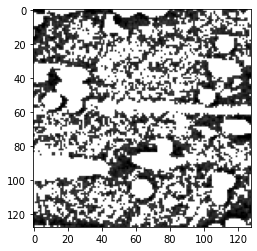

In [ ]:
#Pour la meilleure combinaison seuil/factor
#Définition du facteur pour le contraste. 1 = image d'origine.
listeB4=['block1b_project_conv','block2d_project_conv','block3d_project_conv','block4f_project_conv','block5e_project_conv','block6h_project_conv','block7a_activation','block7a_project_conv','block7b_project_conv','top_bn','top_activation']

#Mathieu  big pictures:
# data_dir_normal= '/content/drive/MyDrive/DIMA/Datasets/Data_big_raw/128px-images-WITHOUT-porosity'
#mathieu : small pictures: 
#data_dir_normal='/content/drive/MyDrive/DIMA/Datasets/Data_reduced_raw/Data_reduced/128px-images-WITHOUT-porosity'

#Thomas :
data_dir_normal= '/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw/128px-images-WITHOUT-porosity'

#Mathieu big pictures:
# data_dir_anormal= '/content/drive/MyDrive/DIMA/Datasets/Data_big_raw/128px-images-WITH-porosity'
#mathieu: small pictures
#data_dir_anormal='/content/drive/MyDrive/DIMA/Datasets/Data_reduced_raw/Data_reduced/128px-images-WITH-porosity'

#Thomas :
data_dir_anormal= '/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw/128px-images-WITH-porosity'

base_model= EfficientNetB4(weights='imagenet',include_top=False)

num_train = 500
num_test = 150
num_anormal = 50
num_normal = num_test-num_anormal
factor = 2
seuil = 0.25
#load de x_train
x_train=np.zeros((num_train,128,128,4))
for i in range(num_train):
  if i<10:
    filename='00000'+str(i)+'-data.png'
  elif 10<=i<100:
    filename='0000'+str(i)+'-data.png'
  elif 100<=i<1000:
    filename='000'+str(i)+'-data.png'
  img=Image.open(os.path.join(data_dir_normal, filename))
  enhancer = ImageEnhance.Contrast(img)
  img = enhancer.enhance(factor)
  data = np.array(img, dtype='uint8')
  x_train[i,:,:,:]=data
  # if i%200==0:
  #   print(i)
x_train = np.delete(x_train,3,3) #Remove the #255 indication (last column)
x_train = x_train.astype('float32') / 255. #Normalization
y_train = np.zeros((num_train,1),dtype='int8')
# print(x_train.shape)

#load de x_test
x_test_normal = np.zeros((num_normal,128,128,4))
id=0
for i in range(1000,1000-num_normal+1,-1) :
  if i<10:
    filename='00000'+str(i)+'-data.png'
  elif 10<=i<100:
    filename='0000'+str(i)+'-data.png'
  elif 100<=i<1000:
    filename='000'+str(i)+'-data.png'
  img=Image.open(os.path.join(data_dir_normal, filename))
  enhancer = ImageEnhance.Contrast(img)
  img = enhancer.enhance(factor)
  data = np.array(img, dtype='uint8')
  x_test_normal[id,:,:,:]=data
  id+=1
x_test_normal = np.delete(x_test_normal,3,3) #Remove the #255 indication (last column)
x_test_normal = x_test_normal.astype('float32') / 255. #Normalization
y_test_normal = np.zeros((num_normal,1),dtype='int8')
x_test_anormal=np.zeros((num_anormal,128,128,4))
for i in range(num_anormal):
  if i<10:
    filename='00000'+str(i)+'-data.png'
  elif 10<=i<100:
    filename='0000'+str(i)+'-data.png'
  elif 100<=i<1000:
    filename='000'+str(i)+'-data.png'
  img=Image.open(os.path.join(data_dir_anormal, filename))
  data = np.array(img, dtype='uint8')
  x_test_anormal[i,:,:,:]=data
x_test_anormal = np.delete(x_test_anormal,3,3) #Remove the #255 indication (last column)
x_test_anormal = x_test_anormal.astype('float32') / 255. #Normalization
y_test_anormal = np.ones((num_anormal,1),dtype='int8')
x_test = np.append(x_test_normal[:(num_normal)],x_test_anormal,axis=0) #add some normal examples
y_test = np.append(y_test_normal[:(num_normal)],y_test_anormal,axis=0)
x_test = np.random.RandomState(seed=3).permutation(x_test)
y_test = np.random.RandomState(seed=3).permutation(y_test)

#Création de x_train_seuil
x_train_seuil = np.ones(x_train.shape)
for i in range(x_train.shape[0]):
  x_train_seuil[i] = x_train[i]
for l in range(x_train_seuil.shape[0]):
  for i in range(x_train_seuil[l].shape[0]):
    for j in range(x_train_seuil[l].shape[1]):
      for k in range(x_train_seuil[l].shape[2]):
        if x_train_seuil[l][i][j][k]>seuil:
          x_train_seuil[l][i][j][k] = 1

#Création de x_test_seuil
x_test_seuil = np.ones(x_test.shape)
for i in range(x_test.shape[0]):
  x_test_seuil[i] = x_test[i]
for l in range(x_test_seuil.shape[0]):
  for i in range(x_test_seuil[l].shape[0]):
    for j in range(x_test_seuil[l].shape[1]):
      for k in range(x_test_seuil[l].shape[2]):
        if x_test_seuil[l][i][j][k]>seuil:
          x_test_seuil[l][i][j][k] = 1

#utilisation de la méthode fonctionnelle pour créer les différents modèles: 
block_train_features=[]
block_test_features=[]
for block in listeB4:
  # print(block)
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  prev_model = prev_model(input)
  #x=layers.GlobalMaxPooling2D(data_format=None)(prev_model)
  x=layers.GlobalAveragePooling2D(data_format=None)(prev_model)
  x=layers.Dropout(0.1)(x)
  #output=layers.Dense(32)(x)
  output=layers.Flatten()(x)
  model=keras.Model(input,output,name=(block))
  # model.summary()
  # model.save(block)
  block_train_features.append(model.predict(x_train_seuil))
  block_test_features.append(model.predict(x_test_seuil))

#Calcul de l'AUC score
class_num = 1
res_maha=[]
for k in range(len(listeB4)+1):
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    # print(z_test.shape)
    errs = emp_cov.mahalanobis(np.nan_to_num(z_test))
    res_maha.append(roc_auc_score(y_test==1, errs))
best_res = max(res_maha)
best_level = res_maha.index(best_res)+1
print('The best AUC score for seuil %.2f is %.2f for level %d' % (seuil, best_res, best_level))




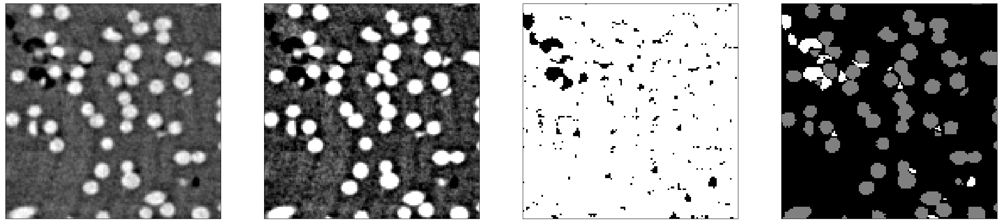

In [ ]:
#Plot une image d'origine, puis contrastée, puis seuillée, et enfin le label
factor = 2
seuil = 0.25
img_example = 0

#load de l'image d'origine
if img_example<10:
    filename='00000'+str(img_example)+'-data.png'
elif 10<=i<100:
    filename='0000'+str(img_example)+'-data.png'
elif 100<=i<1000:
    filename='000'+str(img_example)+'-data.png'
img=Image.open(os.path.join(data_dir_anormal, filename))

#contraste
enhancer = ImageEnhance.Contrast(img)
img_contrast = enhancer.enhance(factor)
data = np.array(img_contrast, dtype='uint8')

#seuil
x_example = np.ones(data.shape)
for i in range(data.shape[0]):
  for j in range(data.shape[1]):
    for k in range(data.shape[2]):
      x_example[i][j][k] = data[i][j][k]
for i in range(data.shape[0]):
  for j in range(data.shape[1]):
      for k in range(data.shape[2]):
        if data[i][j][k]>seuil:
          x_example[i][j][k] = 1

#label
if img_example<10:
  filename='00000'+str(img_example)+'-labels.png'
elif 10<=img_example<100:
  filename='0000'+str(img_example)+'-labels.png'
elif 100<=img_example<1000:
  filename='000'+str(img_example)+'-labels.png'
img_label=Image.open(os.path.join(data_dir_anormal, filename))
data = np.array(img_label, dtype='uint8')
y_example = np.delete(data,3,2) #Remove the #255 indication (last column)
y_example = y_example.astype('float32') / 255. #Normalization

plt.figure(figsize=(36, 12))
m=4
for i in range(m):
    ax = plt.subplot(1, m, i + 1)
    if i==0:
      plt.imshow(img)
    if i==1:
      plt.imshow(img_contrast)
    if i==2:
      plt.imshow(x_example)
    if i==3:
      plt.imshow(y_example)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

## processing for the big data 

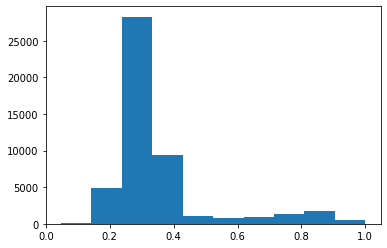

In [ ]:
#modify the contrast to make the anomaly more visible: 
x_train_0=x_train[0]

n, bins, patches = plt.hist(x_train_0.flatten())
plt.show()


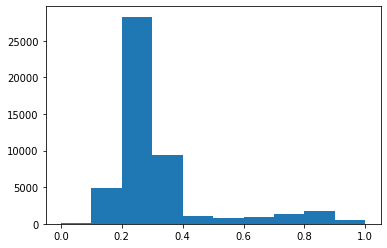

In [ ]:

#normalisation
mini=x_train[0].min()
maxi = x_train[0].max()
for j in range(x_train[0].shape[2]):
  x_train_0[:,:,j] = (x_train[0][:,:,j]-mini)*(1/(maxi-mini))

#normalisation: 

n, bins, patches = plt.hist(x_train_0.flatten())
plt.show()

In [ ]:
#increase train set diversity: 
#geometrical transformation: sur le train set puis append pour avoir une plus large distribution: 
#Une rotation, une translation ou un changement d'échelle (zoom) 
IMG_SIZE=128

#1) rotation --> pas d'effet
num_train=y_train.shape[0]
x_train_rotate=np.zeros((num_train,IMG_SIZE,IMG_SIZE,3))
for i in range(num_train):
  new_image=tf.keras.preprocessing.image.random_rotation(
    x_train[i], 90, row_axis=1)
  mini = new_image.min()
  maxi = new_image.max()
  for j in range(new_image.shape[2]):
    new_image[:,:,j] = (new_image[:,:,j]-mini)*(1/(maxi-mini))
  x_train_rotate[i,:new_image.shape[0],:new_image.shape[1],:]=new_image

x_train_bigger=np.append(x_train,x_train_rotate,axis=0)
#2-changement d'échelle:  (train)
zoom_range = ((0.4, 0.4))
num_train=y_train.shape[0]
x_train_zoom=np.zeros((num_train,IMG_SIZE,IMG_SIZE,3))

for i in range(num_train):
  new_image=tf.keras.preprocessing.image.random_zoom(
    x_train[i], zoom_range)
  mini = new_image.min()
  maxi = new_image.max()
  for j in range(new_image.shape[2]):
    new_image[:,:,j] = (new_image[:,:,j]-mini)*(1/(maxi-mini))
  x_train_zoom[i,:new_image.shape[0],:new_image.shape[1],:]=new_image


x_train_bigger=np.append(x_train_bigger,x_train_zoom,axis=0)


#3-Performs a random brightness shift
brightness_range=[0.2,1.0]
num_train=y_train.shape[0]
x_train_bright=np.zeros((num_train,IMG_SIZE,IMG_SIZE,3))
for i in range(num_train):
  new_image=tf.keras.preprocessing.image.random_brightness(
    x_train[i],brightness_range)
  mini = new_image.min()
  maxi = new_image.max()
  for j in range(new_image.shape[2]):
    new_image[:,:,j] = (new_image[:,:,j]-mini)*(1/(maxi-mini))
  x_train_bright[i,:new_image.shape[0],:new_image.shape[1],:]=new_image

x_train_bigger=np.append(x_train_bigger,x_train_bright,axis=0)





In [ ]:
x_train_bigger.shape

(2000, 128, 128, 3)

In [ ]:
# modification sur le test set: try a zoom 
#zoom test set 
zoom_range = ((0.6, 0.6))
num_test=y_test.shape[0]
x_test_zoom=np.zeros((num_test,IMG_SIZE,IMG_SIZE,3))
for i in range(num_test):
  new_image=tf.keras.preprocessing.image.random_zoom(
    x_test[i], zoom_range)
  mini = new_image.min()
  maxi = new_image.max()
  for j in range(new_image.shape[2]):
    new_image[:,:,j] = (new_image[:,:,j]-mini)*(1/(maxi-mini))
  x_test_zoom[i,:new_image.shape[0],:new_image.shape[1],:]=new_image
  


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in true_divide
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in multiply
  if sys.path[0] == '':


## processing for the small data:

In [ ]:
#adding noise on test data to see if that impacts the results: (especially on anormal data)

from scipy import misc
import numpy as np
import matplotlib.pyplot as plt
salt_value = 40

M=x_test[0]

noise = np.random.randint(salt_value+1, size=(512, 512))

#---------- Pepper ----------#

indexe = np.where(noise == 0)

A = indexe[0]
B = indexe[1]

M[A,B,:] = 0

#---------- Salt ----------#

indexe = np.where(noise == salt_value)

A = indexe[0]
B = indexe[1]

M[A,B,:] = 255

#---------- Plot & Save ----------#

print(M.shape)

my_dpi=100

fig = plt.figure(figsize=(800/my_dpi, 800/my_dpi), dpi=my_dpi)

ax = plt.Axes(fig, [0., 0., 1., 1.])
ax.set_axis_off()
fig.add_axes(ax)

plt.imshow(M)   
plt.savefig("lena_saltpepper.png", dpi=my_dpi)
plt.show()

(128, 128, 3)


IndexError: ignored

# Loading MVTEC DATA to check 

In [3]:
#load google drive and the file
drive.mount('/content/drive')

#Mathieu big data:
os.chdir("/content/drive/MyDrive/DIMA/Datasets/MVTEC_ALL/mvtec_anomaly_detection/")

#Thomas big data:
#os.chdir("/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/MVTEC_ALL/mvtec_anomaly_detection")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
#loading all types of data:
import glob

def load_data(cat,shape):
  
  # Mathieu :
  data_dir = pathlib.Path('/content/drive/MyDrive/DIMA/Datasets/MVTEC_ALL/mvtec_anomaly_detection') 
  #Thomas :
  #data_dir = pathlib.Path('/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/MVTEC_ALL/mvtec_anomaly_detection') 

  data_path = data_dir / cat
  path_train = data_path / 'train' / 'good'
  path_test = data_path / 'test'

  num_train = len(os.listdir(path_train))
  num_test_normal = len(os.listdir(path_test / 'good'))
  num_anormal = 0
  classes = os.listdir(path_test)
  for cl in classes:
    if 'good' != classes:
      num_anormal = num_anormal + len(os.listdir(path_test / cl))


  x_train=np.zeros((num_train,shape,shape,3))
  x_test_normal = np.zeros((num_test_normal,shape,shape,3))
  x_test_anormal=np.zeros((num_anormal,shape,shape,3))

  #create train set: 
  for i in range(num_train):
    if i<10:
      filename='00'+str(i)+'.png'
    elif 10<=i<100:
      filename='0'+str(i)+'.png'
    elif 100<=i<1000:
      filename=str(i)+'.png'
    img=Image.open(os.path.join(path_train, filename))
    data = np.array(img, dtype='uint8')
    if cat == 'grid' or cat == 'zipper':
      data = np.repeat(data[..., np.newaxis], 3, -1)
    x_train[i,:,:,:]=data
    if i%50==0:
      print(i)
  x_train_mvtec = x_train.astype('float32') / 255. #Normalization

  #create test set
  id_anormal = 0
  classes = os.listdir(path_test)
  if 'good' not in classes:
      print('There should exist a subdirectory "good". Read the doc of this function for further information.')
      exit()
  classes.sort()
  for cl in classes:
      if cl == 'good':
        for i in range(num_test_normal):
          if i<10:
            filename='00'+str(i)+'.png'
          elif 10<=i<100:
            filename='0'+str(i)+'.png'
          elif 100<=i<1000:
            filename=str(i)+'.png'
          img=Image.open(os.path.join(path_test / cl, filename))
          data = np.array(img, dtype='uint8')
          if cat == 'grid' or cat == 'zipper':
            data = np.repeat(data[..., np.newaxis], 3, -1)
          x_test_normal[i,:,:,:]=data
          i+=1
      else:
        for i in range(len(os.listdir(path_test / cl))):
          if i<10:
            filename='00'+str(i)+'.png'
          elif 10<=i<100:
            filename='0'+str(i)+'.png'
          elif 100<=i<1000:
            filename=str(i)+'.png'
          img=Image.open(os.path.join(path_test / cl, filename))
          data = np.array(img, dtype='uint8')
          if cat == 'grid' or cat == 'zipper':
            data = np.repeat(data[..., np.newaxis], 3, -1)
          x_test_anormal[id_anormal,:,:,:]=data
          id_anormal += 1

  x_test_normal_mvtec = x_test_normal.astype('float32') / 255. #Normalization
  y_test_normal = np.zeros((num_test_normal,1))

  x_test_anormal_mvtec = x_test_anormal.astype('float32') / 255. #Normalization
  y_test_anormal = np.ones((num_anormal,1))

  x_test = np.append(x_test_normal_mvtec,x_test_anormal_mvtec,axis=0)
  y_test = np.append(y_test_normal,y_test_anormal,axis=0)
  x_test_mvtec = np.random.RandomState(seed=3).permutation(x_test)
  y_test_mvtec = np.random.RandomState(seed=3).permutation(y_test)



  return x_train_mvtec,x_test_mvtec,y_test_mvtec, x_test_anormal_mvtec, x_test_normal_mvtec



In [5]:
(x_train_mvtec,x_test_mvtec,y_test_mvtec,x_test_anormal_mvtec,x_test_normal_mvtec)=load_data('bottle',900)


0
50
100
150
200


In [6]:
print(x_train_mvtec.shape)
print(x_test_mvtec.shape)
print(x_test_anormal_mvtec.shape)

(209, 900, 900, 3)
(103, 900, 900, 3)
(83, 900, 900, 3)


In [7]:
#@title
#plot label for x_test: 
#print label : 

data_dir_anormal='/content/drive/MyDrive/DIMA/Datasets/MVTEC_ALL/mvtec_anomaly_detection/wood/ground_truth/combined'

num_anormal=10

y_test_anormal=np.zeros((num_anormal,1024,1024))
for i in range(num_anormal):
  if i<10:
    filename='00'+str(i)+'_mask.png'
  elif 10<=i<100:
    filename='0'+str(i)+'_mask.png'
  elif 100<=i<1000:
    filename=str(i)+'_mask.png'
  img=Image.open(os.path.join(data_dir_anormal, filename))
  data = np.array(img, dtype='uint8')
  y_test_anormal[i,:,:]=data


y_test_anormal = y_test_anormal.astype('float32') / 255. #Normalization



y_test_label = np.random.RandomState(seed=3).permutation(y_test_anormal)


In [ ]:
#@title
plt.imshow(y_test_label[1])


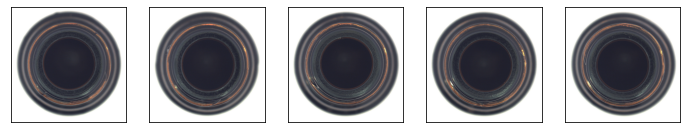

In [8]:
#plot some train examples 
plt.figure(figsize=(12, 4))
m=5
for i in range(m):
    # display original
    ax = plt.subplot(1, m, i + 1)
    plt.imshow(x_train_mvtec[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

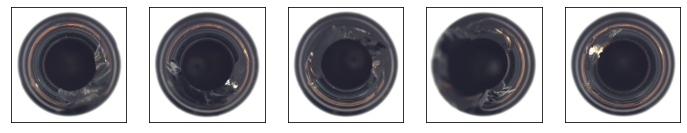

In [9]:
#plot some test examples anormal
plt.figure(figsize=(12, 4))
m=5
for i in range(m):
    # display original
    ax = plt.subplot(1, m, i + 1)
    plt.imshow(x_test_anormal_mvtec[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

#Padim

In [6]:


base_model= EfficientNetB5(weights='imagenet',include_top=False)

#utilisation de la méthode fonctionnelle pour créer les différents modèles: 
listeB4=['block1b_project_conv','block2d_project_conv','block3d_project_conv','block4f_project_conv','block5e_project_conv','block6h_project_conv','block7a_project_conv','block7b_project_conv']
listeB5=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5g_project_conv','block6i_project_conv','block7b_project_conv']
listeB6=['block1c_project_conv','block2f_project_conv','block3f_project_conv','block4h_project_conv','block5h_project_conv','block6k_project_conv','block7c_project_conv']
listeB1=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5c_project_conv','block6c_project_conv','block7b_project_conv']
listeRS50=['conv1_conv','conv2_block3_3_conv','conv3_block4_3_conv','conv4_block6_3_conv','conv5_block3_3_conv']
listeRS152=['conv1_conv','conv2_block3_3_conv','conv3_block3_3_conv','conv4_block36_3_conv','conv5_block3_3_conv']
listeRS50V2=['pool1_pool', 'conv2_block3_3_conv','conv3_block4_3_conv','max_pooling2d_2','conv4_block6_3_conv','conv5_block3_3_conv']

block_train_features=[]
block_test_features=[]

for block in listeB5:
  print(block)
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  x = prev_model(input)
  output=layers.GlobalAveragePooling2D(data_format=None)(x)
  model=keras.Model(input,output,name=(block))
  block_train_features.append(model.predict(x_train_mvtec))
  block_test_features.append(model.predict(x_test_mvtec))


block1b_project_conv
block2c_project_conv
block3c_project_conv
block4d_project_conv
block5g_project_conv
block6i_project_conv
block7b_project_conv


In [10]:

#concatenation avec le global average pooling: : 
import random 
concat_features_train=[]
concat_features_test=[]
for j in range(10):
  random.seed(j)
  l=random.sample(range(1,len(listeB5)), 5)
  embedding_train_random=block_train_features[l[0]]
  embedding_test_random=block_test_features[l[0]]
  for i in l[1:]:
    embedding_train_random = np.append(embedding_train_random,block_train_features[i],axis=1)
    embedding_test_random=np.append(embedding_test_random,block_test_features[i],axis=1)
  concat_features_train.append(embedding_train_random)
  concat_features_test.append(embedding_test_random)


In [11]:
concat_features_train[0].shape

(209, 920)

In [ ]:

#gaussian estimation: 
B,C=concat_features_train.shape
concat_features_train=concat_features_train.view(B,C)
mean = np.mean(concat_features_train)
cov = np.zeros(B,C)
I = np.identity(C)
for i in range(H * W):
  # cov[:, :, i] = LedoitWolf().fit(embedding_vectors[:, :, i].numpy()).covariance_
  cov[:, :, i] = np.cov(concat_features_train[:, :, i], rowvar=False) + 0.01 * I
# save learned distribution
train_outputs = [mean, cov]
#with open(train_feature_filepath, 'wb') as f:
#pickle.dump(train_outputs, f)


#calculate distance matrix:
B, H, W, C= concat_features_test.size()
concat_features_test = concat_feature_train.view(B, H * W,C)
# B, H, W, C= embedding_vectors.size()
# embedding_vectors = embedding_vectors.view(B, H * W,C).numpy()
dist_list = []
for i in range(H * W):
  mean = train_outputs[0][:, i]
  conv_inv = np.linalg.inv(train_outputs[1][:, :, i])
  dist = [mahalanobis(sample[:, i], mean, conv_inv) for sample in concat_features_test]
  dist_list.append(dist)

dist_list = np.array(dist_list).transpose(1, 0).reshape(B, H, W)

In [11]:
#concaténation (pas d'average global pooling):
import torch 
import torch.nn.functional as F


def embedding_concat(x, y):
    B, H1, W1, C1 = x.shape
    _, H2, W2, C2 = y.shape
    x=x.reshape(B,C1,H1,W1)
    y=y.reshape(B,C2,H2,W2)
    x=torch.from_numpy(x)
    y=torch.from_numpy(y)
    print(y.size())
    print(x.size())
    B, C1, H1, W1 = x.size()
    _, C2, H2, W2 = y.size()
    s = int(H1 / H2)
    x = F.unfold(x, kernel_size=s, dilation=1, stride=s)
    x = x.view(B, C1, -1, H2, W2)
    z = torch.zeros(B, C1 + C2, x.size(2), H2, W2)
    for i in range(x.size(2)):
        z[:, :, i, :, :] = torch.cat((x[:, :, i, :, :], y), 1)
    z = z.view(B, -1, H2 * W2)
    z = F.fold(z, kernel_size=s, output_size=(H1, W1), stride=s)

    return z
    

    # B, H1, W1, C1 = x.shape
    # _, H2, W2, C2 = y.shape
    # s = int(H1 / H2)
    # x = F.unfold(x, kernel_size=s, dilation=1, stride=s)
    # x = x.view(B, C1, -1, H2, W2)
    # z = torch.zeros(B, C1 + C2, x.shape[2], H2, W2)
    # for i in range(x.shape[2]):
    #     z[:, :, i, :, :] = torch.cat((x[:, :, i, :, :], y), 1)
    # z = z.view(B, -1, H2 * W2)
    # z = F.fold(z, kernel_size=s, output_size=(H1, W1), stride=s)

    # return z



In [ ]:
embedding_vectors=block_train_features[0]
for i in [1,2,3,4,5,6,7]: 
  embedding_vectors=embedding_concat(embedding_vectors, block_train_features[i])

torch.Size([209, 40, 225, 225])
torch.Size([209, 24, 450, 450])


#Creation of the model

## Create function to evaluate model and simplify it 

In [13]:
def plot_AUC(fpr,tpr,AUC):
    lw = 2
    plt.plot(fpr, tpr, 'o',color='darkorange', label='ROC curve (area = %0.4f)' % AUC)
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.grid('on')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

def plot_x(x_temp, model, n=8, evaluation_function=None):
    if n > x_temp.shape[0]:
        n = x_temp.shape[0]
    x_temp_decoded = model_dict[model].predict(x_temp,batch_size=64)
    if evaluation_function is not None:
        anomaly_score = evaluation_function(x_temp)
        anomaly_score_decoded = evaluation_function(x_temp_decoded)

    plt.figure(figsize=(n*2, 4))
    title = ''
    for i in range(n):
        # display original
        ax = plt.subplot(2, n, i + 1)
        if evaluation_function is not None:
            title = '%.2f' % anomaly_score[i]
        show_image(x_temp[i], ax, title)
        # display generated
        ax = plt.subplot(2, n, i + n + 1)
        if evaluation_function is not None:
            title = '%.2f' % anomaly_score_decoded[i]
        show_image(x_temp_decoded[i], ax, title)
    plt.show()

##The model :

In [14]:
#loading the EfficientNet model:
#base_model= EfficientNetB1(weights='imagenet',include_top=False)
# base_model= EfficientNetB4(weights='imagenet',include_top=False)
base_model= EfficientNetB5(weights='imagenet',include_top=False)
#base_model=EfficientNetB6(weights='imagenet',include_top=False)
#base_model = ResNet50(weights='imagenet',include_top=False)
#base_model = ResNet152(weights='imagenet',include_top=False)
#base_model = ResNet50V2(weights='imagenet',include_top=False)


print(base_model.summary())

115269632/115263384 [==============================] - 1s 0us/step
Model: "efficientnetb5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
rescaling (Rescaling)           (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
normalization (Normalization)   (None, None, None, 3 7           rescaling[0][0]                  
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, None, None, 3 0           normalization[0][0]              
__________________

In [15]:
liste_layer=[]


In [16]:
#all conv layer
# summarize filter shapes
for layer in base_model.layers:
	# check for convolutional layer
    if 'activation'  in layer.name:  #can be changed to conv
      liste_layer.append(layer.name)
    
liste_layer

['stem_activation',
 'block1a_activation',
 'block1b_activation',
 'block1c_activation',
 'block2a_expand_activation',
 'block2a_activation',
 'block2b_expand_activation',
 'block2b_activation',
 'block2c_expand_activation',
 'block2c_activation',
 'block2d_expand_activation',
 'block2d_activation',
 'block2e_expand_activation',
 'block2e_activation',
 'block3a_expand_activation',
 'block3a_activation',
 'block3b_expand_activation',
 'block3b_activation',
 'block3c_expand_activation',
 'block3c_activation',
 'block3d_expand_activation',
 'block3d_activation',
 'block3e_expand_activation',
 'block3e_activation',
 'block4a_expand_activation',
 'block4a_activation',
 'block4b_expand_activation',
 'block4b_activation',
 'block4c_expand_activation',
 'block4c_activation',
 'block4d_expand_activation',
 'block4d_activation',
 'block4e_expand_activation',
 'block4e_activation',
 'block4f_expand_activation',
 'block4f_activation',
 'block4g_expand_activation',
 'block4g_activation',
 'block5a_

### modèle avec global average pooling postérieure: (seulement après la concaténation)

In [ ]:
from tensorflow.keras.activations import relu, sigmoid

#utilisation de la méthode fonctionnelle pour créer les différents modèles: 
listeB4=['block1b_project_conv','block2d_project_conv','block3d_project_conv','block4f_project_conv','block5e_project_conv','block6h_project_conv','block7a_project_conv','block7b_project_conv']
listeB5=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5g_project_conv','block6i_project_conv','block7b_project_conv']
listeB6=['block1c_project_conv','block2f_project_conv','block3f_project_conv','block4h_project_conv','block5h_project_conv','block6k_project_conv','block7c_project_conv']
listeB1=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5c_project_conv','block6c_project_conv','block7b_project_conv']
listeRS50=['conv1_conv','conv2_block3_3_conv','conv3_block4_3_conv','conv4_block6_3_conv','conv5_block3_3_conv']
listeRS152=['conv1_conv','conv2_block3_3_conv','conv3_block3_3_conv','conv4_block36_3_conv','conv5_block3_3_conv']
listeRS50V2=['pool1_pool', 'conv2_block3_3_conv','conv3_block4_3_conv','max_pooling2d_2','conv4_block6_3_conv','conv5_block3_3_conv']

block_train_features=[]
block_test_features=[]

for block in listeB5:
  print(block)
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  output = prev_model(input)
  model=keras.Model(input,output,name=(block))
  block_train_features.append(model.predict(x_train))
  block_test_features.append(model.predict(x_test))



stem_activation


NameError: ignored

In [ ]:
l[0]

In [ ]:
embedding_train=block_train_features[l[0]]
embedding_train=layers.GlobalAveragePooling2D(data_format=None)(embedding_train)


In [ ]:
embedding_train.shape

In [ ]:
#concatenate some feature maps: 
#selecting a part of the model to concat: (randomly is better than pca)
#from 50 to 60: 
import random 
random.seed(0)
l=random.sample(range(1,65), 5)
embedding_train=block_train_features[l[0]]
embedding_train=layers.GlobalAveragePooling2D(data_format=None)(embedding_train)

embedding_test=block_test_features[l[0]]
embedding_test=layers.GlobalAveragePooling2D(data_format=None)(embedding_test)

for i in l[1:]:
  embedding_train = np.append(embedding_train,layers.GlobalAveragePooling2D(data_format=None)(block_train_features[i]),axis=1)
  embedding_test=np.append(embedding_test,layers.GlobalAveragePooling2D(data_format=None)(block_test_features[i]),axis=1)



In [ ]:
z_train=embedding_train
z_test = embedding_test
emp_cov = EmpiricalCovariance().fit(z_train)
errs = emp_cov.mahalanobis(np.nan_to_num(z_test))


In [ ]:
roc_auc_score(y_test==1,errs)

### Modèle classique 

In [ ]:
from tensorflow.keras.activations import relu, sigmoid

#utilisation de la méthode fonctionnelle pour créer les différents modèles: 
listeB4=['block1b_project_conv','block2d_project_conv','block3d_project_conv','block4f_project_conv','block5e_project_conv','block6h_project_conv','block7a_project_conv','block7b_project_conv']
listeB5=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5g_project_conv','block6i_project_conv','block7b_project_conv']
listeB6=['block1c_project_conv','block2f_project_conv','block3f_project_conv','block4h_project_conv','block5h_project_conv','block6k_project_conv','block7c_project_conv']
listeB1=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5c_project_conv','block6c_project_conv','block7b_project_conv']
listeRS50=['conv1_conv','conv2_block3_3_conv','conv3_block4_3_conv','conv4_block6_3_conv','conv5_block3_3_conv']
listeRS152=['conv1_conv','conv2_block3_3_conv','conv3_block3_3_conv','conv4_block36_3_conv','conv5_block3_3_conv']
listeRS50V2=['pool1_pool', 'conv2_block3_3_conv','conv3_block4_3_conv','max_pooling2d_2','conv4_block6_3_conv','conv5_block3_3_conv']

block_train_features=[]
block_test_features=[]

for block in liste_layer:
  print(block)
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  x = prev_model(input)
  output=layers.GlobalAveragePooling2D(data_format=None)(x)

  #x=tf.keras.layers.Activation(activations.sigmoid)(prev_model)
  #x=tf.keras.layers.Activation(activations.softmax)(prev_model)
  #x=tf.keras.layers.Activation(activations.tanh)(prev_model)
  #x=tf.keras.layers.Activation(activations.elu)(prev_model)
  #x=layers.GlobalMaxPooling2D(data_format=None)(x)
  #output=layers.GlobalAveragePooling2D(data_format=None)(x)
  #layers.Activation(activations.relu)
  #x=tf.keras.layers.Activation(activations.relu)(prev_model)
  #x=layers.GlobalMaxPooling2D(data_format=None)(prev_model)
  #x=layers.Dropout(0.1)(x)
  #output=layers.Dense(32)(x)
  #output=layers.Flatten()(x)
  # model.summary()
  # model.save(block)

  model=keras.Model(input,output,name=(block))
  block_train_features.append(model.predict(x_train_mvtec))
  block_test_features.append(model.predict(x_test_mvtec))


stem_activation
block1a_activation
block1b_activation
block1c_activation
block2a_expand_activation
block2a_activation
block2b_expand_activation
block2b_activation
block2c_expand_activation
block2c_activation
block2d_expand_activation
block2d_activation
block2e_expand_activation
block2e_activation
block3a_expand_activation
block3a_activation
block3b_expand_activation
block3b_activation
block3c_expand_activation
block3c_activation
block3d_expand_activation
block3d_activation
block3e_expand_activation
block3e_activation
block4a_expand_activation
block4a_activation
block4b_expand_activation
block4b_activation
block4c_expand_activation
block4c_activation
block4d_expand_activation
block4d_activation
block4e_expand_activation
block4e_activation
block4f_expand_activation
block4f_activation
block4g_expand_activation
block4g_activation
block5a_expand_activation
block5a_activation
block5b_expand_activation
block5b_activation
block5c_expand_activation
block5c_activation
block5d_expand_activation
b

### concaténation for certain level (global average pooling avant)




In [ ]:
len(liste_layer) #checking if not null

77

In [ ]:
#selecting a part of the model to concat: (randomly is better than pca)

import random 
concat_features_train=[]
concat_features_test=[]
for j in range(10):
  random.seed(j)
  l=random.sample(range(1,len(liste_layer)), 5)
  embedding_train_random=block_train_features[l[0]]
  embedding_test_random=block_test_features[l[0]]
  for i in l[1:]:
    embedding_train_random = np.append(embedding_train_random,block_train_features[i],axis=1)
    embedding_test_random=np.append(embedding_test_random,block_test_features[i],axis=1)
  concat_features_train.append(embedding_train_random)
  concat_features_test.append(embedding_test_random)



In [ ]:
# #selecting ONLY best feature maps: 
# embedding_test_best=block_test_features[50]
# embedding_train_best=block_train_features[50]
# for i in range(50,61,1):
#   i=i+1
#   embedding_train_best = np.append(embedding_train_best,block_train_features[i],axis=1)
#   embedding_test_best = np.append(embedding_test_best,block_test_features[i],axis=1)

In [ ]:
# z_train=embedding_train_random
# z_test = embedding_test_random
# emp_cov = EmpiricalCovariance().fit(z_train)
# errs = emp_cov.mahalanobis(np.nan_to_num(z_test))


In [ ]:
# roc_auc_score(y_test_mvtec==1,errs)

In [ ]:
class_num = 1
concat_level=[0,1,2,3,4,5,6,7,8,9]
res_maha=[]

for k in (concat_level):
    errs = []
    level = k
    z_train = concat_features_train[k-1]
    z_test = concat_features_test[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    print(z_test.shape)
    
    errs = emp_cov.mahalanobis(np.nan_to_num(z_test))
    res_maha.append(roc_auc_score(y_test_mvtec==1, errs))
    print('The AUC score for concatenation number %d is %.1f' % (k, res_maha[-1]*100))

(99, 4416)
The AUC score for concatenation number 0 is 75.2
(99, 5712)
The AUC score for concatenation number 1 is 74.1
(99, 4848)
The AUC score for concatenation number 2 is 72.6
(99, 2160)
The AUC score for concatenation number 3 is 69.5
(99, 6080)
The AUC score for concatenation number 4 is 73.9
(99, 4656)
The AUC score for concatenation number 5 is 74.9
(99, 5616)
The AUC score for concatenation number 6 is 74.8
(99, 6048)
The AUC score for concatenation number 7 is 73.6
(99, 2976)
The AUC score for concatenation number 8 is 67.9
(99, 3648)
The AUC score for concatenation number 9 is 73.0


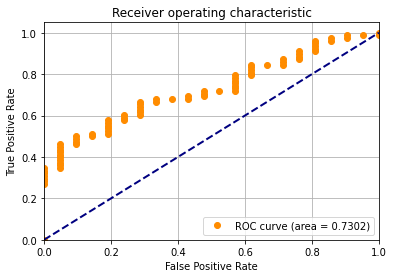

In [ ]:
# Plot the roc curve :
fpr, tpr, thresholds = roc_curve(y_test_mvtec==1, y_score=errs,pos_label=1, drop_intermediate=False) #errs= y_sxore
AUC = auc(fpr, tpr)
plot_AUC(fpr,tpr,AUC)

##Ancien modèle (sans concaténation)

In [ ]:
#loading the EfficientNet model:
#base_model= EfficientNetB1(weights='imagenet',include_top=False)
base_model= EfficientNetB4(weights='imagenet',include_top=False)
# base_model= EfficientNetB5(weights='imagenet',include_top=False)
#base_model=EfficientNetB6(weights='imagenet',include_top=False)
#base_model = ResNet50(weights='imagenet',include_top=False)
#base_model = ResNet152(weights='imagenet',include_top=False)
#base_model = ResNet50V2(weights='imagenet',include_top=False)


print(base_model.summary())

Model: "efficientnetb4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
rescaling_1 (Rescaling)         (None, None, None, 3 0           input_2[0][0]                    
__________________________________________________________________________________________________
normalization_1 (Normalization) (None, None, None, 3 7           rescaling_1[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, None, None, 3 0           normalization_1[0][0]            
_____________________________________________________________________________________

In [ ]:
from tensorflow.keras.activations import relu, sigmoid

#utilisation de la méthode fonctionnelle pour créer les différents modèles: 
listeB4=['block1b_project_conv','block2d_project_conv','block3d_project_conv','block4f_project_conv','block5e_project_conv','block6h_project_conv','block7a_project_conv','block7b_project_conv']
listeB5=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5g_project_conv','block6i_project_conv','block7b_project_conv']
listeB6=['block1c_project_conv','block2f_project_conv','block3f_project_conv','block4h_project_conv','block5h_project_conv','block6k_project_conv','block7c_project_conv']
listeB1=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5c_project_conv','block6c_project_conv','block7b_project_conv']
listeRS50=['conv1_conv','conv2_block3_3_conv','conv3_block4_3_conv','conv4_block6_3_conv','conv5_block3_3_conv']
listeRS152=['conv1_conv','conv2_block3_3_conv','conv3_block3_3_conv','conv4_block36_3_conv','conv5_block3_3_conv']
listeRS50V2=['pool1_pool', 'conv2_block3_3_conv','conv3_block4_3_conv','max_pooling2d_2','conv4_block6_3_conv','conv5_block3_3_conv']

block_train_features=[]
block_test_features=[]

for block in listeB4:
  print(block)
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  x = prev_model(input)
  output=layers.GlobalAveragePooling2D(data_format=None)(x)

  #x=tf.keras.layers.Activation(activations.sigmoid)(prev_model)
  #x=tf.keras.layers.Activation(activations.softmax)(prev_model)
  #x=tf.keras.layers.Activation(activations.tanh)(prev_model)
  #x=tf.keras.layers.Activation(activations.elu)(prev_model)
  #x=layers.GlobalMaxPooling2D(data_format=None)(x)
  #output=layers.GlobalAveragePooling2D(data_format=None)(x)
  #layers.Activation(activations.relu)
  #x=tf.keras.layers.Activation(activations.relu)(prev_model)
  #x=layers.GlobalMaxPooling2D(data_format=None)(prev_model)
  #x=layers.Dropout(0.1)(x)
  #output=layers.Dense(32)(x)
  #output=layers.Flatten()(x)
  # model.summary()
  # model.save(block)

  model=keras.Model(input,output,name=(block))
  block_train_features.append(model.predict(x_train_mvtec))
  block_test_features.append(model.predict(x_test_mvtec))


block1b_project_conv
block2d_project_conv
block3d_project_conv
block4f_project_conv
block5e_project_conv
block6h_project_conv
block7a_project_conv
block7b_project_conv


In [ ]:
class_num = 1
feature_level=[1,2,3,4,5,6,7,8]
res_maha=[]

for k in feature_level:
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    print(z_test.shape)
    errs = emp_cov.mahalanobis(np.nan_to_num(z_test))
    res_maha.append(roc_auc_score(y_test_mvtec==1, errs))
    print('The AUC score for level %d is %.1f' % (k, res_maha[-1]*100))

(99, 24)
The AUC score for level 1 is 55.2
(99, 32)
The AUC score for level 2 is 68.9
(99, 56)
The AUC score for level 3 is 69.4
(99, 112)
The AUC score for level 4 is 67.6
(99, 160)
The AUC score for level 5 is 73.6
(99, 272)
The AUC score for level 6 is 73.5
(99, 448)
The AUC score for level 7 is 75.1
(99, 448)
The AUC score for level 8 is 78.8


## use knn to compute score: 

In [ ]:
#compute distance


##Compute the AUC scores and plot the results (reste le box plot a faire si tu veux)


In [ ]:
#dans block train features les 7premiers niveaux correspondent à efficient net b1, puis les 7 suivant à b4, puis à B6. 
class_num = 1
feature_level=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64]
res_maha=[]

for k in (feature_level):
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    print(z_test.shape)
    
    errs = emp_cov.mahalanobis(np.nan_to_num(z_test))
    res_maha.append(roc_auc_score(y_test==1, errs))
    print('The AUC score for level %d is %.2f' % (k, res_maha[-1]))

(39, 48)
The AUC score for level 1 is 0.66
(39, 48)
The AUC score for level 2 is 0.39
(39, 24)
The AUC score for level 3 is 0.81
(39, 144)
The AUC score for level 4 is 0.83
(39, 144)
The AUC score for level 5 is 0.74
(39, 192)
The AUC score for level 6 is 0.81
(39, 192)
The AUC score for level 7 is 0.74
(39, 192)
The AUC score for level 8 is 0.90
(39, 192)
The AUC score for level 9 is 0.75
(39, 192)
The AUC score for level 10 is 0.84
(39, 192)
The AUC score for level 11 is 0.74
(39, 192)
The AUC score for level 12 is 0.83
(39, 192)
The AUC score for level 13 is 0.78
(39, 336)
The AUC score for level 14 is 0.87
(39, 336)
The AUC score for level 15 is 0.84
(39, 336)
The AUC score for level 16 is 0.85
(39, 336)
The AUC score for level 17 is 0.86
(39, 336)
The AUC score for level 18 is 0.89
(39, 336)
The AUC score for level 19 is 0.89
(39, 336)
The AUC score for level 20 is 0.87
(39, 336)
The AUC score for level 21 is 0.90
(39, 672)
The AUC score for level 22 is 0.88
(39, 672)
The AUC scor

The best level is 38, whose AUC score is 0.99


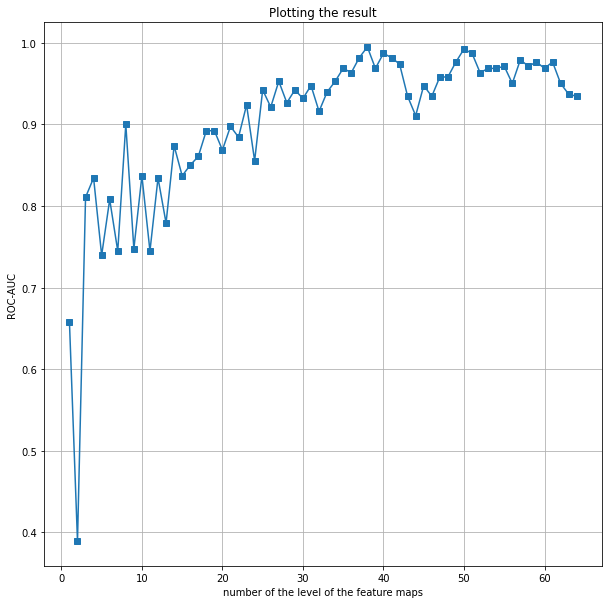

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(feature_level, res_maha, 's-')
best_res = max(res_maha)
best_level = feature_level[np.argmax(res_maha)]
print('The best level is %d, whose AUC score is %.2f' % (best_level, best_res))

plt.xlabel('number of the level of the feature maps')
plt.title('Plotting the result')
plt.ylabel('ROC-AUC')
plt.grid('on')
plt.show()

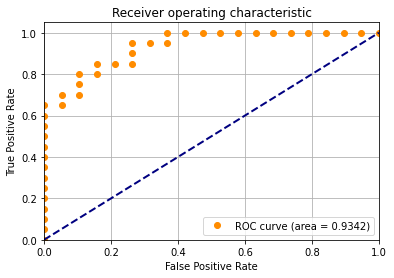

In [ ]:
# Plot the roc curve :
fpr, tpr, thresholds = roc_curve(y_test==1, y_score=errs,pos_label=1, drop_intermediate=False) #errs= y_sxore
AUC = auc(fpr, tpr)
plot_AUC(fpr,tpr,AUC)

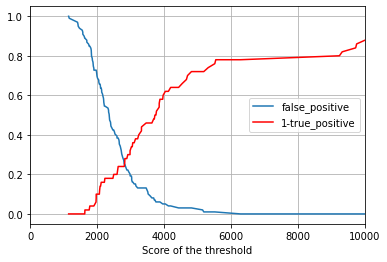

In [ ]:
# find best threshold to inspect which data are incorrectly recognized: 
axes = plt.gca()
axes.plot(thresholds,fpr,label='false_positive')
axes.plot(thresholds,1-tpr,'r',label='1-true_positive')
axes.set_xlim(0, 10000)
axes.grid()
axes.set_xlabel('Score of the threshold')
axes.legend()

In [ ]:
print('Best threshold:', thresholds[np.argmin(np.abs((1-tpr)-fpr))])

Best threshold: 2827.590421147524


In [ ]:
threshold_maha=thresholds[np.argmin(np.abs((1-tpr)-fpr))]

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


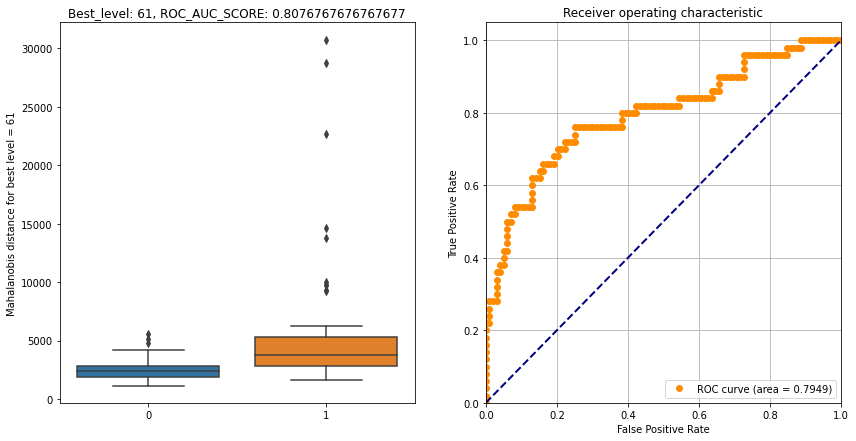

In [ ]:
#boxplot

def plot_AUC(fpr,tpr,AUC):
    lw = 2
    plt.plot(fpr, tpr, 'o',color='darkorange', label='ROC curve (area = %0.4f)' % AUC)
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.grid('on')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

best_res = max(res_maha)
best_level = res_maha.index(best_res)+1
plt.figure(figsize=(14,7))
plt.subplot(1,2,1)
sns.boxplot(np.squeeze(y_test),errs)
plt.ylabel('Mahalanobis distance for best level = '+str(best_level))
plt.title('Best_level: ' + str(best_level) + ', ROC_AUC_SCORE: ' + str(best_res))
fpr, tpr, thresholds = roc_curve(y_test==1, errs, drop_intermediate=False)
AUC=auc(fpr,tpr)
plt.subplot(1,2,2)
plot_AUC(fpr,tpr,AUC)
plt.show()

### Visualising latent space for best level 

(500, 3)


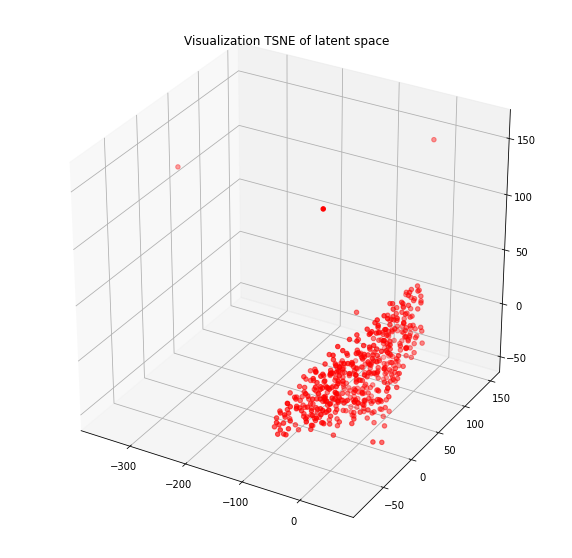

In [ ]:
#Tsne: 
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=3).fit_transform(block_train_features[1])

print(X_embedded.shape)

fig=plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
plt.title('Visualization TSNE of latent space')
#plt.set_cmap('Spectral')
ax.scatter(X_embedded[:, 0], X_embedded[:, 1],X_embedded[:,2], c='red')
#plt.colorbar()
plt.show()

(500, 128, 128, 3)
(50, 128, 128, 3)
(58, 32)
(58, 2)


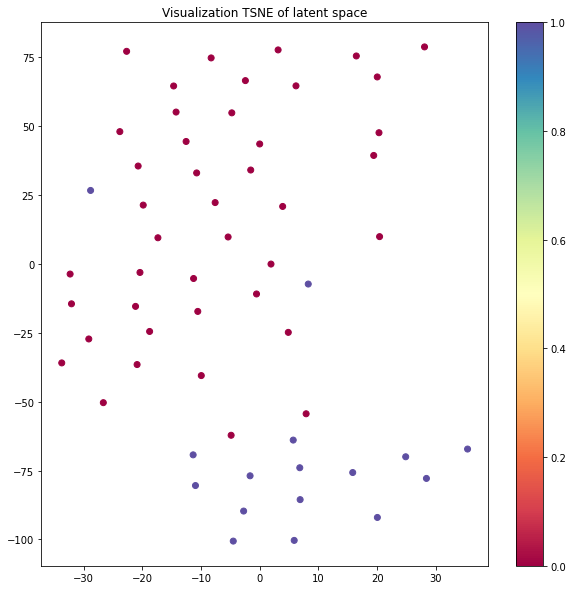

In [ ]:
#comparer l'esapce latent entre les normales et anormales: 
n_normal = 38
n_anormal=20
#best_level=best_level



#build model for best_level: 
##prev model: 
prev_model=keras.Model(base_model.input, base_model.get_layer(liste_layer[best_level]).output, name="level_without_average_pooling")
##build the model: 
input=base_model.input
prev_model = prev_model(input)
x=tf.keras.layers.Activation(activations.relu)(prev_model)
x=layers.GlobalMaxPooling2D(data_format=None)(prev_model)
x=layers.Dropout(0.1)(x)
output=layers.Dense(32)(x)
model=keras.Model(input,output,name=(block))
#model.summary()




##load normal data: 
##load  anormal data: 
print(x_train.shape)
print(x_test_anormal.shape)
normal_x=x_train[:n_normal]
anormal_x=x_test_anormal[:n_anormal]
#anormal_y=y_test_anormal_label[:n_anormal]
#normal_y=y_train_label[:n_normal]
normal_y=np.zeros((n_normal,1))
anormal_y=np.ones((n_anormal,1))

min_error_index = np.argpartition(a=errs,kth=n_normal)[:n_normal] # on sort errs, on partitionne en fonction du nombre de donnés normales,The k-th element will be in its final sorted position and all smaller elements will be moved before it and all larger elements behind it.
max_error_index = np.argpartition(errs,-n_anormal)[-n_anormal:]


top_anormal_x = x_test[max_error_index] # la top anormal
top_anormal_y = y_test[max_error_index] # ca va faire 1 de toute manière ! 


normal_show_x = normal_x[:n_normal]
normal_show_y = normal_y[:n_normal]


x_normal_encoded = model.predict(normal_show_x, batch_size=64)
x_anormal_encoded = model.predict(top_anormal_x, batch_size=64)

x_encoded_tmp = np.append(x_normal_encoded, x_anormal_encoded, axis=0)
y_tmp = np.append(normal_show_y, top_anormal_y, axis=0)

print(x_encoded_tmp.shape)
X_embedded = TSNE(n_components=2,perplexity=15).fit_transform(x_encoded_tmp)

print(X_embedded.shape)

plt.figure(figsize=(10, 10))
plt.title('Visualization TSNE of latent space')
plt.set_cmap('Spectral')
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], c=y_tmp)
plt.colorbar()
plt.show()

(58, 3)


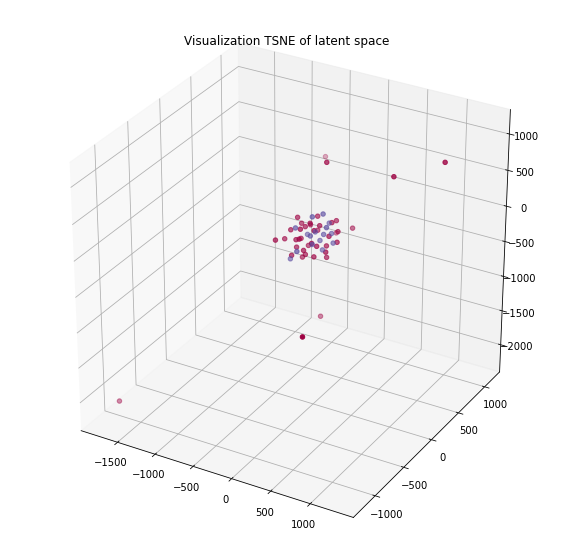

In [ ]:
X_embedded = TSNE(n_components=3,perplexity=10).fit_transform(x_encoded_tmp)

print(X_embedded.shape)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
plt.title('Visualization TSNE of latent space')
# plt.set_cmap('Spectral')
ax.scatter(X_embedded[:, 0], X_embedded[:, 1], X_embedded[:, 2], c=y_tmp)
# plt.colorbar()
plt.show()

### Compute a decoder for best level
a continuer...

In [ ]:
block_train_features[best_level].shape


(208, 448)

Decoder

In [ ]:
#inspect what the model is doing: 
print('the input image shape is:') 
print(x_train[0].shape)


the input image shape is:
(900, 900, 3)


In [ ]:
best_level

6

In [ ]:


# inspect shape of different layers: 
prev_model=keras.Model(base_model.input, base_model.get_layer(listeB4[best_level]).output, name="level_without_average_pooling")
input=base_model.input
prev_model = prev_model(input)
x=tf.keras.layers.Activation(activations.relu)(prev_model) 
output=layers.GlobalAveragePooling2D(data_format=None)(x)
model=keras.Model(input,output,name=(listeB4[best_level]))
feature_map_train=model.predict(x_train)
feature_map_test=model.predict(x_test)

In [ ]:

print(('(208,448) with global average pooling'))

print(('(208,28,28,448) without global average pooling'))

(208, 28, 28, 448)
(208,448) with global average pooling
(208,28,28,448) without global average pooling


In [ ]:

feature_map_train[0,:,:,0].mean() (#what a global pooling layer does)


0.008961147

In [ ]:
feature_map_train[0][0]

0.008961148

In [ ]:

input_shape=feature_map_train.shape

input=feature_map_train
x=input.reshape((input_shape[0],1,1,input_shape[1]))
x=tf.keras.layers.UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest")(x)
x=tf.keras.layers.Conv2DTranspose( filters=224,kernel_size=3,strides=(2, 2),    padding="valid")(x)
x=tf.keras.layers.UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest")(x)
x=tf.keras.layers.Conv2DTranspose( filters=112,kernel_size=3,strides=(2, 2),    padding="valid")(x)
x=tf.keras.layers.UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest")(x)
x=tf.keras.layers.Conv2DTranspose(filters=68,kernel_size=3,strides=(2, 2),    padding="valid")(x)
x=tf.keras.layers.Conv2D(filters=3,kernel_size=1,strides=(1, 1),    padding="valid")(x)

In [ ]:
input=feature_map_train
x=input.reshape((input_shape[0],1,1,input_shape[1]))
x=tf.keras.layers.UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest")(x)
x=tf.keras.layers.Conv2D(filters=224,kernel_size=1,strides=(1,1))(x)
x=tf.keras.layers.UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest")(x)
x=tf.keras.layers.Conv2D(filters=112,kernel_size=1,strides=(1,1))(x)
x=tf.keras.layers.UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest")(x)
x=tf.keras.layers.Conv2D(filters=68,kernel_size=1,strides=(1,1))(x)
x=tf.keras.layers.UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest")(x)
x=tf.keras.layers.Conv2D(filters=34,kernel_size=1,strides=(1,1))(x)
x=tf.keras.layers.UpSampling2D(size=(4, 4), data_format=None, interpolation="nearest")(x)
x=tf.keras.layers.Conv2D(filters=17,kernel_size=1,strides=(1,1))(x)
x=tf.keras.layers.UpSampling2D(size=(3, 3), data_format=None, interpolation="nearest")(x)
x=tf.keras.layers.Conv2D(filters=3,kernel_size=1,strides=(1,1))(x)


In [ ]:
x.shape

TensorShape([208, 192, 192, 3])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


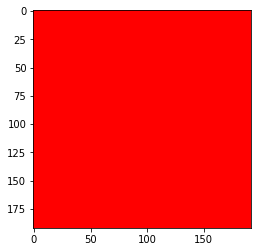

In [ ]:
plt.imshow(x[2])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


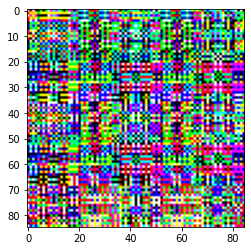

In [ ]:
x_augmented=x*10**2
plt.imshow(x_augmented[0])

In [ ]:
#En effet, il faudrait faire ça en plusieurs étapes. Si votre image de
#sortie fait 224x224 pixels, alors des convolutions transposées
#avec des strides de 2, 2, 2, 2, 2 et 7 marcheraient, par exemple.

x=tf.keras.layers.UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest")(x)
x=tf.keras.layers.Conv2DTranspose(
    filters=224, kernel_size=223, strides=(1, 1),
    output_padding=None, data_format=None, dilation_rate=(1, 1), activation=None,
    use_bias=True, kernel_initializer='glorot_uniform',
    bias_initializer='zeros', kernel_regularizer=None,
    bias_regularizer=None, activity_regularizer=None, kernel_constraint=None,
    bias_constraint=None)(x)
x=tf.keras.layers.Conv2DTranspose(
    filters=224, kernel_size=1, strides=(2, 2), padding='valid',
    output_padding=None, data_format=None, dilation_rate=(1, 1), activation=None,
    use_bias=True, kernel_initializer='glorot_uniform',
    bias_initializer='zeros', kernel_regularizer=None,
    bias_regularizer=None, activity_regularizer=None, kernel_constraint=None,
    bias_constraint=None)(x)
x=tf.keras.layers.UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest")(x)

ResourceExhaustedError: ignored

In [ ]:
x.shape

In [ ]:
x[0,:,:,2]

In [ ]:

x=tf.keras.layers.UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest")(x)
x=tf.keras.layers.Conv2D(
    filters=,
    kernel_size=3,
    strides=(1, 1),
    padding="valid",
    data_format=None,
    dilation_rate=(1, 1),
    groups=1,
    activation=None,
    use_bias=True,
    kernel_initializer="glorot_uniform",
    bias_initializer="zeros",
    kernel_regularizer=None,
    bias_regularizer=None,
    activity_regularizer=None,
    kernel_constraint=None,
    bias_constraint=None)(x)

In [ ]:
x.shape

TensorShape([208, 2, 2, 3])

TensorShape([208, 2, 2, 448])

In [ ]:
x[0,:,:,2]

<tf.Tensor: shape=(2, 2), dtype=float32, numpy=
array([[-0.25489318, -0.25489318],
       [-0.25489318, -0.25489318]], dtype=float32)>

In [ ]:

x=Conv2DTranspose(filters=224,kernel_size=(1,1),strides=4,
                                activation='relu',
                                padding='same')(input)
x=Conv2D(filters=112, kernel_size=(1,1),strides=1,
                                activation='relu',
                                padding='same')(x)
x=Conv2DTranspose(filters=66,kernel_size=(1,1),strides=4,
                                activation='relu',
                                padding='same')(x)
x=Conv2D(filters=33,kernel_size=(1,1),strides=1,
                                activation='relu',
                                padding='same')(x)
x=Conv2DTranspose(filters=11,kernel_size=(1,1),strides=4,
                                activation='relu',
                                padding='same')(x)
x=Conv2D(filters=3,kernel_size=(1,1),strides=1,
                                activation='relu',
                                padding='same')(x)
      

In [ ]:
from tensorflow.keras import backend as K


input=block_train_features[best_level].reshape((block_train_features[best_level].shape[0],1,1,block_train_features[best_level].shape[1]))
x=Conv2DTranspose(filters=224,kernel_size=(1,1),strides=4,
                                activation='relu',
                                padding='same')(input)
x=Conv2D(filters=112, kernel_size=(1,1),strides=1,
                                activation='relu',
                                padding='same')(x)
x=Conv2DTranspose(filters=66,kernel_size=(1,1),strides=4,
                                activation='relu',
                                padding='same')(x)
x=Conv2D(filters=33,kernel_size=(1,1),strides=1,
                                activation='relu',
                                padding='same')(x)
x=Conv2DTranspose(filters=11,kernel_size=(1,1),strides=4,
                                activation='relu',
                                padding='same')(x)
x=Conv2D(filters=3,kernel_size=(1,1),strides=1,
                                activation='relu',
                                padding='same')(x)
      


x.shape

TensorShape([208, 64, 64, 3])

In [ ]:
x[1]

<tf.Tensor: shape=(64, 64, 3), dtype=float32, numpy=
array([[[0.       , 0.0017098, 0.       ],
        [0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       ],
        ...,
        [0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       ]],

       [[0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       ],
        ...,
        [0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       ]],

       [[0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       ],
        ...,
        [0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       ]],

       ...,

       [[0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       ],
        [0.       , 0.       

In [ ]:
#using transposed conv2D
def decoder
input=block_train_features[best_level]
x=Dense()
        # Build the Decoder Model
        latent_inputs = Input(shape=(latent_dim,))
        x = Dense(last_shape[1] * last_shape[2] * last_shape[3])(latent_inputs)
        x = Reshape((last_shape[1], last_shape[2], last_shape[3]))(x)

        # Stack of Transposed Conv2D blocks
        for j in range(2):
            x = Conv2DTranspose(filters=self.layer_filters[-j-1],
                                kernel_size=self.kernel_size[-j-1],
                                strides=2,
                                activation='relu',
                                padding='same')(x)
            
            # x = BatchNormalization(axis=3)(x)

            x = Conv2D(filters=self.layer_filters[-j-1],
                                kernel_size=self.kernel_size[-j-1],
                                strides=1,
                                activation='relu',
                                padding='same')(x) 

            # x = BatchNormalization(axis=3)(x)                           

        # The activation of the output layer is a sigmoid, so that output values
        # are in the same range as input values
        outputs = Conv2D(filters=1,
                        kernel_size=3,
                        strides=1,
                        activation='sigmoid',
                        padding='same')(x)


(208, 448)

In [ ]:
input_shape=block_train_features[best_level]
x=

In [ ]:
input_shape=block_train_features[best_level].reshape(block_train_features[best_level].shape[0],1,1,block_train_features[best_level].shape[1])
x=tf.keras.layers.UpSampling2D(
    size=(2, 2), data_format=None, interpolation="nearest")(latent_inputs)
x=tf.keras.layers.Conv2DTranspose(filters=1, kernel_size=(1,1), strides=(2, 2), padding='valid',
    output_padding=None, data_format=None, dilation_rate=(1, 1), activation=None,
    use_bias=True, kernel_initializer='glorot_uniform',
    bias_initializer='zeros', kernel_regularizer=None,
    bias_regularizer=None, activity_regularizer=None, kernel_constraint=None,
    bias_constraint=None,)(x)






In [ ]:
x.shape

TensorShape([208, 4, 4, 1])

In [ ]:
block_train_features[best_level][0]

array([8.96114949e-03, 9.67479467e-01, 1.62780785e-03, 7.46386871e-02,
       5.30646108e-02, 7.05897389e-03, 9.46064387e-03, 0.00000000e+00,
       3.10373213e-02, 6.52410448e-01, 3.06019472e-04, 2.65692268e-03,
       1.35406941e-01, 2.72759140e-01, 2.48363730e-03, 5.01654744e-01,
       9.78531897e-01, 0.00000000e+00, 1.58572663e-03, 0.00000000e+00,
       0.00000000e+00, 1.40927220e-03, 4.82893258e-01, 2.53208697e-01,
       9.69983666e-05, 2.88834870e-02, 3.32188122e-02, 1.22885823e-01,
       5.60951650e-01, 7.98462331e-01, 3.88831459e-03, 2.94204354e-01,
       5.18997163e-02, 3.18489125e-04, 1.52821869e-01, 2.43601277e-01,
       3.18875521e-01, 6.68187201e-01, 1.06399691e+00, 9.46295485e-02,
       1.16878182e-01, 2.63953395e-03, 0.00000000e+00, 3.10233533e-01,
       2.01737672e-01, 5.76985127e-04, 0.00000000e+00, 2.03763018e-03,
       5.02894185e-02, 0.00000000e+00, 9.62613150e-02, 2.31220394e-01,
       3.33639607e-02, 1.36715996e+00, 1.13207670e-02, 6.49861574e-01,
      

In [ ]:
x[0]

<tf.Tensor: shape=(4, 4, 1), dtype=float32, numpy=
array([[[0.5300075],
        [0.       ],
        [0.5300075],
        [0.       ]],

       [[0.       ],
        [0.       ],
        [0.       ],
        [0.       ]],

       [[0.5300075],
        [0.       ],
        [0.5300075],
        [0.       ]],

       [[0.       ],
        [0.       ],
        [0.       ],
        [0.       ]]], dtype=float32)>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


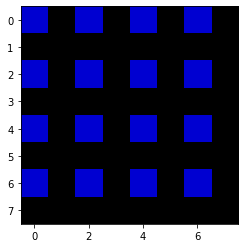

In [ ]:
plt.imshow(x[0])

In [ ]:
latent_inputs=Input(shape=(block_train_features[best_level].reshape(block_train_features[best_level].shape[0],1,1,block_train_features[best_level].shape[1]),))
x=tf.keras.layers.UpSampling2D(
    size=(2, 2), data_format=None, interpolation="nearest")(latent_inputs)
x=tf.keras.layers.UpSampling2D(
    size=(2, 2), data_format=None, interpolation="nearest")(x)
x=tf.keras.layers.UpSampling2D(
    size=(2, 2), data_format=None, interpolation="nearest")(x)
x=tf.keras.layers.UpSampling2D(
    size=(2, 2), data_format=None, interpolation="nearest")(x)
x=tf.keras.layers.UpSampling2D(
    size=(2, 2), data_format=None, interpolation="nearest")(x)
x=tf.keras.layers.UpSampling2D(
    size=(2, 2), data_format=None, interpolation="nearest")(x)
output=tf.keras.layers.UpSampling2D(
    size=(2, 2), data_format=None, interpolation="nearest")(x)
model=keras.Model(latent_inputs,output,name=(block))

TypeError: ignored

In [ ]:
class Decoder:
  def __init__(self, shape, level, model,verbose=True):
    self.input_shape = shape
    self.level = level
    self.verbose = verbose

# Build the Decoder Model
    latent_inputs = Input(shape=(block_train_features[best_level].shape,))
    x = Dense(last_shape[1] * last_shape[2] * last_shape[3])(latent_inputs)
    x = Reshape((last_shape[1], last_shape[2], last_shape[3]))(x)


In [ ]:
la
new_decoder=Decoder(shape,best_level,model)

NameError: ignored

### Show normal and Anormal  data detected by the function

In [ ]:
normal_label=y_test_label[errs<=threshold_maha]

IndexError: ignored

In [ ]:
normal_maha = x_test[errs <= threshold_maha]



Images that are regarded as normal by the algorithme : 20


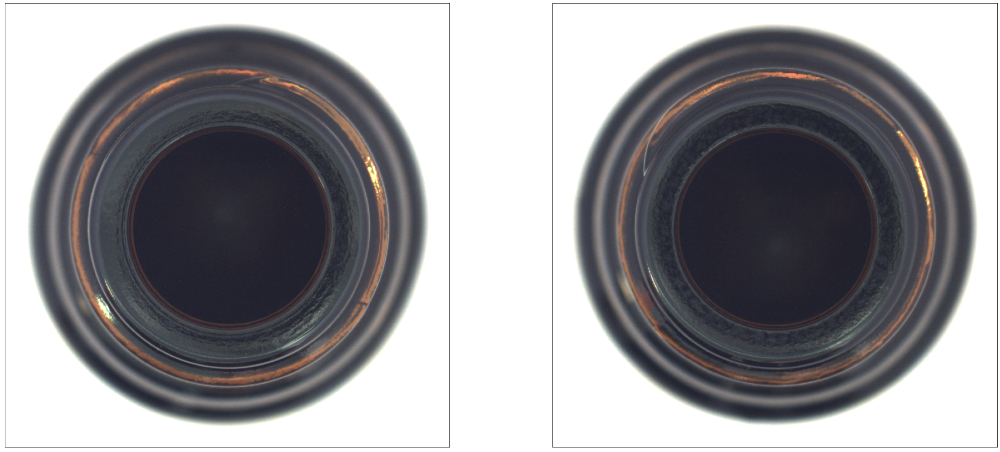

In [ ]:
print("Images that are regarded as normal by the algorithme : %d" %(normal_maha.shape[0]))

plt.figure(figsize=(40, 40))
m=2
for i in range(m):
    # display original
    ax = plt.subplot(2, m, i + 1)
    plt.imshow(normal_maha[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)


Images that are regarded as anormal by the algorithme : 20


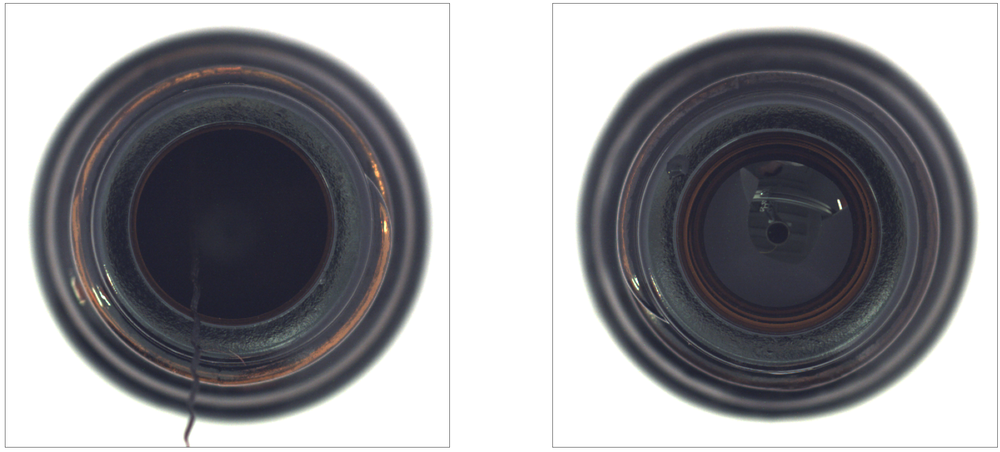

In [ ]:
anormal_maha=x_test[errs >= threshold_maha]

print("Images that are regarded as anormal by the algorithme : %d" %(anormal_maha.shape[0]))
plt.figure(figsize=(40, 40))
m=2
for i in range(m):
    # display original
    ax = plt.subplot(2, m, i + 1)
    plt.imshow(anormal_maha[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

### Show normal data and anormal that are falsely detected 

In [ ]:
false_positive_label_1=false_positive_label[1]
compter=false_positive_label_1[false_positive_label_1>0]
print(compter)
len(compter)


NameError: ignored

Images that are anormal but are seen as normal (failure): 4


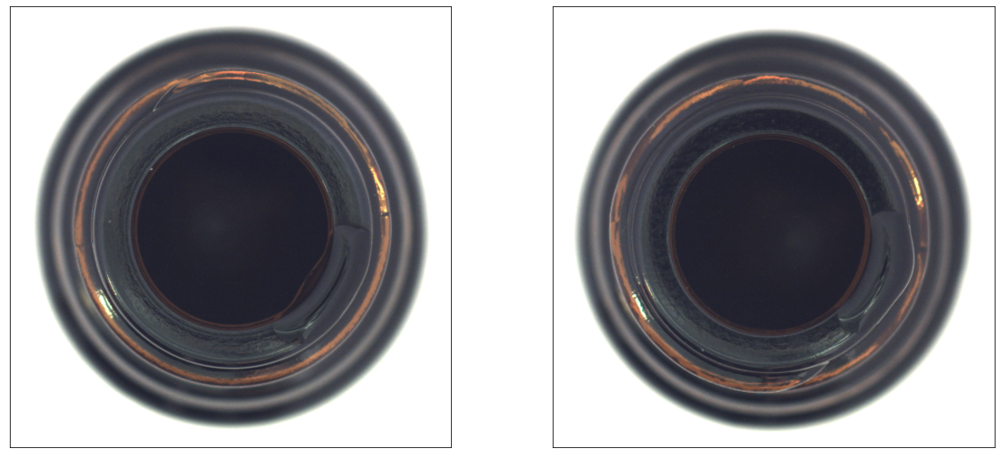

In [ ]:
#false positive: 
#false_positive_label=y_test_label[(errs<=threshold_maha) & (y_test[:,0]==1)]
x_false_positive = x_test[(errs<=threshold_maha) & (y_test[:,0]==1)] #error inférieur à threshold alors elles sont vu comme étant normal mais le label est 1 donc elels sont anormal
print("Images that are anormal but are seen as normal (failure): %d" %(x_false_positive.shape[0]))
#print("Images that are anormal but are seen as normal (checking labelling was done right): %d" %(false_positive_label.shape[0]))


plt.figure(figsize=(20,20))
for i in range(m):
    # display original
    ax = plt.subplot(2, m, i + 1)
    plt.imshow(x_false_positive[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

Images that are anormal and are seen as anormal(success): 17


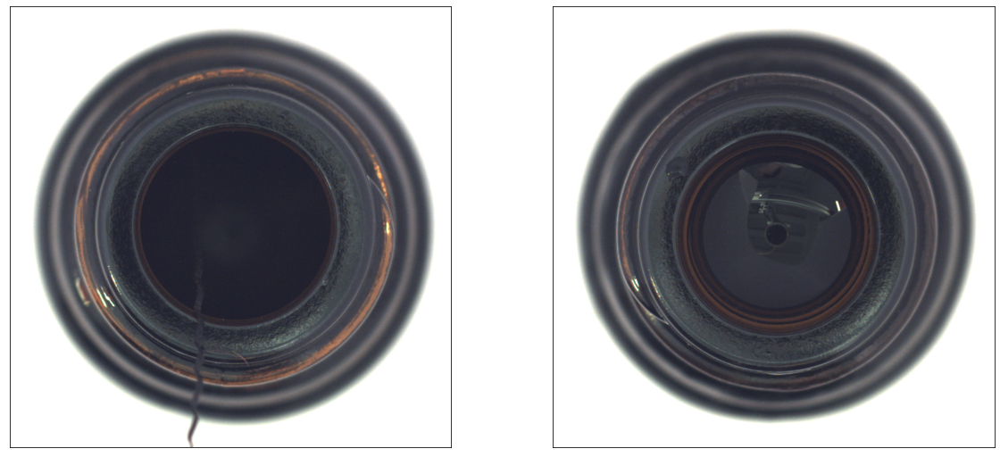

In [ ]:
#true negative :
#true_negative_label=y_test_label[(errs>=threshold_maha) & (y_test[:,0]==1)]
x_true_negative = x_test[(errs>=threshold_maha) & (y_test[:,0]==1)] #error supérieur au threshold, elles sont vu comme anormal mais elles sont en fait normal
print("Images that are anormal and are seen as anormal(success): %d" %(x_true_negative.shape[0]))
plt.figure(figsize=(20,20))
m=2
for i in range(m):
    # display original
    ax = plt.subplot(2, m, i + 1)
    plt.imshow(x_true_negative[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

In [ ]:
true_negative_label_1=true_negative_label[14]
compter=true_negative_label_1[true_negative_label_1>0]
print(compter)
len(compter)

[0.5019608 0.5019608 0.5019608 ... 0.5019608 0.5019608 0.5019608]


10569

Images that are normal but failed to be recognized: 4


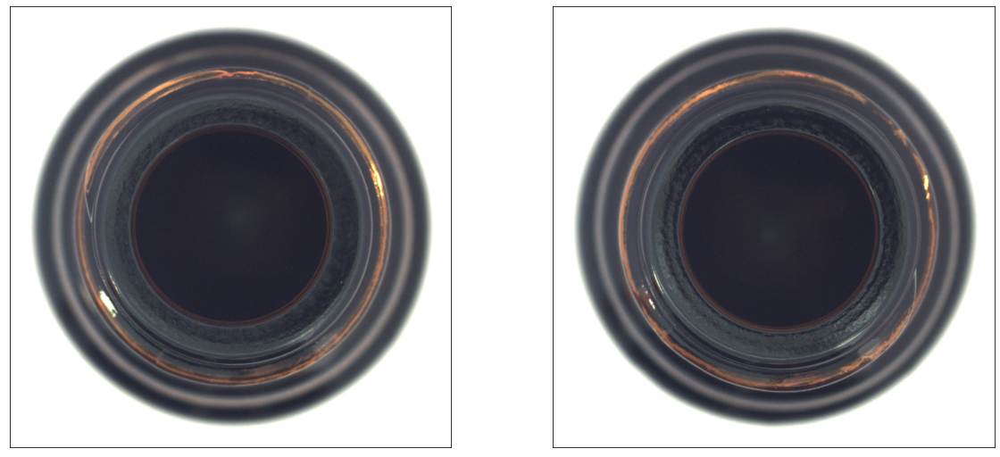

In [ ]:
#false negative
x_false_negative = x_test[(errs>=threshold_maha) & (y_test[:,0]==0)] #error supérieur au threshold, elles sont vu comme anormal mais elles sont en fait normal
print("Images that are normal but failed to be recognized: %d" %(x_false_positive.shape[0]))
plt.figure(figsize=(20,20))
m=2
for i in range(m):
    # display original
    ax = plt.subplot(2, m, i + 1)
    plt.imshow(x_false_negative[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

### Plot the results: 

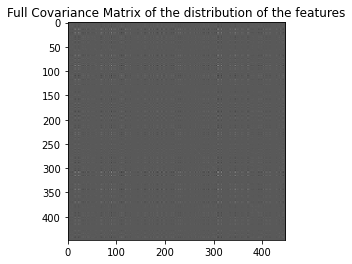

In [ ]:
plt.figure()
plt.title('Full Covariance Matrix of the distribution of the features')
plt.imshow(emp_cov.covariance_)
plt.show()

In [ ]:
print(emp_cov.covariance_.shape)

(448, 448)


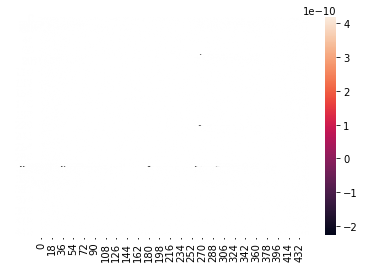

In [ ]:
sns.heatmap(emp_cov.covariance_,annot=True, fmt='g')
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


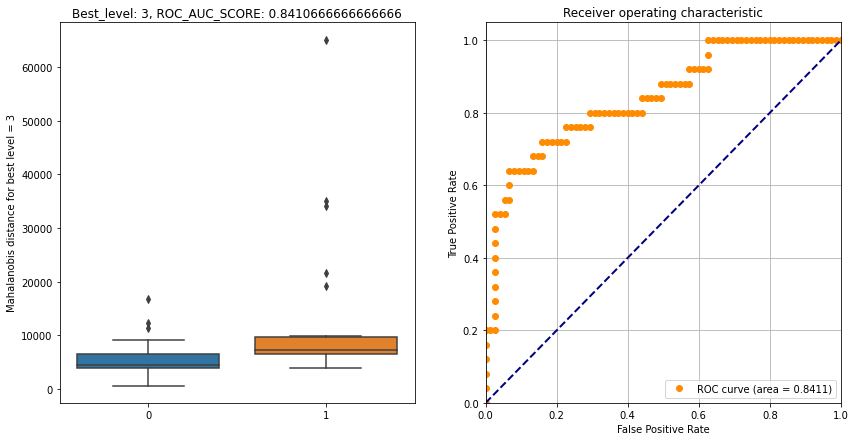

In [ ]:
#Box plot et courbe AUC pour le meilleur niveau
def plot_AUC(fpr,tpr,AUC):
    lw = 2
    plt.plot(fpr, tpr, 'o',color='darkorange', label='ROC curve (area = %0.4f)' % AUC)
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.grid('on')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

best_res = max(res_maha)
best_level = res_maha.index(best_res)+1
best_errs = EmpiricalCovariance().fit(block_train_features[best_level-1]).mahalanobis(block_test_features[best_level-1])
plt.figure(figsize=(14,7))
plt.subplot(1,2,1)
errs_array = np.reshape(errs,[errs.shape[0],1])
sns.boxplot(np.squeeze(y_test),errs)
plt.ylabel('Mahalanobis distance for best level = '+str(best_level))
plt.title('Best_level: ' + str(best_level) + ', ROC_AUC_SCORE: ' + str(best_res))
fpr, tpr, thresholds = roc_curve(y_test==class_num, best_errs, drop_intermediate=False)
AUC=auc(fpr,tpr)
plt.subplot(1,2,2)
plot_AUC(fpr,tpr,AUC)
plt.show()

The best AUC score is 0.84 for level 3


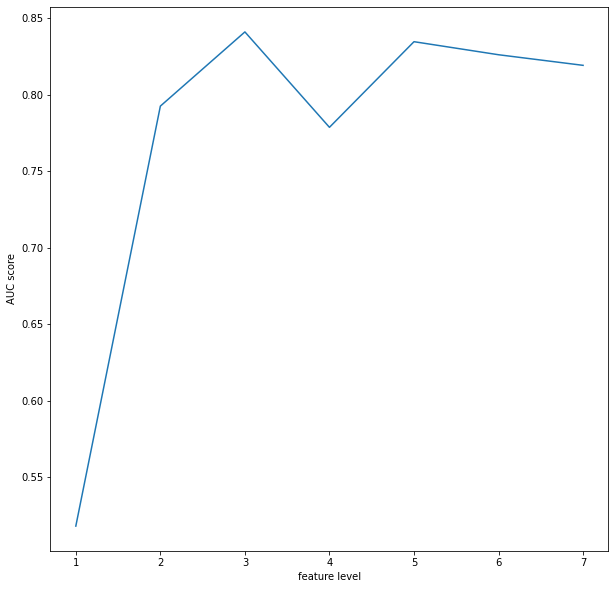

In [ ]:
#Plot the AUC scores en fonction des levels
plt.figure(figsize=(10, 10))
plt.ylabel('AUC score')
plt.xlabel('feature level')
plt.plot(feature_level, res_maha)
print('The best AUC score is %.2f for level %d' % (best_res, best_level))

#Trying another PCA ???

In [ ]:
# reshape x_train in 2D array: 
x_train.shape
x_train3D=x_train[:,:,:,0]
nsamples,nx,ny=x_train3D.shape
x_train2D= x_train3D.reshape((nsamples,nx*ny))

#Scaling the data: 
from sklearn.preprocessing import StandardScaler
x_train2D= StandardScaler().fit_transform(x_train2D)



In [ ]:
# compute covariance of the data: 

## Compute the mean of the data
mean_vec = np.mean(x_train2D, axis=0)

## Compute the covariance matrix
cov_mat = (x_train2D - mean_vec).T.dot((x_train2D - mean_vec)) / (x_train2D.shape[0]-1)

In [ ]:
# Compute the eigen values and vectors using numpy
eig_vals, eig_vecs = np.linalg.eig(cov_mat)

# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort(key=lambda x: x[0], reverse=True)


In [ ]:
exp_var_percentage = 0.97 # Threshold of 97% explained variance

tot = sum(eig_vals)
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

num_vec_to_keep = 0

for index, percentage in enumerate(cum_var_exp):
  if percentage > exp_var_percentage:
    num_vec_to_keep = index + 1
    break

In [ ]:
num_features = x_train2D.shape[1]
proj_mat = eig_pairs[0][1].reshape(num_features,1)
for eig_vec_idx in range(1, num_vec_to_keep):
  proj_mat = np.hstack((proj_mat, eig_pairs[eig_vec_idx][1].reshape(num_features,1)))

# Project the data 
pca_data = x_train2D.dot(proj_mat)

#PCA and NPCA to understand why it works ? Also tried T-SNE

Image has 128x128 pixels, so data has 16384 features.


 Now for computers such amount of data isn't that big, but there can be cases, when dimensional reduction can be important. It is better for further processing to have 100 features containing most of the data than 800 features.

Before I use PCA to reduce dimensionality of the data I will standardize it using sklearn StandartScaler. It is fitted to train data, because I assume that I know nothing about test data. Both datasets are transformed.

## PCA: 

In [ ]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from keras.models import Sequential
from keras.utils import np_utils
from keras.layers import Dense, Dropout, GaussianNoise, Conv1D
from keras.preprocessing.image import ImageDataGenerator

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [ ]:
x_train_pca=x_train[:,:,:,0]
x_train_pca=x_train_pca.reshape(500,128*128)
print(x_train_pca.shape)

x_test_pca=x_test[:,:,:,0]
x_test_pca=x_test_pca.reshape(149,128*128)
print(x_test_pca.shape)


(500, 16384)
(149, 16384)


Text(0, 0.5, 'Cumulative explained variance')

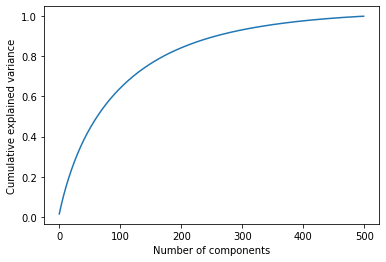

In [ ]:

pca = PCA(n_components=500)

pca.fit(x_train_pca)
#n_components == min(n_samples, n_features)

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

In plot above we can see that cumulative explained variance is very high near 300 and then it increases very slowly. That means that data describing changes is mostly contained in 300 components. We need to evaluate trade-offs before we choose number of components we use further. I choose 300 to check how it will work as it seems to have most of the data.

In [ ]:
#standardization of data: 

scaler = StandardScaler()
scaler.fit(x_train_pca)
X_sc_train = scaler.transform(x_train_pca)
X_sc_test = scaler.transform(x_test_pca)
print(X_sc_test.shape,X_sc_train.shape)

(149, 16384) (500, 16384)


In [ ]:
NCOMPONENTS = 300

pca = PCA(n_components=NCOMPONENTS)
X_pca_train = pca.fit_transform(X_sc_train)
X_pca_test = pca.transform(X_sc_test)
pca_std = np.std(X_pca_train)

print(X_sc_train.shape)
print(X_pca_train.shape)

(500, 16384)
(500, 300)


In [ ]:
inv_pca_train = pca.inverse_transform(X_pca_train)
inv_sc_train = scaler.inverse_transform(inv_pca_train)

inv_pca_test=pca.inverse_transform(X_pca_test)
inv_sc_test=scaler.inverse_transform(inv_pca_test)

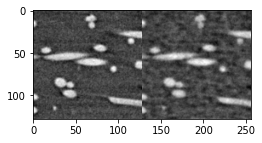

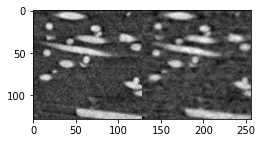

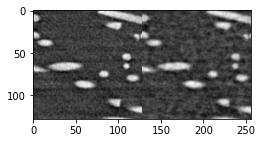

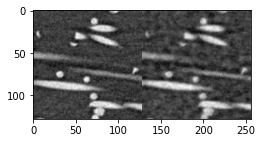

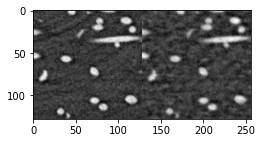

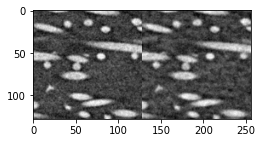

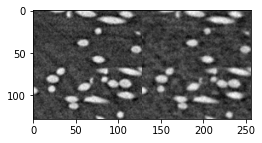

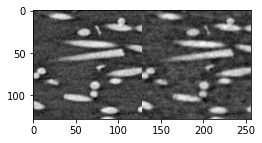

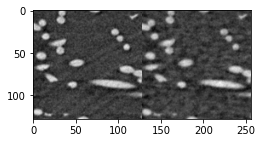

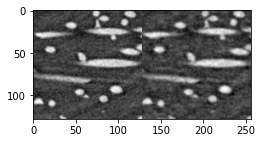

In [ ]:
def side_by_side(indexes):
    org = x_train_pca[indexes].reshape(128,128)
    rec = inv_sc_train[indexes].reshape(128,128)
    pair = np.concatenate((org, rec), axis=1)
    plt.figure(figsize=(4,2))
    plt.imshow(pair)
    plt.show()
    
for index in range(0,10):
    side_by_side(index)

In [ ]:
#reshape of inv_sc_train/test: 
x_train_pca=np.zeros((500,128,128))

for index in range(500):
  new_image=inv_sc_train[index].reshape(128,128)
  x_train_pca[index,:new_image.shape[0],:new_image.shape[1]]=new_image

#x_train_pca=np.repeat(x_train_pca[..., np.newaxis], 3, -1)


x_train_pca=np.repeat(x_train_pca[..., np.newaxis], 3, -1)


x_test_pca=np.zeros((149,128,128))

for index in range(inv_sc_test.shape[0]):
  new_image=inv_sc_test[index].reshape(128,128)
  x_test_pca[index,:new_image.shape[0],:new_image.shape[1]]=new_image

#x_train_pca=np.repeat(x_train_pca[..., np.newaxis], 3, -1)


x_test_pca=np.repeat(x_test_pca[..., np.newaxis], 3, -1)

In [ ]:
X_pca_train.shape

(500, 300)

In [ ]:
X_pca_test.shape

(149, 300)

In [ ]:
# reshape of X_train_pca  and X_test_pca
nsamples=500
X_pca_train=np.repeat(X_pca_train[..., np.newaxis], 3, -1)

X_pca_train.shape


(500, 300, 3)

In [ ]:
X_pca_train=X_pca_train.reshape(nsamples,20,15,3)

In [ ]:
X_pca_train.shape

(500, 20, 15, 3)

In [ ]:

nsamples=149
X_pca_test=np.repeat(X_pca_test[..., np.newaxis], 3, -1)


In [ ]:
X_pca_test.shape

(149, 300, 3)

In [ ]:

X_pca_test=X_pca_test.reshape(149,20,15,3)
X_pca_test.shape

(149, 20, 15, 3)

In [ ]:


#resize train and test: 
IMG_SIZE=128
X_pca_train128=np.zeros((num_train,IMG_SIZE,IMG_SIZE,3))
num_train=y_train.shape[0]
for i in range(num_train):
  new_image=cv2.resize(X_pca_train[i], dsize=(IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_CUBIC)
  mini = new_image.min()
  maxi = new_image.max()
  print(new_image.shape)
  for j in range(new_image.shape[1]):
    new_image[:,j] = (new_image[:,j]-mini)*(1/(maxi-mini))
  X_pca_train128[i,:new_image.shape[0],:new_image.shape[1],:]=new_image
print('x_pca_train128.shape: ', X_pca_train128.shape)

IMG_SIZE=128
X_pca_test128=np.zeros((num_test,IMG_SIZE,IMG_SIZE,3))
num_test=149
for i in range(num_test):
  new_image=cv2.resize(X_pca_test[i], dsize=(IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_CUBIC)
  mini = new_image.min()
  maxi = new_image.max()
  print(new_image.shape)
  for j in range(new_image.shape[1]):
    new_image[:,j] = (new_image[:,j]-mini)*(1/(maxi-mini))
  X_pca_test128[i,:new_image.shape[0],:new_image.shape[1],:]=new_image
print('x_pca_train128.shape: ', X_pca_test128.shape)





(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 

In [ ]:
#utilisation de la méthode fonctionnelle pour créer les différents modèles: 
listeB4=['block1b_project_conv','block2d_project_conv','block3d_project_conv','block4f_project_conv','block5e_project_conv','block6h_project_conv','block7a_activation','block7a_project_conv','block7b_project_conv','top_bn','top_activation']
listeB5=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5g_project_conv','block6i_project_conv','block7b_project_conv']
listeB6=['block1c_project_conv','block2f_project_conv','block3f_project_conv','block4h_project_conv','block5h_project_conv','block6k_project_conv','block7c_project_conv']
listeB1=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5c_project_conv','block6c_project_conv','block7b_project_conv']
listeRS50=['conv1_conv','conv2_block3_3_conv','conv3_block4_3_conv','conv4_block6_3_conv','conv5_block3_3_conv']
listeRS152=['conv1_conv','conv2_block3_3_conv','conv3_block3_3_conv','conv4_block36_3_conv','conv5_block3_3_conv']
listeRS50V2=['pool1_pool', 'conv2_block3_3_conv','conv3_block4_3_conv','max_pooling2d_2','conv4_block6_3_conv','conv5_block3_3_conv']

block_train_features=[]
block_test_features=[]

for block in listeB4:
  print(block)
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  prev_model = prev_model(input)
  #x=layers.GlobalMaxPooling2D(data_format=None)(prev_model)
  x=layers.GlobalAveragePooling2D(data_format=None)(prev_model)
  x=layers.Dropout(0.1)(x)
  #output=layers.Dense(32)(x)
  
  output=layers.Flatten()(x)
  model=keras.Model(input,output,name=(block))
  # model.summary()
  # model.save(block)
  block_train_features.append(model.predict(X_pca_train128))
  block_test_features.append(model.predict(X_pca_test128))


block1b_project_conv
block2d_project_conv
block3d_project_conv
block4f_project_conv
block5e_project_conv
block6h_project_conv
block7a_activation
block7a_project_conv
block7b_project_conv
top_bn
top_activation


In [ ]:
#dans block train features les 7premiers niveaux correspondent à efficient net b1, puis les 7 suivant à b4, puis à B6. 


res_maha=[]

for k in range(len(listeB4)+1):
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    print(z_test.shape)
    
    errs = emp_cov.mahalanobis(np.nan_to_num(z_test))
    res_maha.append(roc_auc_score(y_test==1, np.nan_to_num(errs)))
    print('The AUC score for level %d is %.2f' % (k, res_maha[-1]))

(149, 1792)
The AUC score for level 0 is 0.53
(149, 24)
The AUC score for level 1 is 0.42
(149, 32)
The AUC score for level 2 is 0.55
(149, 56)
The AUC score for level 3 is 0.55
(149, 112)
The AUC score for level 4 is 0.55
(149, 160)
The AUC score for level 5 is 0.53
(149, 272)
The AUC score for level 6 is 0.55
(149, 1632)
The AUC score for level 7 is 0.53
(149, 448)
The AUC score for level 8 is 0.53
(149, 448)
The AUC score for level 9 is 0.49
(149, 1792)
The AUC score for level 10 is 0.53
(149, 1792)
The AUC score for level 11 is 0.53


##NPCA: 

In [ ]:
x_train_npca=x_train[:,:,:,0]
x_train_npca=x_train_npca.reshape(500,128*128)
print(x_train_npca.shape)

x_test_npca=x_test[:,:,:,0]
x_test_npca=x_test_npca.reshape(149,128*128)
print(x_test_npca.shape)

(500, 16384)
(149, 16384)


Text(0, 0.5, 'Cumulative explained variance')

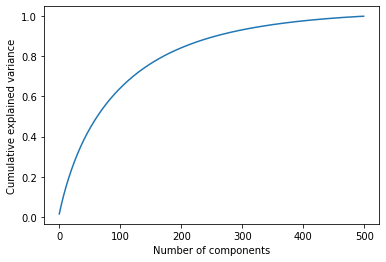

In [ ]:


pca = PCA(n_components=500)

pca.fit(x_train_npca)
#n_components == min(n_samples, n_features)

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

Text(0, 0.5, 'Cumulative explained variance')

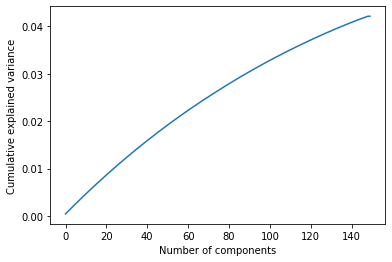

In [ ]:
#compute the least variance vectors: 
npca_variance=pca.explained_variance_ratio_[350:]
npca_percent=pca.explained_variance_ratio_[350:]
#print(pca_percent)
plt.plot(np.cumsum(pca_least_variance))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

#correponds à 5% de la variance totale. 

In [ ]:
#standardization of data: 
scaler = StandardScaler()
scaler.fit(x_train_npca)
X_sc_train = scaler.transform(x_train_npca)
X_sc_test = scaler.transform(x_test_npca)


In [ ]:
NCOMPONENTS = 500

pca = PCA(NCOMPONENTS)
X_pca_train = pca.fit_transform(X_sc_train)
X_pca_test = pca.transform(X_sc_test)
pca_std = np.std(X_pca_train)

print(X_sc_train.shape)
print(X_pca_train.shape)

(500, 16384)
(500, 500)


In [ ]:
X_npca_train=X_pca_train[:,350:500]
X_npca_test=X_pca_train[:,350:500]
npca_std = np.std(X_npca_train)



In [ ]:
print(X_sc_train.shape)
print(X_npca_train.shape)

(500, 16384)
(500, 150)


In [ ]:
inv_pca = pca.inverse_transform(X_pca_train)

inv_npca=inv_pca[350:]
inv_sc = scaler.inverse_transform(inv_npca)
print(inv_npca.shape)
print(inv_sc.shape)

(150, 16384)
(150, 16384)


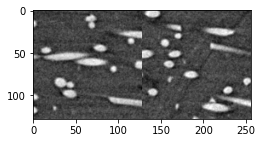

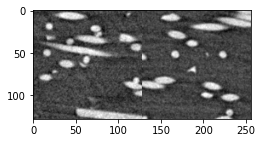

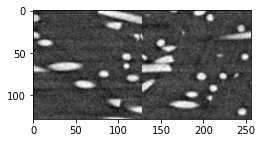

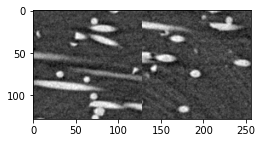

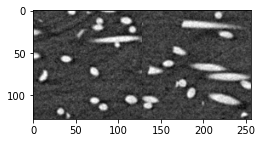

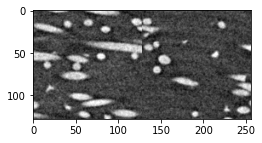

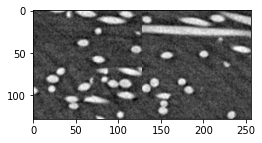

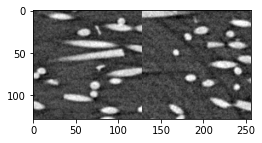

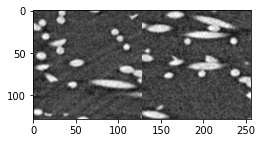

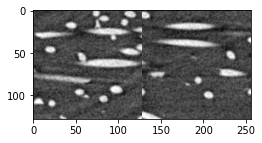

In [ ]:
def side_by_side(indexes):
    org = x_train_npca[indexes].reshape(128,128)
    rec = inv_sc[indexes].reshape(128,128)
    pair = np.concatenate((org, rec), axis=1)
    plt.figure(figsize=(4,2))
    plt.imshow(pair)
    plt.show()
    
for index in range(0,10):
    side_by_side(index)

On observe déjà que malgré que ces features comptent pour une faible partie de la variance, la reconstruction est bien faites voire mieux que celle avec le pca. 

In [ ]:
x_train_npca=np.zeros((500,128,128))

In [ ]:


for index in range(500):
  new_image=inv_sc_train[index].reshape(128,128)
  x_train_npca[index,:new_image.shape[0],:new_image.shape[1]]=new_image

#x_train_pca=np.repeat(x_train_pca[..., np.newaxis], 3, -1)


x_train_npca=np.repeat(x_train_npca[..., np.newaxis], 3, -1)




In [ ]:
x_test_npca=np.zeros((149,128,128))

for index in range(inv_sc_test.shape[0]):
  new_image=inv_sc_test[index].reshape(128,128)
  x_test_npca[index,:new_image.shape[0],:new_image.shape[1]]=new_image

#x_train_pca=np.repeat(x_train_pca[..., np.newaxis], 3, -1)


x_test_npca=np.repeat(x_test_npca[..., np.newaxis], 3, -1)

In [ ]:
#reshape to use our model: 
X_npca_train_reshape=np.zeros((500,15,10))

for index in range(X_npca_train.shape[0]):
  new_image=X_npca_train[index].reshape(15,10)
  X_npca_train_reshape[index,:new_image.shape[0],:new_image.shape[1]]=new_image

X_npca_train_reshape=np.repeat(X_npca_train_reshape[..., np.newaxis], 3, -1)
print(X_npca_train_reshape.shape)


#reshape to use our model: 
X_npca_test_reshape=np.zeros((149,15,10))

for index in range(X_npca_test.shape[0]):
  new_image=X_npca_test[index].reshape(15,10)
  X_npca_test_reshape[i,:new_image.shape[0],:new_image.shape[1]]=new_image

X_npca_test_reshape=np.repeat(X_npca_test_reshape[..., np.newaxis], 3, -1)
print(X_npca_test_reshape.shape)



#increase size: 


(500, 15, 10, 3)
(149, 15, 10, 3)


In [ ]:
#utilisation de la méthode fonctionnelle pour créer les différents modèles: 
listeB4=['block1b_project_conv','block2d_project_conv','block3d_project_conv',
         'block4f_project_conv','block5e_project_conv','block6h_project_conv','block7a_activation','block7a_project_conv','block7b_project_conv','top_bn','top_activation']
listeB5=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5g_project_conv','block6i_project_conv','block7b_project_conv']
listeB6=['block1c_project_conv','block2f_project_conv','block3f_project_conv','block4h_project_conv','block5h_project_conv','block6k_project_conv','block7c_project_conv']
listeB1=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5c_project_conv','block6c_project_conv','block7b_project_conv']
listeRS50=['conv1_conv','conv2_block3_3_conv','conv3_block4_3_conv','conv4_block6_3_conv','conv5_block3_3_conv']
listeRS152=['conv1_conv','conv2_block3_3_conv','conv3_block3_3_conv','conv4_block36_3_conv','conv5_block3_3_conv']
listeRS50V2=['pool1_pool', 'conv2_block3_3_conv','conv3_block4_3_conv','max_pooling2d_2','conv4_block6_3_conv','conv5_block3_3_conv']

block_train_features=[]
block_test_features=[]

for block in listeB4:
  print(block)
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  prev_model = prev_model(input)
  #x=layers.GlobalMaxPooling2D(data_format=None)(prev_model)
  x=layers.GlobalAveragePooling2D(data_format=None)(prev_model)
  x=layers.Dropout(0.1)(x)
  #output=layers.Dense(32)(x)
  
  output=layers.Flatten()(x)
  model=keras.Model(input,output,name=(block))
  # model.summary()
  # model.save(block)
  block_train_features.append(model.predict(x_train_npca))
  block_test_features.append(model.predict(x_test_npca))


block1b_project_conv
block2d_project_conv
block3d_project_conv
block4f_project_conv
block5e_project_conv
block6h_project_conv
block7a_activation
block7a_project_conv
block7b_project_conv
top_bn
top_activation


In [ ]:
#dans block train features les 7premiers niveaux correspondent à efficient net b1, puis les 7 suivant à b4, puis à B6. 
class_num = 1

res_maha=[]

for k in range(len(listeB4)+1):
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    print(z_test.shape)
    
    errs = emp_cov.mahalanobis(np.nan_to_num(z_test))
    res_maha.append(roc_auc_score(y_test==1, np.nan_to_num(errs)))
    print('The AUC score for level %d is %.2f' % (k, res_maha[-1]))

(149, 1792)
The AUC score for level 0 is 0.73
(149, 24)
The AUC score for level 1 is 0.53
(149, 32)
The AUC score for level 2 is 0.45
(149, 56)
The AUC score for level 3 is 0.74
(149, 112)
The AUC score for level 4 is 0.67
(149, 160)
The AUC score for level 5 is 0.71
(149, 272)
The AUC score for level 6 is 0.71
(149, 1632)
The AUC score for level 7 is 0.74
(149, 448)
The AUC score for level 8 is 0.65
(149, 448)
The AUC score for level 9 is 0.67
(149, 1792)
The AUC score for level 10 is 0.65
(149, 1792)
The AUC score for level 11 is 0.73


## TSNE

In [ ]:
from sklearn.manifold import TSNE, Isomap, MDS

# Try transfer learning and Fine tuning to try to increase the result:

## Trying while having only normal data in x_train  : 

In [ ]:
base_model= EfficientNetB4(weights='imagenet',include_top=False)
base_model.trainable=False
assert base_model.trainable==False

In [ ]:
1 in y_train # pas de classe anormal

False

Pb : on peut pas entrainer car on a rien à lui faire apprendre vu que l'on a aucune tache (ya que des images avec des 0) 


In [ ]:
#Make predictions with our model trained without fine tuning: 
listeB4=['block1b_project_conv','block2d_project_conv','block3d_project_conv','block4f_project_conv','block5c_project_conv','block5f_project_conv','block6b_project_conv','block6h_project_conv','block7b_project_conv']
listeB6=['block1c_project_conv','block2f_project_conv','block3f_project_conv','block4h_project_conv','block5h_project_conv','block6c_project_conv','block6k_project_conv','block7b_project_conv','block7c_project_conv']
listeB1=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5c_project_conv','block6c_project_conv','block7b_project_conv']
listeRS50=['conv1_conv','conv2_block3_3_conv','conv3_block4_3_conv','conv4_block6_3_conv','conv5_block3_3_conv']
block_train_features=[]
block_test_features=[]

#on utilise x_train et x_test plot dans "loading our own data" ou encore dans 'loading data of pierre shi..'

for block in listeB4:
  # We make sure that the base_model is running in inference mode here,
  # by passing `training=False`. This is important for fine-tuning, as you will
  # learn in a few paragraphs.
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  prev_model = prev_model(input,training=False)
  # Convert features of shape `base_model.output_shape[1:]` to vectors
  x = keras.layers.GlobalAveragePooling2D()(prev_model)  
  # A Dense classifier with a single unit (binary classification)
  outputs = keras.layers.Dense(1)(x)
  #x=layers.GlobalMaxPooling2D(data_format=None)(prev_model)
  #x=layers.Dropout(0.25)(x)
  #output=layers.Flatten()(x)
  model=keras.Model(input,outputs,name=(block))
  print(block)
  model.compile(optimizer=keras.optimizers.Adam(),
              loss=keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=[keras.metrics.BinaryAccuracy()])
  model.fit(x_train,y_train, epochs=20)
  block_train_features.append(model.predict(x_train)) #only normal data in x_train
  block_test_features.append(model.predict(x_test))
  


  
  


block1b_project_conv
Epoch 1/20
16/16 [==============================] - 1s 8ms/step - loss: 1.4715 - binary_accuracy: 0.0047
Epoch 2/20
16/16 [==============================] - 0s 7ms/step - loss: 0.7903 - binary_accuracy: 1.0000
Epoch 3/20
16/16 [==============================] - 0s 7ms/step - loss: 0.4006 - binary_accuracy: 1.0000
Epoch 4/20
16/16 [==============================] - 0s 7ms/step - loss: 0.2224 - binary_accuracy: 1.0000
Epoch 5/20
16/16 [==============================] - 0s 7ms/step - loss: 0.1421 - binary_accuracy: 1.0000
Epoch 6/20
16/16 [==============================] - 0s 7ms/step - loss: 0.1013 - binary_accuracy: 1.0000
Epoch 7/20
16/16 [==============================] - 0s 7ms/step - loss: 0.0775 - binary_accuracy: 1.0000
Epoch 8/20
16/16 [==============================] - 0s 7ms/step - loss: 0.0620 - binary_accuracy: 1.0000
Epoch 9/20
16/16 [==============================] - 0s 7ms/step - loss: 0.0512 - binary_accuracy: 1.0000
Epoch 10/20
16/16 [===============

In [ ]:
# plot auc-score for model without fine tuning but trained: 
#dans block train features les 7premiers niveaux correspondent à efficient net b1, puis les 7 suivant à b4, puis à B6. 
class_num = 1
feature_level=[1,2,3,4,5,6,7,8,9]
res_maha=[]

for k in feature_level:
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    errs = emp_cov.mahalanobis(z_test)
    res_maha.append(roc_auc_score(y_test==1, errs))
    print('The AUC score for level %d is %.2f' % (k, res_maha[-1]))

The AUC score for level 1 is 0.59
The AUC score for level 2 is 0.70
The AUC score for level 3 is 0.69
The AUC score for level 4 is 0.76
The AUC score for level 5 is 0.63
The AUC score for level 6 is 0.58
The AUC score for level 7 is 0.72
The AUC score for level 8 is 0.68
The AUC score for level 9 is 0.71


In [ ]:
# fine tuning :
base_model.trainable = True

In [ ]:
##Make predictions with our fine tuned model:  (seulement 10 epochs pour le fine tuning et very low learning rate)
listeB4=['block1b_project_conv','block2d_project_conv','block3d_project_conv','block4f_project_conv','block5c_project_conv','block5f_project_conv','block6b_project_conv','block6h_project_conv','block7b_project_conv']
listeB6=['block1c_project_conv','block2f_project_conv','block3f_project_conv','block4h_project_conv','block5h_project_conv','block6c_project_conv','block6k_project_conv','block7b_project_conv','block7c_project_conv']
listeB1=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5c_project_conv','block6c_project_conv','block7b_project_conv']
listeRS50=['conv1_conv','conv2_block3_3_conv','conv3_block4_3_conv','conv4_block6_3_conv','conv5_block3_3_conv']
block_train_features=[]
block_test_features=[]

for block in listeB4:
  inputs = keras.Input(shape=(128, 128, 3))
  # We make sure that the base_model is running in inference mode here,
  # by passing `training=False`. This is important for fine-tuning, as you will
  # learn in a few paragraphs.
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  x = prev_model(inputs,training=True)
  # Convert features of shape `base_model.output_shape[1:]` to vectors
  x = keras.layers.GlobalAveragePooling2D()(x)  
  # A Dense classifier with a single unit (binary classification)
  outputs = keras.layers.Dense(1)(x)
  #x=layers.GlobalMaxPooling2D(data_format=None)(prev_model)
  #x=layers.Dropout(0.25)(x)
  #output=layers.Flatten()(x)
  model = keras.Model(inputs, outputs)
  print(block)
  model.compile(optimizer=keras.optimizers.Adam(1e-5),
              loss=keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=[keras.metrics.BinaryAccuracy()])
  model.fit(x_train,y_train, epochs=10)
  block_train_features.append(model.predict(x_train))
  block_test_features.append(model.predict(x_test))
  


  # model.summary()
  # model.save(block)
  
  

  
  

block1b_project_conv
Epoch 1/10
16/16 [==============================] - 2s 44ms/step - loss: 0.0571 - binary_accuracy: 1.0000
Epoch 2/10
16/16 [==============================] - 1s 38ms/step - loss: 0.0544 - binary_accuracy: 1.0000
Epoch 3/10
16/16 [==============================] - 1s 38ms/step - loss: 0.0518 - binary_accuracy: 1.0000
Epoch 4/10
16/16 [==============================] - 1s 42ms/step - loss: 0.0494 - binary_accuracy: 1.0000
Epoch 5/10
16/16 [==============================] - 1s 40ms/step - loss: 0.0471 - binary_accuracy: 1.0000
Epoch 6/10
16/16 [==============================] - 1s 41ms/step - loss: 0.0450 - binary_accuracy: 1.0000
Epoch 7/10
16/16 [==============================] - 1s 42ms/step - loss: 0.0430 - binary_accuracy: 1.0000
Epoch 8/10
16/16 [==============================] - 1s 40ms/step - loss: 0.0412 - binary_accuracy: 1.0000
Epoch 9/10
16/16 [==============================] - 1s 43ms/step - loss: 0.0395 - binary_accuracy: 1.0000
Epoch 10/10
16/16 [======

In [ ]:
# plot auc score : 
#dans block train features les 7premiers niveaux correspondent à efficient net b1, puis les 7 suivant à b4, puis à B6. 
class_num = 1
feature_level=[1,2,3,4,5,6,7,8,9]
res_maha=[]

for k in feature_level:
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    errs = emp_cov.mahalanobis(z_test)
    res_maha.append(roc_auc_score(y_test==1, errs))
    print('The AUC score for level %d is %.2f' % (k, res_maha[-1]))

The AUC score for level 1 is 0.56
The AUC score for level 2 is 0.58
The AUC score for level 3 is 0.49
The AUC score for level 4 is 0.53
The AUC score for level 5 is 0.42
The AUC score for level 6 is 0.54
The AUC score for level 7 is 0.45
The AUC score for level 8 is 0.47
The AUC score for level 9 is 0.46


## Trying while having both normal and anormal data in x_train: 

In [ ]:
# Load google drive and the file
drive.mount('/content/drive')

os.chdir("/content/drive/MyDrive/DIMA/Travaux_de_Shi/anomaly/material_data/")
%cd /content/drive/MyDrive/DIMA/Travaux_de_Shi/anomaly/material_data/


#os.chdir("/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Travaux_de_Shi/anomaly/material_data/")
#%cd /content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Travaux_de_Shi/anomaly/material_data/
!ls

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content
'128*128'				  dataset_normal_rotated_test_32_x.npy
 128px-images-WITHOUT-porosity		  dataset_normal_rotated_test_32_y.npy
 128px-images-WITH-porosity		  dataset_normal_rotated_train_32_x.npy
 data_raw				  dataset_normal_rotated_train_32_y.npy
 dataset_anormal_origin_test_32_x.npy	  model_CAE
 dataset_anormal_origin_test_32_y.npy	  model_CAE_1105
 dataset_anormal_rotated_test_32_x.npy	  model_CAE_64
 dataset_anormal_rotated_test_32_y.npy	  model_CAE_newdata
 dataset_normal_deformed_train_32_x.npy   model_VAE
 dataset_normal_deformed_train_32_y.npy   model_VAE_1105
 dataset_normal_origin_test_32_x.npy	  old_material_data
 dataset_normal_origin_test_32_y.npy	  test_gif_ae.gif
 dataset_normal_origin_train_32_x.npy	  test_gif.gif
 dataset_normal_origin_train_32_y.npy	  test_gif_vae.gif


In [ ]:
#creating dataset for transfer learning: 
#load de x_test

#Mathieu :
data_dir_anormal= '/content/drive/MyDrive/DIMA/Datasets/Data_big_raw/128px-images-WITH-porosity'

#Thomas :
#data_dir_anormal= '/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw/128px-images-WITH-porosity'


#load de x_train
# on a des fichiers png, on va essayer de les load: 
#128px-images-WITHOUT-porosity: normal image
#128px-images-WITH-porosity: anormal image

from scipy import misc
import glob

#Mathieu :
data_dir_normal= '/content/drive/MyDrive/DIMA/Datasets/Data_big_raw/128px-images-WITHOUT-porosity'

#Thomas :
#data_dir_normal= '/content/drive/MyDrive/Mines_ParisTech/Trimestre_recherche_DIMA/Stage_de_recherche/DIMA/Datasets/Data_big_raw/128px-images-WITHOUT-porosity'

#x_train et y_train
num_train = 500
num_anormal= 200
num_normal=num_train-num_anormal
x_train_normal=np.zeros((num_train,128,128,4))
for i in range(num_train):
  if i<10:
    filename='00000'+str(i)+'-data.png'
  elif 10<=i<100:
    filename='0000'+str(i)+'-data.png'
  elif 100<=i<1000:
    filename='000'+str(i)+'-data.png'
  img=Image.open(os.path.join(data_dir_normal, filename))
  data = np.array(img, dtype='uint8')
  x_train_normal[i,:,:,:]=data
  if i%200==0:
    print(i)
x_train_normal = np.delete(x_train_normal,3,3) #Remove the #255 indication (last column)
x_train_normal = x_train_normal.astype('float32') / 255. #Normalization

y_train_normal = np.zeros((num_train,1),dtype='int8')

x_train_anormal=np.zeros((num_anormal,128,128,4))
for i in range(num_anormal):
  if i<10:
    filename='00000'+str(i)+'-data.png'
  elif 10<=i<100:
    filename='0000'+str(i)+'-data.png'
  elif 100<=i<1000:
    filename='000'+str(i)+'-data.png'
  img=Image.open(os.path.join(data_dir_anormal, filename))
  data = np.array(img, dtype='uint8')
  x_train_anormal[i,:,:,:]=data
x_train_anormal = np.delete(x_train_anormal,3,3) #Remove the #255 indication (last column)
x_train_anormal = x_train_anormal.astype('float32') / 255. #Normalization

y_test_anormal = np.ones((num_anormal,1),dtype='int8')

x_train = np.append(x_train_normal[:(num_normal)],x_train_anormal,axis=0) #add some normal examples
y_train = np.append(y_train_normal[:(num_normal)],y_train_anormal,axis=0)
x_train = np.random.RandomState(seed=3).permutation(x_train)
y_train = np.random.RandomState(seed=3).permutation(y_train)

#x_test et y_test

num_test = 150
num_anormal = 50
num_normal = num_test-num_anormal
x_test_normal = np.zeros((num_normal,128,128,4))
id=0
for i in range(1000,1000-num_normal+1,-1):
  if i<10:
    filename='00000'+str(i)+'-data.png'
  elif 10<=i<100:
    filename='0000'+str(i)+'-data.png'
  elif 100<=i<1000:
    filename='000'+str(i)+'-data.png'
  img=Image.open(os.path.join(data_dir_normal, filename))
  data = np.array(img, dtype='uint8')
  x_test_normal[id,:,:,:]=data
  id+=1
x_test_normal = np.delete(x_test_normal,3,3) #Remove the #255 indication (last column)
x_test_normal = x_test_normal.astype('float32') / 255. #Normalization

y_test_normal = np.zeros((num_normal,1),dtype='int8')


x_test_anormal=np.zeros((num_anormal,128,128,4))
for i in range(1000,1000-num_anormal):
  if i<10:
    filename='00000'+str(i)+'-data.png'
  elif 10<=i<100:
    filename='0000'+str(i)+'-data.png'
  elif 100<=i<1000:
    filename='000'+str(i)+'-data.png'
  img=Image.open(os.path.join(data_dir_anormal, filename))
  data = np.array(img, dtype='uint8')
  x_test_anormal[i,:,:,:]=data
x_test_anormal = np.delete(x_test_anormal,3,3) #Remove the #255 indication (last column)
x_test_anormal = x_test_anormal.astype('float32') / 255. #Normalization

y_test_anormal = np.ones((num_anormal,1),dtype='int8')

x_test = np.append(x_test_normal[:(num_normal)],x_test_anormal,axis=0) #add some normal examples
y_test = np.append(y_test_normal[:(num_normal)],y_test_anormal,axis=0)
x_test = np.random.RandomState(seed=3).permutation(x_test)
y_test = np.random.RandomState(seed=3).permutation(y_test)


0
200
400


In [ ]:
#Make predictions with our model trained without fine tuning: 
listeB4=['block1b_project_conv','block2d_project_conv','block3d_project_conv','block4f_project_conv','block5c_project_conv','block5f_project_conv','block6b_project_conv','block6h_project_conv','block7b_project_conv']
listeB6=['block1c_project_conv','block2f_project_conv','block3f_project_conv','block4h_project_conv','block5h_project_conv','block6c_project_conv','block6k_project_conv','block7b_project_conv','block7c_project_conv']
listeB1=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5c_project_conv','block6c_project_conv','block7b_project_conv']
listeRS50=['conv1_conv','conv2_block3_3_conv','conv3_block4_3_conv','conv4_block6_3_conv','conv5_block3_3_conv']
block_train_features=[]
block_test_features=[]



for block in listeB4:
  # We make sure that the base_model is running in inference mode here,
  # by passing `training=False`. This is important for fine-tuning, as you will
  # learn in a few paragraphs.
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  prev_model = prev_model(input,training=False)
  # Convert features of shape `base_model.output_shape[1:]` to vectors
  x = keras.layers.GlobalAveragePooling2D()(prev_model)  
  # A Dense classifier with a single unit (binary classification)
  outputs = keras.layers.Dense(1)(x)
  #x=layers.GlobalMaxPooling2D(data_format=None)(prev_model)
  #x=layers.Dropout(0.25)(x)
  #output=layers.Flatten()(x)
  model=keras.Model(input,outputs,name=(block))
  print(block)
  model.compile(optimizer=keras.optimizers.Adam(),
              loss=keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=[keras.metrics.BinaryAccuracy()])
  model.fit(x_train,y_train, epochs=20)
  block_train_features.append(model.predict(x_train))
  block_test_features.append(model.predict(x_test))
  


  
  


block1b_project_conv
Epoch 1/20
16/16 [==============================] - 2s 45ms/step - loss: 1.0912 - binary_accuracy: 0.5591
Epoch 2/20
16/16 [==============================] - 1s 45ms/step - loss: 0.7403 - binary_accuracy: 0.5879
Epoch 3/20
16/16 [==============================] - 1s 45ms/step - loss: 0.7099 - binary_accuracy: 0.5100
Epoch 4/20
16/16 [==============================] - 1s 43ms/step - loss: 0.6891 - binary_accuracy: 0.6170
Epoch 5/20
16/16 [==============================] - 1s 44ms/step - loss: 0.6993 - binary_accuracy: 0.5893
Epoch 6/20
16/16 [==============================] - 1s 45ms/step - loss: 0.6866 - binary_accuracy: 0.6099
Epoch 7/20
16/16 [==============================] - 1s 44ms/step - loss: 0.7111 - binary_accuracy: 0.5841
Epoch 8/20
16/16 [==============================] - 1s 45ms/step - loss: 0.6729 - binary_accuracy: 0.6130
Epoch 9/20
16/16 [==============================] - 1s 44ms/step - loss: 0.6909 - binary_accuracy: 0.5868
Epoch 10/20
16/16 [======

In [ ]:
# plot auc-score for model without fine tuning but trained: 
#dans block train features les 7premiers niveaux correspondent à efficient net b1, puis les 7 suivant à b4, puis à B6. 
class_num = 1
feature_level=[1,2,3,4,5,6,7,8,9]
res_maha=[]

for k in feature_level:
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    errs = emp_cov.mahalanobis(z_test)
    res_maha.append(roc_auc_score(y_test==1, errs))
    print('The AUC score for level %d is %.2f' % (k, res_maha[-1]))

The AUC score for level 1 is 0.99
The AUC score for level 2 is 0.99
The AUC score for level 3 is 0.99
The AUC score for level 4 is 0.95
The AUC score for level 5 is 0.92
The AUC score for level 6 is 0.86
The AUC score for level 7 is 0.95
The AUC score for level 8 is 0.99
The AUC score for level 9 is 0.97


In [ ]:
# fine tuning :
base_model.trainable = True

In [ ]:
##Make predictions with our fine tuned model: 
listeB4=['block1b_project_conv','block2d_project_conv','block3d_project_conv','block4f_project_conv','block5c_project_conv','block5f_project_conv','block6b_project_conv','block6h_project_conv','block7b_project_conv']
listeB6=['block1c_project_conv','block2f_project_conv','block3f_project_conv','block4h_project_conv','block5h_project_conv','block6c_project_conv','block6k_project_conv','block7b_project_conv','block7c_project_conv']
listeB1=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5c_project_conv','block6c_project_conv','block7b_project_conv']
listeRS50=['conv1_conv','conv2_block3_3_conv','conv3_block4_3_conv','conv4_block6_3_conv','conv5_block3_3_conv']
block_train_features=[]
block_test_features=[]

for block in listeB4:
  inputs = keras.Input(shape=(128, 128, 3))
  # We make sure that the base_model is running in inference mode here,
  # by passing `training=False`. This is important for fine-tuning, as you will
  # learn in a few paragraphs.
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  x = prev_model(inputs,training=True)
  # Convert features of shape `base_model.output_shape[1:]` to vectors
  x = keras.layers.GlobalAveragePooling2D()(x)  
  # A Dense classifier with a single unit (binary classification)
  outputs = keras.layers.Dense(1)(x)
  #x=layers.GlobalMaxPooling2D(data_format=None)(prev_model)
  #x=layers.Dropout(0.25)(x)
  #output=layers.Flatten()(x)
  model = keras.Model(inputs, outputs)
  print(block)
  model.compile(optimizer=keras.optimizers.Adam(),
              loss=keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=[keras.metrics.BinaryAccuracy()])
  model.fit(x_train,y_train, epochs=20)
  block_train_features.append(model.predict(x_train))
  block_test_features.append(model.predict(x_test))
  


  # model.summary()
  # model.save(block)
  
  

  
  

block1b_project_conv
Epoch 1/20
16/16 [==============================] - 2s 41ms/step - loss: 0.7031 - binary_accuracy: 0.5979
Epoch 2/20
16/16 [==============================] - 1s 43ms/step - loss: 0.6596 - binary_accuracy: 0.6266
Epoch 3/20
16/16 [==============================] - 1s 42ms/step - loss: 0.6680 - binary_accuracy: 0.5895
Epoch 4/20
16/16 [==============================] - 1s 42ms/step - loss: 0.6390 - binary_accuracy: 0.5888
Epoch 5/20
16/16 [==============================] - 1s 41ms/step - loss: 0.6036 - binary_accuracy: 0.6276
Epoch 6/20
16/16 [==============================] - 1s 42ms/step - loss: 0.5641 - binary_accuracy: 0.6877
Epoch 7/20
16/16 [==============================] - 1s 42ms/step - loss: 0.5676 - binary_accuracy: 0.6876
Epoch 8/20
16/16 [==============================] - 1s 42ms/step - loss: 0.5764 - binary_accuracy: 0.7080
Epoch 9/20
16/16 [==============================] - 1s 43ms/step - loss: 0.5470 - binary_accuracy: 0.7125
Epoch 10/20
16/16 [======

In [ ]:
# plot auc score : 
#dans block train features les 7premiers niveaux correspondent à efficient net b1, puis les 7 suivant à b4, puis à B6. 
class_num = 1
feature_level=[1,2,3,4,5,6,7,8,9]
res_maha=[]

for k in feature_level:
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    errs = emp_cov.mahalanobis(z_test)
    res_maha.append(roc_auc_score(y_test==1, errs))
    print('The AUC score for level %d is %.2f' % (k, res_maha[-1]))

The AUC score for level 1 is 0.76
The AUC score for level 2 is 0.91
The AUC score for level 3 is 0.75
The AUC score for level 4 is 0.76
The AUC score for level 5 is 0.75
The AUC score for level 6 is 0.71
The AUC score for level 7 is 0.60
The AUC score for level 8 is 0.95
The AUC score for level 9 is 0.49


# Visualisation des feature maps 


In [ ]:
os.chdir("/content/drive/MyDrive/DIMA/travaux/material/keras-grad-cam 2")
%ls

apply_gradcam.py  images/  pyimagesearch/


In [ ]:

!wget https://s3-us-west-2.amazonaws.com/static.pyimagesearch.com/keras-gradcam/keras-grad-cam.zip
!unzip -qq keras-grad-cam.zip

%cd keras-grad-cam

--2021-03-29 14:26:07--  https://s3-us-west-2.amazonaws.com/static.pyimagesearch.com/keras-gradcam/keras-grad-cam.zip
Resolving s3-us-west-2.amazonaws.com (s3-us-west-2.amazonaws.com)... 52.218.196.48
Connecting to s3-us-west-2.amazonaws.com (s3-us-west-2.amazonaws.com)|52.218.196.48|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 345752 (338K) [application/zip]
Saving to: ‘keras-grad-cam.zip’

keras-grad-cam.zip  100%[===================>] 337.65K  --.-KB/s    in 0.05s   

2021-03-29 14:26:07 (6.31 MB/s) - ‘keras-grad-cam.zip’ saved [345752/345752]

/content/drive/My Drive/DIMA/travaux/material/grad-cam/keras-grad-cam


In [ ]:
os.chdir("/content/drive/MyDrive/DIMA/travaux/material/keras-grad-cam 2/pyimagesearch")
from google.colab import files

src = list(files.upload().values())[0] #à quoi sert cette ligne ?
open('gradcam.py','wb').write(src) 

Saving gradcam.py to gradcam (1).py


3684

In [ ]:

from gradcam import GradCAM


In [ ]:
# import the necessary packages

from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.applications import imagenet_utils
import matplotlib.pyplot as plt
import numpy as np
import argparse
import imutils
import cv2




In [ ]:
def plt_imshow(title, image):
	# convert the image frame BGR to RGB color space and display it
	image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
	plt.imshow(image)
	plt.title(title)
	plt.grid(False)
	plt.show()

In [ ]:
args = {
  #load anormal data: 
  "image":"/content/drive/MyDrive/DIMA/Datasets/Data_big_raw/128px-images-WITH-porosity/000000-data.png", 
  #load normal data: 
  #"image":"/content/drive/MyDrive/DIMA/Datasets/Data_big_raw/128px-images-WITHOUT-porosity/000250-data.png",
	"model": "efficientnetb4"
}

In [ ]:
#choose the layer (and thus the level)
layerName=listeB4[6]

# initialize the model to be efficientnetb4

Model = EfficientNetB4

# check to see if we are using ResNet
if args["model"] == "resnet":
	Model = ResNet50

# load the pre-trained CNN from disk
print("[INFO] loading model...")
model = Model(weights="imagenet")

[INFO] loading model...


In [ ]:
# load the original image from disk (in OpenCV format) and then
# resize the image to its target dimensions

orig = cv2.imread(args["image"])
resized = cv2.resize(orig, (380, 380))
print(orig.shape)

# load the input image from disk (in Keras/TensorFlow format) and
# preprocess it
image = load_img(args["image"], target_size=(380, 380))
image = img_to_array(image)
image = np.expand_dims(image, axis=0)
image = imagenet_utils.preprocess_input(image)
print(image.shape)

(128, 128, 3)
(1, 380, 380, 3)


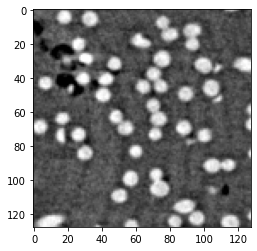

In [ ]:
plt.imshow(orig)

In [ ]:
# use the network to make predictions on the input image and find
# the class label index with the largest corresponding probability

preds = model.predict(image)
i = np.argmax(preds[0])

# decode the ImageNet predictions to obtain the human-readable label
decoded = imagenet_utils.decode_predictions(preds)
(imagenetID, label, prob) = decoded[0][0]
label = "{}: {:.2f}%".format(label, prob * 100)
print("[INFO] {}".format(label))

[INFO] Petri_dish: 31.89%


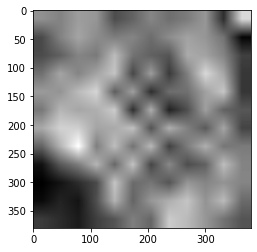

In [ ]:
# initialize our gradient class activation map and build the heatmap
cam = GradCAM(model, i)
heatmap,gradModel = cam.compute_heatmap(image=image,layerName=layerName)
plt.imshow(heatmap)


# resize the resulting heatmap to the original input image dimensions
# and then overlay heatmap on top of the image
heatmap = cv2.resize(heatmap, (orig.shape[1], orig.shape[0]))
(heatmap, output) = cam.overlay_heatmap(heatmap, orig, alpha=0.5)

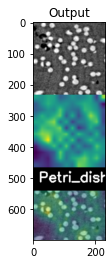

In [ ]:
# draw the predicted label on the output image
cv2.rectangle(output, (0, 0), (340, 40), (0, 0, 0), -1)
cv2.putText(output, label, (10, 25), cv2.FONT_HERSHEY_SIMPLEX,
	0.8, (255, 255, 255), 2)

# display the original image and resulting heatmap and output image
# to our screen
output = np.vstack([orig, heatmap, output])
output = imutils.resize(output, height=700)
plt_imshow("Output", output)

#Tentatives d'améliorations du modèle

##Try different base models

###EfficientNet models:

####EfficientNetB1:

In [ ]:
#loading the EfficientNet model:
base_model = EfficientNetB1(weights='imagenet',include_top=False)
# print(base_model.summary())

In [ ]:
#utilisation de la méthode fonctionnelle pour créer les différents modèles: 
listeB1=['block1b_project_conv','block2c_project_conv','block3c_project_conv','block4d_project_conv','block5c_project_conv','block6c_project_conv','block7b_project_conv']
block_train_features=[]
block_test_features=[]

for block in listeB1:
  print(block)
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  prev_model = prev_model(input)
  x=layers.GlobalAveragePooling2D()(prev_model)
  x=layers.Dropout(0.25)(x)
  output=layers.Flatten()(x)
  model=keras.Model(input,output,name=(block))
  # model.summary()
  # model.save(block)
  block_train_features.append(model.predict(x_train))
  block_test_features.append(model.predict(x_test))


block1b_project_conv
block2c_project_conv
block3c_project_conv
block4d_project_conv
block5c_project_conv
block6c_project_conv
block7b_project_conv


In [ ]:
class_num = 0
feature_level=[1,2,3,4,5,6,7]
res_maha=[]

for k in feature_level:
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    errs = emp_cov.mahalanobis(z_test)
    res_maha.append(roc_auc_score(y_test==class_num, errs))
    print('The AUC score for level %d is %.2f' % (k, res_maha[-1]))

The AUC score for level 1 is 0.49
The AUC score for level 2 is 0.76
The AUC score for level 3 is 0.78
The AUC score for level 4 is 0.79
The AUC score for level 5 is 0.79
The AUC score for level 6 is 0.78
The AUC score for level 7 is 0.69


####EfficientNetB6:

In [ ]:
#loading the EfficientNet model:
base_model = EfficientNetB6(weights='imagenet',include_top=False)
print(base_model.summary())

Model: "efficientnetb6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
rescaling_4 (Rescaling)         (None, None, None, 3 0           input_5[0][0]                    
__________________________________________________________________________________________________
normalization_4 (Normalization) (None, None, None, 3 7           rescaling_4[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, None, None, 3 0           normalization_4[0][0]            
_____________________________________________________________________________________

In [ ]:
#utilisation de la méthode fonctionnelle pour créer les différents modèles: 
listeB1=['block1c_project_conv','block2f_project_conv','block3f_project_conv','block4h_project_conv','block5h_project_conv','block6k_project_conv','block7c_project_conv']
block_train_features=[]
block_test_features=[]

for block in listeB1:
  print(block)
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  prev_model = prev_model(input)
  x=layers.GlobalAveragePooling2D()(prev_model)
  x=layers.Dropout(0.25)(x)
  output=layers.Flatten()(x)
  model=keras.Model(input,output,name=(block))
  # model.summary()
  # model.save(block)
  block_train_features.append(model.predict(x_train))
  block_test_features.append(model.predict(x_test))


block1c_project_conv
block2f_project_conv
block3f_project_conv
block4h_project_conv
block5h_project_conv
block6k_project_conv
block7c_project_conv


In [ ]:
class_num = 0
feature_level=[1,2,3,4,5,6,7]
res_maha=[]

for k in feature_level:
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    errs = emp_cov.mahalanobis(z_test)
    res_maha.append(roc_auc_score(y_test==class_num, errs))
    print('The AUC score for level %d is %.2f' % (k, res_maha[-1]))

The AUC score for level 1 is 0.50
The AUC score for level 2 is 0.77
The AUC score for level 3 is 0.78
The AUC score for level 4 is 0.79
The AUC score for level 5 is 0.79
The AUC score for level 6 is 0.55
The AUC score for level 7 is 0.53


###ResNet models:

####ResNet50:

In [ ]:
#loading the EfficientNet model:
base_model = ResNet50(weights='imagenet',include_top=False)
# print(base_model.summary())

In [ ]:
#utilisation de la méthode fonctionnelle pour créer les différents modèles: 
liste=['conv1_conv','conv2_block3_3_conv','conv3_block4_3_conv','conv4_block6_3_conv','conv5_block3_3_conv']
block_train_features=[]
block_test_features=[]

for block in liste:
  print(block)
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  prev_model = prev_model(input)
  x=layers.GlobalAveragePooling2D()(prev_model)
  x=layers.Dropout(0.25)(x)
  output=layers.Flatten()(x)
  model=keras.Model(input,output,name=(block))
  # model.summary()
  # model.save(block)
  block_train_features.append(model.predict(x_train))
  block_test_features.append(model.predict(x_test))


conv1_conv
conv2_block3_3_conv
conv3_block4_3_conv
conv4_block6_3_conv
conv5_block3_3_conv


In [ ]:
class_num = 1
feature_level=[1,2,3,4,5]
res_maha=[]

for k in feature_level:
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    errs = emp_cov.mahalanobis(z_test)
    res_maha.append(roc_auc_score(y_test==class_num, errs))
    print('The AUC score for level %d is %.2f' % (k, res_maha[-1]))

The AUC score for level 1 is 0.62
The AUC score for level 2 is 0.57
The AUC score for level 3 is 0.73
The AUC score for level 4 is 0.74
The AUC score for level 5 is 0.76


####Resnet152:

In [ ]:
#loading the EfficientNet model:
base_model = ResNet152(weights='imagenet',include_top=False)
# print(base_model.summary())

In [ ]:
#utilisation de la méthode fonctionnelle pour créer les différents modèles: 
liste=['conv1_conv','conv2_block3_3_conv','conv3_block3_3_conv','conv4_block36_3_conv','conv5_block3_3_conv']
block_train_features=[]
block_test_features=[]

for block in liste:
  print(block)
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  prev_model = prev_model(input)
  x=layers.GlobalAveragePooling2D()(prev_model)
  x=layers.Dropout(0.25)(x)
  output=layers.Flatten()(x)
  model=keras.Model(input,output,name=(block))
  # model.summary()
  # model.save(block)
  block_train_features.append(model.predict(x_train))
  block_test_features.append(model.predict(x_test))


conv1_conv
conv2_block3_3_conv
conv3_block3_3_conv
conv4_block36_3_conv
conv5_block3_3_conv


In [ ]:
class_num = 1
feature_level=[1,2,3,4,5]
res_maha=[]

for k in feature_level:
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    errs = emp_cov.mahalanobis(z_test)
    res_maha.append(roc_auc_score(y_test==class_num, errs))
    print('The AUC score for level %d is %.2f' % (k, res_maha[-1]))

The AUC score for level 1 is 0.67
The AUC score for level 2 is 0.43
The AUC score for level 3 is 0.57
The AUC score for level 4 is 0.75
The AUC score for level 5 is 0.70


####ResNet50V2:

In [ ]:
#loading the EfficientNet model:
base_model = ResNet50V2(weights='imagenet',include_top=False)
liste=['pool1_pool', 'conv2_block3_3_conv','conv3_block4_3_conv','conv4_block6_3_conv','conv5_block3_3_conv']
# print(base_model.summary())

94674944/94668760 [==============================] - 0s 0us/step


In [ ]:
#utilisation de la méthode fonctionnelle pour créer les différents modèles: 
liste=['pool1_pool', 'conv2_block3_3_conv','conv3_block4_3_conv','conv4_block6_3_conv','conv5_block3_3_conv']
block_train_features=[]
block_test_features=[]

for block in liste:
  print(block)
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  prev_model = prev_model(input)
  x=layers.GlobalAveragePooling2D()(prev_model)
  x=layers.Dropout(0.25)(x)
  output=layers.Flatten()(x)
  model=keras.Model(input,output,name=(block))
  # model.summary()
  # model.save(block)
  block_train_features.append(model.predict(x_train))
  block_test_features.append(model.predict(x_test))


pool1_pool
conv2_block3_3_conv
conv3_block4_3_conv
conv4_block6_3_conv
conv5_block3_3_conv


In [ ]:
class_num = 1
feature_level=[1,2,3,4,5]
res_maha=[]

for k in feature_level:
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    errs = emp_cov.mahalanobis(z_test)
    res_maha.append(roc_auc_score(y_test==class_num, errs))
    print('The AUC score for level %d is %.2f' % (k, res_maha[-1]))

The AUC score for level 1 is 0.81
The AUC score for level 2 is 0.52
The AUC score for level 3 is 0.91
The AUC score for level 4 is 0.95
The AUC score for level 5 is 0.89


####ResNet102V2:

In [ ]:
#loading the EfficientNet model:
base_model = ResNet101V2(weights='imagenet',include_top=False)
# print(base_model.summary())

In [ ]:
#utilisation de la méthode fonctionnelle pour créer les différents modèles: 
liste=['pool1_pool', 'conv2_block3_3_conv','conv3_block4_3_conv','conv4_block23_2_conv','conv5_block3_3_conv']
block_train_features=[]
block_test_features=[]

for block in liste:
  print(block)
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  prev_model = prev_model(input)
  x=layers.GlobalAveragePooling2D()(prev_model)
  x=layers.Dropout(0.25)(x)
  output=layers.Flatten()(x)
  model=keras.Model(input,output,name=(block))
  # model.summary()
  # model.save(block)
  block_train_features.append(model.predict(x_train))
  block_test_features.append(model.predict(x_test))


pool1_pool
conv2_block3_3_conv
conv3_block4_3_conv
conv4_block23_2_conv
conv5_block3_3_conv


In [ ]:
class_num = 1
feature_level=[1,2,3,4,5]
res_maha=[]

for k in feature_level:
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    errs = emp_cov.mahalanobis(z_test)
    res_maha.append(roc_auc_score(y_test==class_num, errs))
    print('The AUC score for level %d is %.2f' % (k, res_maha[-1]))

The AUC score for level 1 is 0.78
The AUC score for level 2 is 0.72
The AUC score for level 3 is 0.75
The AUC score for level 4 is 0.66
The AUC score for level 5 is 0.62


####ResNet152V2:

In [ ]:
#loading the EfficientNet model:
base_model = ResNet152V2(weights='imagenet',include_top=False)
print(base_model.summary())

234553344/234545216 [==============================] - 2s 0us/step
Model: "resnet152v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_17 (InputLayer)           [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_17[0][0]                   
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, None, None, 6 0           conv1_conv[0][0]                 
_____________________

In [ ]:
#utilisation de la méthode fonctionnelle pour créer les différents modèles: 
liste=['pool1_pool', 'conv2_block3_3_conv','conv3_block8_3_conv','conv4_block36_3_conv','conv5_block3_3_conv']
block_train_features=[]
block_test_features=[]

for block in liste:
  print(block)
  prev_model=keras.Model(base_model.input, base_model.get_layer(block).output, name="level_without_average_pooling")
  input=base_model.input
  prev_model = prev_model(input)
  x=layers.GlobalAveragePooling2D()(prev_model)
  x=layers.Dropout(0.25)(x)
  output=layers.Flatten()(x)
  model=keras.Model(input,output,name=(block))
  # model.summary()
  # model.save(block)
  block_train_features.append(model.predict(x_train))
  block_test_features.append(model.predict(x_test))


pool1_pool
conv2_block3_3_conv
conv3_block8_3_conv
conv4_block36_3_conv
conv5_block3_3_conv


In [ ]:
class_num = 1
feature_level=[1,2,3,4,5]
res_maha=[]

for k in feature_level:
    errs = []
    level = k
    z_train = block_train_features[k-1]
    z_test = block_test_features[k-1]
    emp_cov = EmpiricalCovariance().fit(z_train)
    errs = emp_cov.mahalanobis(z_test)
    res_maha.append(roc_auc_score(y_test==class_num, errs))
    print('The AUC score for level %d is %.2f' % (k, res_maha[-1]))

The AUC score for level 1 is 0.78
The AUC score for level 2 is 0.68
The AUC score for level 3 is 0.70
The AUC score for level 4 is 0.62
The AUC score for level 5 is 0.73


##Concat featres maps of different levels:

In [ ]:
#Concaténation de features maps de différents levels
block_train_concat = block_train_features[0]
for i in range(len(block_train_features)-1):
  i=i+1
  block_train_concat = np.append(block_train_concat,block_train_features[i],axis=1)
print(block_train_concat.shape)

block_test_concat = block_test_features[0]
for i in range(len(block_test_features)-1):
  i=i+1
  block_test_concat = np.append(block_test_concat,block_test_features[i],axis=1)
print(block_test_concat.shape)

(800, 1104)
(200, 1104)


In [ ]:
errs = []
z_train = block_train_concat
z_test = block_test_concat
emp_cov = EmpiricalCovariance().fit(z_train)
errs = emp_cov.mahalanobis(z_test)
res_maha.append(roc_auc_score(y_test[0:num_test]==class_num, errs))
print('The AUC score for the concat of all levels  is %.2f' % (res_maha[-1]))

The AUC score for the concat of all levels  is 0.80


In [ ]:
block_train_concat = []
for i in range(len(block_train_features)):
  for j in range(len(block_train_features)):
    if j != i:
      block_train_concat.append(np.append(block_train_features[i],block_train_features[j],axis=1))

print(len(block_train_concat))

block_test_concat = []
for i in range(len(block_test_features)):
  for j in range(len(block_test_features)):
    if j != i:
      block_test_concat.append(np.append(block_test_features[i],block_test_features[j],axis=1))

print(len(block_test_concat))

42
42


In [ ]:
for k in range(len(block_train_concat)):
    errs = []
    ij = k
    z_train = block_train_concat[k]
    z_test = block_test_concat[k]
    emp_cov = EmpiricalCovariance().fit(z_train)
    errs = emp_cov.mahalanobis(z_test)
    res_maha.append(roc_auc_score(y_test[0:num_test]==class_num, errs))
    print('The AUC score for ij %d is %.2f' % (k, res_maha[-1]))

The AUC score for ij 0 is 0.69
The AUC score for ij 1 is 0.71
The AUC score for ij 2 is 0.74
The AUC score for ij 3 is 0.74
The AUC score for ij 4 is 0.75
The AUC score for ij 5 is 0.77
The AUC score for ij 6 is 0.69
The AUC score for ij 7 is 0.81
The AUC score for ij 8 is 0.78
The AUC score for ij 9 is 0.78
The AUC score for ij 10 is 0.78
The AUC score for ij 11 is 0.79
The AUC score for ij 12 is 0.71
The AUC score for ij 13 is 0.81
The AUC score for ij 14 is 0.80
The AUC score for ij 15 is 0.80
The AUC score for ij 16 is 0.79
The AUC score for ij 17 is 0.79
The AUC score for ij 18 is 0.74
The AUC score for ij 19 is 0.78
The AUC score for ij 20 is 0.80
The AUC score for ij 21 is 0.79
The AUC score for ij 22 is 0.79
The AUC score for ij 23 is 0.79
The AUC score for ij 24 is 0.74
The AUC score for ij 25 is 0.78
The AUC score for ij 26 is 0.80
The AUC score for ij 27 is 0.79
The AUC score for ij 28 is 0.79
The AUC score for ij 29 is 0.78
The AUC score for ij 30 is 0.75
The AUC score for 

##Analyse:

The best level is 1, whose AUC score is 0.49


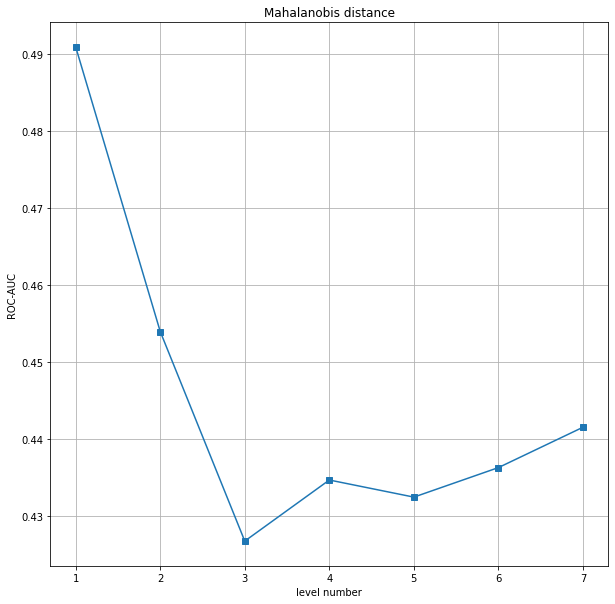

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(feature_level, res_maha, 's-')
best_res = max(res_maha)
best_level = feature_level[np.argmax(res_maha)]
print('The best level is %d, whose AUC score is %.2f' % (best_level, best_res))

plt.xlabel('level number')
plt.title('Mahalanobis distance')
plt.ylabel('ROC-AUC')
plt.grid('on')
plt.show()

IndexError: ignored

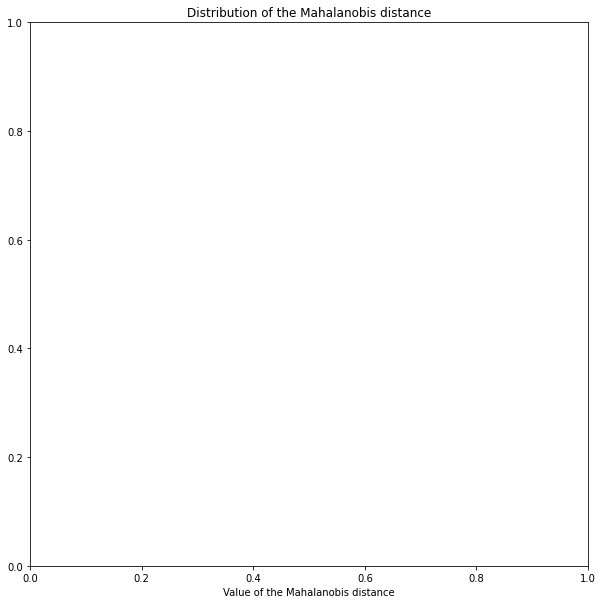

In [ ]:
col = ['r','b']
plt.figure(figsize=(10, 10))
plt.xlabel('Value of the Mahalanobis distance')
plt.title('Distribution of the Mahalanobis distance')

for i in range(2):
    errs_plot = errs[y_test==i]
    plt.hist(errs_plot, 20, density=True, facecolor=col[i], alpha=0.1)
    print("Reconstruction error for label %s : %.6f " % (i, np.mean(errs_plot)))
plt.show()

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test==0, errs, drop_intermediate=False)
AUC = auc(fpr, tpr)
plot_AUC(fpr,tpr,AUC,'Mahalanobis distance')

### Analyse et distance de mahalanobis

In [ ]:
#mahalanobis distance :
errs=anomaly_detect_mahalanobis(x_train_features=x_train_features, x_test_features=x_test_features)

In [ ]:
#compute roc_auc_score: 
from sklea ...
res_maha=roc_auc_score(y_test==0,errs)